In [1]:
# -*- coding: utf-8 -*-
"""
@author: parisa.rahdan

To see how each figure in the paper is made, search the name (e.g. Figure x, Supplementary Figure X) in this notebook. Some Figures may 
be divided into multiple celss for each subfigure.
To recreate the figures, you need to either download the solved networks from the zenodo repository, or the CSV files available in 
this repository. 
"""

In [ ]:
import pypsa
import openpyxl
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import matplotlib.patches as mpatches
from pypsa.plot import projected_area_factor
from matplotlib.patches import Circle, Ellipse, Patch
from matplotlib.legend_handler import HandlerPatch
from matplotlib.lines import Line2D
import cartopy.crs as ccrs
import cartopy 
import geopandas as gpd
import logging
import warnings
warnings.filterwarnings('ignore')
logger = logging.getLogger()
logger.setLevel(logging.CRITICAL)


plt.rc('font',family='Ubuntu')
plt.rc('axes',edgecolor='gainsboro')
plt.rcParams['hatch.linewidth'] = 0.2

In [2]:
from matplotlib import cm
import matplotlib

norm = matplotlib.colors.Normalize(vmin=0, vmax=1)
color_list=[cm.plasma(norm(j),bytes=True) for j in np.arange(0.55,1,0.09) ]
new_colors=[tuple([i/255.0 for i in j]) for j in color_list]

tech_colors= {
    'Transmission lines': "grey",
     'transmission': "nucleargrey",
    'Battery storage' : '#80c944' ,
    'Battery store' : '#80c944' ,
    'battery storage' : '#80c944' ,
    'battery charger' : '#80c944' ,
    'battery discharger' :'#80c944' ,# 'darkgreen' , 
    'battery' : '#80c944', #'darkgreen' ,        
    'Home battery storage' : '#ace37f'  ,
    'home battery charger' : '#ace37f'  ,
    'home battery discharger' : '#ace37f' ,    
    'home battery' : '#ace37f' ,    
    'Home battery store' : '#ace37f' ,    
    'H2 Fuel Cell': '#c251ae',
    'H2 Electrolysis': '#ff29d9',
    'H2 pipeline' : 'plum',
     'H2 pipeline retrofitted' :'plum',
    'SMR': '#870c71',
    'SMR CC': '#8a1caf',# '#4f1745',
    'Sabatier' : '#4f1745',
    'urban central solid biomass CHP':'darkolivegreen',
    'helmeth' : '#4f1745',
    'co2':'linen',
    'co2 vent':'linen',
    'co2 stored':'peachpuff',
    'Electricity distribution grid': 'darkgrey',
    'electricity distribution grid': 'darkgrey',
    'distribution grid': 'darkgrey',
    'uranium': '#ff8c00',
    "onwind": "#235ebc",
    "Onshore wind": "#235ebc",
    "onshore wind": "#235ebc",
    'offwind': "#6895dd",
    'offwind-ac': "#6895dd",
    'Offshore wind': "#6895dd",
    'offshore wind': "#6895dd",
    'offshore wind ac': "#6895dd",
    'offwind-dc': "#74c6f2",
    'offwind-float': "navy",
    'Offwind-float': "navy",
    'offshore wind dc': "#74c6f2",
    "Hydroelectricity": "#08ad97",
    "hydro": "teal", #"#08ad97",
    "hydro+PHS": "#08ad97",
    "PHS": "#08ad97",
    "Pumped hydro storage": "teal",
    "hydro reservoir": "#08ad97",
    'hydroelectricity': '#08ad97',
    "ror": "#4adbc8",
    "Run of river": "#4adbc8",
    'Solar': "#f9d002",
    'Solar utility': "#f9d002",
    'solar': "#f9d002",
    'solar PV': "#f9d002",
    'Solar rooftop' : 'orange',
    'solar rooftop' : 'orange',
    'solar thermal': '#ffef60',
    'biomass': '#0c6013',
    'solid biomass': '#06540d',
    'biomass boiler': '#0c6013',
    'biogas': '#23932d',
    'biogas store': '#23932d',
    'waste': '#68896b',
    'geothermal': '#ba91boffwi1',
    "OCGT": "#f7022a", #"#d35050",
    "gas": "#d35050",
    "gas storage": "crimson", 
    "CCGT": "#d35050",
    "natural gas": "#d35050",
    "CCGT": "#b20101",
    "Nuclear": "#59656d", #"rosybrown",
    "nuclear": "#59656d", #"rosybrown",
    "coal": "black", #"#707070",
    "lignite": "#9e5a01",
    "oil": "#262626",
    "Oil to power/heat": "#262626",
    "H2 storage": "#ea048a",
    "hydrogen storage": "#ea048a",
    "Electric load": "#f9d002",
    "lines": "#70af1d",
    "transmission lines": "#70af1d",
    "AC-AC": "#70af1d",
    "AC line": "#70af1d",
    "AC": "#70af1d",
    "links": "#8a1caf",
    "HVDC links": "#8a1caf",
    "DC-DC": "#8a1caf",
    "DC": "#8a1caf",
    "DC link": "#8a1caf",
    'Solar thermal': 'darkgoldenrod',
    "Gas to power/heat": "#d35050",
    "Oil and gas to power/heat": "#d35050",
    "Oil and gas to heat": "salmon",
    "Coal": "black", #"#707070",
    "Power to liquid": '#4f1745',
    "methanolisation": '#4f1745',
    "Power to gas":'#870c71',
    "Power to heat":'maroon',
    "Biomass":'#06540d',
    "Biogas":'#23932d',
    "BEV charger":'rebeccapurple',
    'EV battery':'mediumslateblue',
    "V2G":'mediumpurple',
    "DAC":'plum', #'lightcoral','#ff5270', #
    "hot water storage":"#ffb07c",# "brown",
    "Heat storage":"#ffb07c",# "brown",
    "Heat store":"#ffb07c",
     "gas CHP": "#be0119",#"maroon", #
     "central gas CHP": "maroon",
     "gas CHP CC" : '#8d5e56',
     "biomass CHP": "darkolivegreen",
     "biomass CHP CC" : '#6c5d28',
     "solid biomass CHP": "darkolivegreen",
     "resistive heater": "#dc4d01", #"indianred",
     "air heat pump":"chocolate",
     "ground heat pump": "sandybrown",
    'industry' : 'black',
    'industry gas' : 'darkred',
    'gas for industry' : '#b27a01',#'#853403' ,#'darkred',
    'gas for industry CC' : 'red',
    'industry biomass' : 'olive',
    "Fischer-Tropsch":"#02d8e9", #"#5a86ad",
    "Fischer":"#5a86ad",
    'biogas to gas':'greenyellow',
    "heat pump":"#ca7b80", #'darkslategrey',
    'methanol' :'#4f1745',
    'industry methanol' :'#4f1745',
    "gas for power" : "red",
    "gas boiler": "#cb416b",#"crimson", 
    "central gas boiler": "crimson", 
    "industry": 'black',
    'H2 Store':'purple',
    'H2 store':'purple',
    'H2':'purple',
    'load':'black',
    'solar-delta': 'yellow',
    'Solar-Delta': 'yellow',
    'solar-Delta': 'yellow',
    'solar-delta10': 'yellow',
    'solar-delta20': 'yellow',
    'solar-hsat inv': 'goldenrod' ,
    'Solar-HSAT': '#ffef60' ,#'darkgoldenrod',
    'solar-HSAT': '#ffef60' ,#'darkgoldenrod',
    'solar-hsat': '#ffef60' ,#'darkgoldenrod',
    'solar-hsat-inv-1.3': 'salmon' ,
    'solar-hsat-inv-1.5': 'red' ,
    'solar-hsat-inv-1.7': 'orangered',
    "solar-hsat-inv-1.9": "darkred",
    "solar-E": "khaki",
    'solar-E-60':'darkkhaki',
    'solar-SE':'lightsalmon' ,
    'solar-SW':'darksalmon',
    'solar-W':'peachpuff',
    'solar-W-60':"#ffa756",  #pale orange
    "solar rooftop east": "khaki",
    'solar rooftop east_60':'darkkhaki',
    'solar rooftop southeast':'lightsalmon' ,
    'solar rooftop southwest':'darksalmon',
    'solar rooftop southeast-inv-1.9':'lightsalmon' ,
    'solar rooftop southwest-inv-1.9':'darksalmon',
    'solar rooftop west':'peachpuff',
    'solar rooftop west_60':'sandybrown',
    'solar rooftop delta': 'yellow',
    'solar rooftop delta10': 'olive',
    'solar rooftop delta20': 'darkkhaki',
    'solar rooftop-delta': 'olive',
    'solar-inv':'darkgoldenrod',
    'solar inv': "#f9d002",#'darkgoldenrod',
    'solar rooftop-inv': 'salmon',
    'solar-inv-1.3': new_colors[1], #'yellow',
    'solar-inv-1.5': new_colors[2], #'yellow',
    'solar-inv-1.7': 'goldenrod', #new_colors[3], #'yellow',
    "solar-inv-1.9": 'darkgoldenrod' ,#new_colors[4], #'yellow',
    'solar rooftop-inv-1.3': 'yellow',
    'solar rooftop-inv-1.5': 'goldenrod' ,
    'solar rooftop-inv-1.7': '#ffa756',
    "solar rooftop-inv-1.9": "khaki",
    'agriculture machinery oil': "#606602",
    'kerosene for aviation': "dimgrey",
    'land transport oil': "darkkhaki",
    'naphtha for industry': "lightgray",
    'shipping methanol': "darkslategrey",
     "shipping oil": "navy",
    'gas pipeline new': 'darkred',
    'gas pipeline': 'sienna',
    'solid biomass transport':'#06540d',
    'CO2 pipeline' :'gold' , 
    'co2 sequestered' :'thistle' , 
    'process emissions': 'olive',
    'process emissions CC': 'olivedrab',
    'offshore wind (AC)': "#6895dd",
    'offshore wind ac': "#6895dd",
    'offwind-dc': "#74c6f2",
    'offshore wind (DC)': "#74c6f2",
    'rural heat': '#ff5c5c',
    'urban central heat': '#d15959',
     'urban decentral heat': '#a33c3c',
    'urban central heat vent': '#a74747',
    'low-temperature heat for industry': '#b66325', #'#8f2727',
    'agriculture heat': '#d9a5a5',
    'H2 for industry': "#f073da",
    'H2 for shipping': "#ebaee0",
    'agriculture electricity': "#494778", # '#494778',
    'solid biomass for industry': '#7a6d26',
    'solid biomass for industry CC': '#7a6d26',
    'land transport EV': '#baf238',
    'gas store': 'darkred',
    'generators-gas': 'sienna',
    "electricity": "#110d63", #"#f9d002",
    "industry electricity": "#2d2a66", #"dimgrey",
    'CHP' :'darkred',
    'heat' :'darkred',
}

In [3]:
opt_name = {
    "Store": "e",
    "Line": "s",
    "Transformer": "s"
}
def calculate_costs(n, label, costs):

    for c in n.iterate_components(n.branch_components|n.controllable_one_port_components^{"Load"}):
        capital_costs = c.df.capital_cost*c.df[opt_name.get(c.name,"p") + "_nom_opt"]
        capital_costs_grouped = capital_costs.groupby(c.df.carrier).sum()

        capital_costs_grouped = pd.concat([capital_costs_grouped], keys=["capital"])
        capital_costs_grouped = pd.concat([capital_costs_grouped], keys=[c.list_name])

        costs = costs.reindex(capital_costs_grouped.index.union(costs.index))

        costs.loc[capital_costs_grouped.index, label] = capital_costs_grouped

        if c.name == "Link":
            p = c.pnl.p0.multiply(n.snapshot_weightings.generators, axis=0).sum()
        elif c.name == "Line":
            continue
        elif c.name == "StorageUnit":
            p_all = c.pnl.p.multiply(n.snapshot_weightings.generators, axis=0)
            p_all[p_all < 0.] = 0.
            p = p_all.sum()
        else:
            p = c.pnl.p.multiply(n.snapshot_weightings.generators, axis=0).sum()

        #correct sequestration cost
        if c.name == "Store":
            items = c.df.index[(c.df.carrier == "co2 stored") & (c.df.marginal_cost <= -100.)]
            c.df.loc[items, "marginal_cost"] = -20.

        marginal_costs = p*c.df.marginal_cost

        marginal_costs_grouped = marginal_costs.groupby(c.df.carrier).sum()

        marginal_costs_grouped = pd.concat([marginal_costs_grouped], keys=["marginal"])
        marginal_costs_grouped = pd.concat([marginal_costs_grouped], keys=[c.list_name])

        costs = costs.reindex(marginal_costs_grouped.index.union(costs.index))

        costs.loc[marginal_costs_grouped.index,label] = marginal_costs_grouped

    # add back in all hydro
    #costs.loc[("storage_units", "capital", "hydro"),label] = (0.01)*2e6*n.storage_units.loc[n.storage_units.group=="hydro", "p_nom"].sum()
    #costs.loc[("storage_units", "capital", "PHS"),label] = (0.01)*2e6*n.storage_units.loc[n.storage_units.group=="PHS", "p_nom"].sum()
    #costs.loc[("generators", "capital", "ror"),label] = (0.02)*3e6*n.generators.loc[n.generators.group=="ror", "p_nom"].sum()

    return costs

def generation(n, carriers=None):

    dispatch = n.generators_t.p 

    generation = n.snapshot_weightings.generators @ (dispatch) #n.snapshot_weightings.generators

    generation = (
        generation.groupby([n.generators.bus.map(n.buses.location), n.generators.carrier])
        .sum()
        .unstack()
    )
    
    links_gen= (-1) *n.snapshot_weightings.generators @(n.links_t.p1)
    links_gen = (links_gen.groupby([n.links.bus1.map(n.buses.location), n.links.carrier])
        .sum()
        .unstack()
    )
    for i in links_gen['nuclear'].index:
      if 'EU' not in i :  
            generation.loc[ ( i, "nuclear" ) ]=links_gen['nuclear'].loc[i]
    for i in links_gen['OCGT'].index:
            generation.loc[ ( i, "gas" ) ]=links_gen['OCGT'].loc[i] + links_gen['CCGT'].loc[i]        

    if carriers is not None:
        generation = generation[carriers]

    return generation.drop("EU", axis=0).stack().div(1e6)

carriers = {
        "offwind-ac": "Offshore Wind (AC)",
        "offwind-dc": "Offshore Wind (DC)",
        "onwind": "Onshore Wind",
        "ror": "Run of River",
        "solar": "Utility-scale Solar PV",
        "solar rooftop": "Rooftop Solar PV",
        "solar-h": "H-tracking Solar PV",
        #"solar-th": "TH-tracking Solar PV",
        "solar-delta": "Delta-shaped Solar PV",
        "nuclear" : 'Nuclear'
    }

from pypsa.plot import projected_area_factor
from matplotlib.patches import Circle, Ellipse, Patch
from matplotlib.legend_handler import HandlerPatch
from matplotlib.lines import Line2D

class HandlerCircle(HandlerPatch):
    """
    Legend Handler used to create circles for legend entries.

    This handler resizes the circles in order to match the same dimensional
    scaling as in the applied axis.
    """

    def create_artists(
        self, legend, orig_handle, xdescent, ydescent, width, height, fontsize, trans
    ):
        fig = legend.get_figure()
        ax = legend.axes

        unit = np.diff(ax.transData.transform([(0, 0), (1, 1)]), axis=0)[0][1]
        radius = orig_handle.get_radius() * unit * (72 / fig.dpi)
        center = 5 - xdescent, 3 - ydescent
        p = plt.Circle(center, radius)
        self.update_prop(p, orig_handle, legend)
        p.set_transform(trans)
        return [p]


def make_legend_circles_for(sizes, scale=1.0, **kw):
    return [Circle((0, 0), radius=(s / scale)**0.5, **kw) for s in sizes]

def add_legend_circles(
    ax, sizes, labels, scale=1, srid=None, patch_kw={}, legend_kw={}
):

    if srid is not None:
        area_correction = projected_area_factor(ax, n.srid) ** 2
        sizes = [s * area_correction for s in sizes]

    handles = make_legend_circles_for(sizes, scale, **patch_kw)

    legend = ax.legend(
        handles, labels, handler_map={Circle: HandlerCircle()}, **legend_kw
    )

    ax.add_artist(legend)


def add_legend_lines(ax, sizes, labels, scale=1, patch_kw={}, legend_kw={}):

    handles = [Line2D([0], [0], linewidth=s / scale, **patch_kw) for s in sizes]

    legend = ax.legend(handles, labels, **legend_kw)

    ax.add_artist(legend)


def add_legend_patch(ax, colors, labels, patch_kw={}, legend_kw={}):

    handles = [Patch(facecolor=c, **patch_kw) for c in colors]

    legend = ax.legend(handles, labels, **legend_kw)

    ax.add_artist(legend)

#gen = generation(n, carriers.keys())

In [4]:
import logging
import sys

import numpy as np
import pandas as pd
import pypsa
#from prepare_sector_network import prepare_costs

idx = pd.IndexSlice
logger = logging.getLogger(__name__)
opt_name = {"Store": "e", "Line": "s", "Transformer": "s"}


def assign_carriers(n):
    if "carrier" not in n.lines:
        n.lines["carrier"] = "AC"


def assign_locations(n):
    for c in n.iterate_components(n.one_port_components | n.branch_components):
        ifind = pd.Series(c.df.index.str.find(" ", start=4), c.df.index)
        for i in ifind.unique():
            names = ifind.index[ifind == i]
            c.df.loc[names, "location"] = "" if i == -1 else names.str[:i]
            
def calculate_nodal_capacities(n, label, nodal_capacities):
    # Beware this also has extraneous locations for country (e.g. biomass) or continent-wide (e.g. fossil gas/oil) stuff
    for c in n.iterate_components(
        n.branch_components | n.controllable_one_port_components ^ {"Load"}
    ):
        nodal_capacities_c = c.df.groupby(["location", "carrier"])[
            opt_name.get(c.name, "p") + "_nom_opt"
        ].sum()
        index = pd.MultiIndex.from_tuples(
            [(c.list_name,) + t for t in nodal_capacities_c.index.to_list()]
        )
        nodal_capacities = nodal_capacities.reindex(index.union(nodal_capacities.index))
        nodal_capacities.loc[index, label] = nodal_capacities_c.values

    return nodal_capacities

def calculate_nodal_costs(n, label, nodal_costs):
    # Beware this also has extraneous locations for country (e.g. biomass) or continent-wide (e.g. fossil gas/oil) stuff
    for c in n.iterate_components(
        n.branch_components | n.controllable_one_port_components ^ {"Load"}
    ):
        c.df["capital_costs"] = (
            c.df.capital_cost * c.df[opt_name.get(c.name, "p") + "_nom_opt"]
        )
        capital_costs = c.df.groupby(["location", "carrier"])["capital_costs"].sum()
        index = pd.MultiIndex.from_tuples(
            [(c.list_name, "capital") + t for t in capital_costs.index.to_list()]
        )
        nodal_costs = nodal_costs.reindex(index.union(nodal_costs.index))
        nodal_costs.loc[index, label] = capital_costs.values

        if c.name == "Link":
            p = c.pnl.p0.multiply(n.snapshot_weightings.generators, axis=0).sum()
        elif c.name == "Line":
            continue
        elif c.name == "StorageUnit":
            p_all = c.pnl.p.multiply(n.snapshot_weightings.generators, axis=0)
            p_all[p_all < 0.0] = 0.0
            p = p_all.sum()
        else:
            p = c.pnl.p.multiply(n.snapshot_weightings.generators, axis=0).sum()

        # correct sequestration cost
        if c.name == "Store":
            items = c.df.index[
                (c.df.carrier == "co2 stored") & (c.df.marginal_cost <= -100.0)
            ]
            c.df.loc[items, "marginal_cost"] = -20.0

        c.df["marginal_costs"] = p * c.df.marginal_cost
        marginal_costs = c.df.groupby(["location", "carrier"])["marginal_costs"].sum()
        index = pd.MultiIndex.from_tuples(
            [(c.list_name, "marginal") + t for t in marginal_costs.index.to_list()]
        )
        nodal_costs = nodal_costs.reindex(index.union(nodal_costs.index))
        nodal_costs.loc[index, label] = marginal_costs.values

    return nodal_costs

In [6]:
## Overnight runs: Solved networks can be found on the Zenodo repository, or recreated with
## the latest version of pypsa-eur using the config file stored in this repository


In [21]:
## Constant demand reduction 

main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIelecI{}_2050.nc':[['p05','p10','p20','p30','p40',],'Electricity demand reduction' ] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIheatI{}_2050.nc':[['p05','p10-lowtol','p20-lowtol','p30-lowtol','p40-lowtol',],'Heat demand reduction'] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIinduI{}_2050.nc':[['p05','p10','p20','p30','p40',],'Industry demand reduction']  ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmItranI{}_2050.nc':[['p05','p10','p20','p30-lowtol','p40',],'Land-transport demand reduction']  ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIshipI{}_2050.nc':[['p05','p10','p20','p30','p40',],'Shipping demand reduction']  ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIaviaI{}_2050.nc':[['p05','p10','p20','p30-lowtol','p40',],'Aviation demand reduction']  ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIagriI{}_2050.nc':[['p05','p10-lowtol','p20','p30','p40'],'Agriculture demand reduction']  ,  ## p90 available
}



In [67]:
## Peak shaving

main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemIelecI{}_2050.nc':[['p05','p10','p15','p20','p25-lowtol','p30','p35-lowtol','p40', 'p45', 'p50'],'Electricity demand reduction' ] , #'p25','p30',
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemIheatI{}_2050.nc':[['p05','p10','p15','p20','p25','p30','p35','p40', 'p45', 'p50'],'Heat demand reduction'] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemItranI{}_2050.nc':[['p05','p10','p15','p20-lowtol','p25','p30','p35','p40', 'p45', 'p50'],'Land-transport demand reduction']  ,
}

In [12]:
## Free storage peak shaving
#!!! V2G disabled for land transport unless 'wv2g' !!!
main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-nov2g_2050.nc':[[''],'Land-transport Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemIelecI{}_2050.nc':[['p0.02-lowv','p0.04-lowv','p0.06-lowv','p0.08-lowv','p0.1-lowv',],'Electricity demand reduction' ] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemIheatI{}_2050.nc':[['p0.02','p0.04','p0.06','p0.08','p0.1',],'Heat demand reduction'] ,
    # 'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemItranI{}_2050.nc':[['p0.02','p0.04','p0.06','p0.08','p0.1',],'Land-transport demand reduction']  ,
     'sens_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemItranI{}-wv2g_2050.nc':[['p0.1',],'Land-transport demand reduction']  ,
}

In [12]:
## load shedding

main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   , #'p100000','p10000','p1000',p5000','p2500',
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemIelecI{}_2050.nc':[['p1000','p950-lowtol', 'p850-lowtol','p800', 'p750-lowtol','p700-lowtol','p650-lowtol','p600-lowtol','p550-lowtol', 'p549-lowtol','p500-lowtol','p450-lowtol','p400','p350-lowtol','p300', 'p250','p200-lowtol'],'Electricity demand reduction' ] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemIheatI{}_2050.nc':[['p1000','p950','p850','p800','p750-lowtol','p700','p650','p600','p550-lowtol','p500','p450','p400','p350','p300','p250-lowtol','p200'],'Heat demand reduction'] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemItranI{}_2050.nc':[['p1000','p950','p850','p800','p750','p700','p650','p600','p550','p500','p450','p400','p350','p300','p250','p200'],'Land-transport demand reduction']  ,
}

In [7]:
## Customize plotting and renaming 
plt.rc('axes',edgecolor='gainsboro')

plt.rcParams['axes.facecolor'] = 'whitesmoke'
plt.rcParams['figure.facecolor'] = 'white'

plt.rcParams.update({"axes.grid" : True, "grid.color" :"white" , "grid.linestyle":"dashed"})

carrier_names ={
       "elec": ["electricity"],
       "heat": ['urban central heat', 'rural heat', 'urban decentral heat'],
       "tran": ['land transport EV', 'land transport oil',#'shipping methanol','kerosene for aviation','shipping oil',
               ],
       "indu": ['solid biomass for industry',
       'gas for industry', 'H2 for industry', 'naphtha for industry', 'low-temperature heat for industry', 
            'industry electricity','coal for industry',],
       "agri": ['agriculture electricity', 'agriculture heat',
       'agriculture machinery oil',],
       "avia" : ["kerosene for aviation"],
       "ship" : ["shipping methanol"],
     }
sector="tran"
factor='p05'
load_change_factor = (1-int(factor[1:])/100) if factor[0]=='p' else (1+int(factor[1:])/100)
sector_loads =  carrier_names[sector]

rename={'battery':'Battery store','battery charger':'Battery storage','battery discharger':'Battery storage',
                          'home battery':'Home battery store','home battery charger':'Home battery storage','home battery discharger':'Home battery storage',                                                       
                          'offwind':'Offshore wind', 'offwind-ac':'Offshore wind','offwind-dc':'Offshore wind', 'onwind':'Onshore wind',
                          'AC':'Transmission lines'  , 'DC':'Transmission lines','ror': 'Run of river',
                          'hydro':'Hydroelectricity' , 'nuclear':'Nuclear','uranium':'Nuclear',
                          'solar':'Solar utility', 'solar rooftop':'Solar rooftop',
                          'electricity distribution grid' : 'Electricity distribution grid',
                           'PHS' : 'Pumped hydro storage', 'H2':'H2 storage',
                           'SMR':'Power to gas'  , 'SMR CC':'Power to gas','oil': 'Oil to power/heat',
                           'Fischer-Tropsch':'Power to liquid', 'methanolisation':'Power to liquid',
                           'Sabatier':'Power to gas', 'helmeth':'Power to gas', 'coal' : 'Coal', 'lignite' :'Coal',
                            "solar-delta": "Solar-delta",'Li ion':'EV battery',
                          }

sector_colors = {
    "Agriculture" : 'darkolivegreen',
    "Land-transport": "chocolate",
    "Electricity" :"navy" ,
    "Heat" :"darkred" ,
    "Industry" :"black" ,
     "Shipping" :"dodgerblue" ,
    "Aviation" :"purple" ,
   }

sector_long_names = {
    "agri" : 'Agriculture',
    "tran": "Land-transport",
    "elec" :"Electricity" ,
    "heat" :"Heat" ,
    "indu" :"Industry" ,
     "ship" :"Shipping" ,
    "avia" :"Aviation" ,
   }

sector_colors_ = {
    "agri" : 'darkolivegreen',
    "tran": "chocolate",
    "elec" :"navy" ,
    "heat" :"darkred" ,
    "indu" :"black" ,
     "ship" :"dodgerblue" ,
    "avia" :"purple" ,
   }

markers = {'Electricity':'o',
           'Heat': '^',
           'Land-transport': 'd',
           'elec':'o',
           'heat': '^',
           'tran': 'd',
           'Industry':'<',
           'Aviation':'X',
           'Shipping':'s',
           'Agriculture':'>',
           #'p'
          }

## Constant demand Reduction

In [ ]:
##TODO: Read networks and create customized CSV tables for post-processing

results_costs=pd.DataFrame({})
results_total=pd.DataFrame({})
results_caps=pd.DataFrame({})
label ='capacity'
scen_costs={}
costs=pd.DataFrame({})

## UNcomment only for load shedding scenarios:
#load_shedding_price = main_scen['main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemIheatI{}_2050.nc'][0]  ##p10 is shaving peak until total reduction equals 10% of demand
#df_ls_to_demand=pd.DataFrame(index =[i for i in['elec','heat','tran']], columns = load_shedding_price)

 
for scen in main_scen.keys():
  for  reduction in main_scen[scen][0]:
    scenario=scen.format(str(reduction))
    n=pypsa.Network(scenario)
    results = pd.concat([pd.Series(n.links.groupby("carrier").p_nom_opt.sum())
                                 ,pd.Series(n.storage_units.groupby("carrier").p_nom_opt.sum())
                                 ,pd.Series(n.generators.groupby("carrier").p_nom_opt.sum())
                    ,pd.Series({'Total-cost' : n.objective/1e09})
                    ,pd.Series({'CO2-price' : n.global_constraints.loc['CO2Limit','mu']}),
                     pd.Series({'CO2-sequestered' : n.stores_t.p.filter(like='co2 sequestered').sum().sum()}),
                                            ])

    results_total[scenario]=results.groupby(results.index).sum() 

    nodal_capacities=pd.DataFrame({})
    assign_carriers(n)
    assign_locations(n)
    df= calculate_nodal_capacities(n, label, nodal_capacities)
    df['name'] = df.index.get_level_values(0)+'-'+df.index.get_level_values(2)
    df['name']= df['name'].apply(lambda x: x if x=='generators-gas' else '-'.join(x.split('-')[1:]))
    df = df.groupby(df['name']).sum()
    #df = df.rename(rename)
    results_caps[scenario] = df
    
    df= calculate_costs(n,'capital+marginal',costs)
    df['name'] = df.index.get_level_values(0)+'-'+df.index.get_level_values(2)
    df['name']= df['name'].apply(lambda x: x if x=='generators-gas' else '-'.join(x.split('-')[1:]))
    df = df.groupby(df['name']).sum().div(1e9)
    results_costs[scenario] = df ##bn Euros
    
    scen_costs[scenario] = (calculate_costs(n,'capital+marginal',costs).sum(axis=1)).groupby(level=2).sum().div(1e9)  #in billiion Euros 
    scen_costs[scenario] = scen_costs[scenario].rename(index={
                          'battery':'Battery storage','battery charger':'Battery storage','battery discharger':'Battery storage',
                          'home battery':'Home battery storage','home battery charger':'Home battery storage','home battery discharger':'Home battery storage',                                                       
                          'offwind':'Offshore wind', 'offwind-ac':'Offshore wind','offwind-dc':'Offshore wind', 'onwind':'Onshore wind',
                          'AC':'Transmission lines'  , 'DC':'Transmission lines','ror': 'Run of river',
                          'hydro':'Hydroelectricity' , 'nuclear':'Nuclear','uranium':'Nuclear',
                          'solar':'Solar utility', 'solar rooftop':'Solar rooftop',
                          'electricity distribution grid' : 'Electricity distribution grid',
                           'PHS' : 'Pumped hydro storage', 'H2':'H2 storage',
                           'SMR':'Power to gas'  , 'SMR CC':'Power to gas','oil': 'Oil and gas to power/heat',
                           'Fischer-Tropsch':'Power to liquid', 'methanolisation':'Power to liquid',
                           'Sabatier':'Power to gas', 'helmeth':'Power to gas', 'coal' : 'Coal', 'lignite' :'Coal',
                          })  # co2 vent','co2','co2 stored',
    for ix in scen_costs[scenario].index :   
                if 'resistive heater' in ix or 'heat pump' in ix :
                    scen_costs[scenario] =scen_costs[scenario].rename(index={ix : 'Power to heat',})
                if  any(w in ix for w in ['gas', 'OCGT', 'CCGT', 'oil'])  :
                    scen_costs[scenario] =scen_costs[scenario].rename(index={ix:'Oil and gas to power/heat',})
                if 'biomass' in ix :scen_costs[scenario] =scen_costs[scenario].rename(index={ix:'Biomass',})
                if 'solar thermal' in ix :scen_costs[scenario] =scen_costs[scenario].rename(index={ix:'Solar thermal',})
                if 'water tank' in ix :scen_costs[scenario] =scen_costs[scenario].rename(index={ix:'Heat storage',})
                if 'biogas' in ix :scen_costs[scenario] =scen_costs[scenario].rename(index={ix:'Biogas',})
                #if 'biogas' in ix :scen_costs[scenario].rename(index={ix:'Biomass',})
                    
    scen_costs[scenario]=scen_costs[scenario].groupby(scen_costs[scenario].index).sum() 
    if 'ldem' in scen:
        sector = scenario.split('I')[2]
        price = reduction.split('-')[0]
        sector_loads =  carrier_names[sector]
        load_i = n.loads.index[n.loads.carrier.isin(sector_loads)]
        temp = n.loads_t.p_set.loc[:, [i for i in load_i if i in n.loads_t.p_set.columns]]
        df_ls_to_demand.loc[sector, price] = n.generators_t.p.filter(like='load shedding').sum().sum()/temp.sum().sum()
            
            
            
preferred_order = pd.Index(
    [
        "Transmission lines",
        "Electricity distribution grid",
        "Oil and gas to power/heat",
        "Coal",
        "Power to liquid",
        "Power to gas",
        "Biomass",
        "Biogas",
        "BEV charger",
        "V2G",
        "DAC",
        "Power to heat",
        "Heat storage",
        "H2 storage",
        "H2 pipeline",
        "H2 Electrolysis",
        "H2 Fuel Cell",
        "Pumped hydro storage",
        "Hydroelectricity",
        "Run of river",
        "Nuclear",
        "Onshore wind",
        "Offshore wind",
        "offwind-float"
        "Battery storage",
        "Home battery storage",
        "Solar thermal",
        "Solar utility",
        "Solar rooftop",
    ]
)


for  scenario in reversed(scen_costs.keys()) :
    costs[scenario]=pd.DataFrame(scen_costs[scenario].drop(labels =['co2','co2 stored'
                                                                   ]))
                                                                  #  'co2 vent',,'oil','uranium','lignite','coal','gas' ]) ) 
                                                        #   ['SMR', 'SMR CC','Sabatier','co2 vent','co2','co2 stored',
                                                   #    'helmeth', 'oil','uranium','lignite','coal','gas', 'CCGT','OCGT'
                                                  #  ]) ) #dropping all the variables not visible in figure
    

order = preferred_order.intersection(costs[scenario].index).append(
        costs[scenario].index.difference(preferred_order))    
costs=costs.reindex(order)   
costs=costs.drop(labels =['process emissions','process emissions CC','Li ion','methanol'])
costs=costs.fillna(0)
#results=results.fillna(0)

In [15]:
## Save results
results_total.to_csv('csvs_read/results_total_dem.csv')
results_caps.to_csv('csvs_read/results_caps_dem.csv')
results_costs.to_csv('csvs_read/results_costs_dem.csv')
costs.to_csv('csvs_read/costs_dem.csv')


In [8]:
## read results for constant demand reduction (All tables are available in this repository)

results_total=pd.read_csv('csvs_read/results_total_dem.csv', index_col=0)
costs=pd.read_csv('csvs_read/costs_dem.csv', index_col=0)
results_caps=pd.read_csv('csvs_read/results_caps_dem.csv', index_col=0)
results_costs=pd.read_csv('csvs_read/results_costs_dem.csv', index_col=0)


In [ ]:
## Peak demand reduction

results_total=pd.read_csv('csvs_read/results_total_pdem.csv', index_col=0)
costs=pd.read_csv('csvs_read/costs_pdem.csv', index_col=0)
results_caps=pd.read_csv('csvs_read/results_caps_pdem.csv', index_col=0)
results_costs=pd.read_csv('csvs_read/results_costs_pdem.csv', index_col=0)


In [ ]:
## free storage 

results_total=pd.read_csv('csvs_read/results_total_sdem.csv', index_col=0)
costs=pd.read_csv('csvs_read/costs_sdem.csv', index_col=0)
results_caps=pd.read_csv('csvs_read/results_caps_sdem.csv', index_col=0)
results_costs=pd.read_csv('csvs_read/results_costs_sdem.csv', index_col=0)


In [10]:
## load shedding 

results_total=pd.read_csv('csvs_read/results_total_ldem_new.csv', index_col=0)
costs=pd.read_csv('csvs_read/costs_ldem_new.csv', index_col=0)
results_caps=pd.read_csv('csvs_read/results_caps_ldem_new.csv', index_col=0)
results_costs=pd.read_csv('csvs_read/results_costs_ldem_new.csv', index_col=0)


In [9]:
## Customize tables
costs =costs.rename(index={"offwind-float" : "Offwind-float",})
costs =costs.rename(index={"solar-hsat" : "Solar-HSAT",})
preferred_order = pd.Index(
    [
        "Transmission lines",
        "Electricity distribution grid",
        "Oil and gas to power/heat",
        "Coal",
        "Power to liquid",
        "Power to gas",
        "Biomass",
        "Biogas",
        "BEV charger",
        "V2G",
        "DAC",
        "Power to heat",
        "Heat storage",
        "H2 storage",
        "H2 pipeline",
        "H2 Electrolysis",
        "H2 Fuel Cell",
        "Pumped hydro storage",
        "Hydroelectricity",
        "Run of river",
        "Nuclear",
        "Onshore wind",
        "Offshore wind",
        "Offwind-float",
        "Battery storage",
        "Home battery storage",
        "Solar thermal",
        "Solar utility",
        "Solar-HSAT",
        "Solar rooftop",
    ]
)


order = preferred_order.intersection(costs.index).append(
        costs.index.difference(preferred_order))    
costs=costs.reindex(order) 

## Supplementary Figure 4

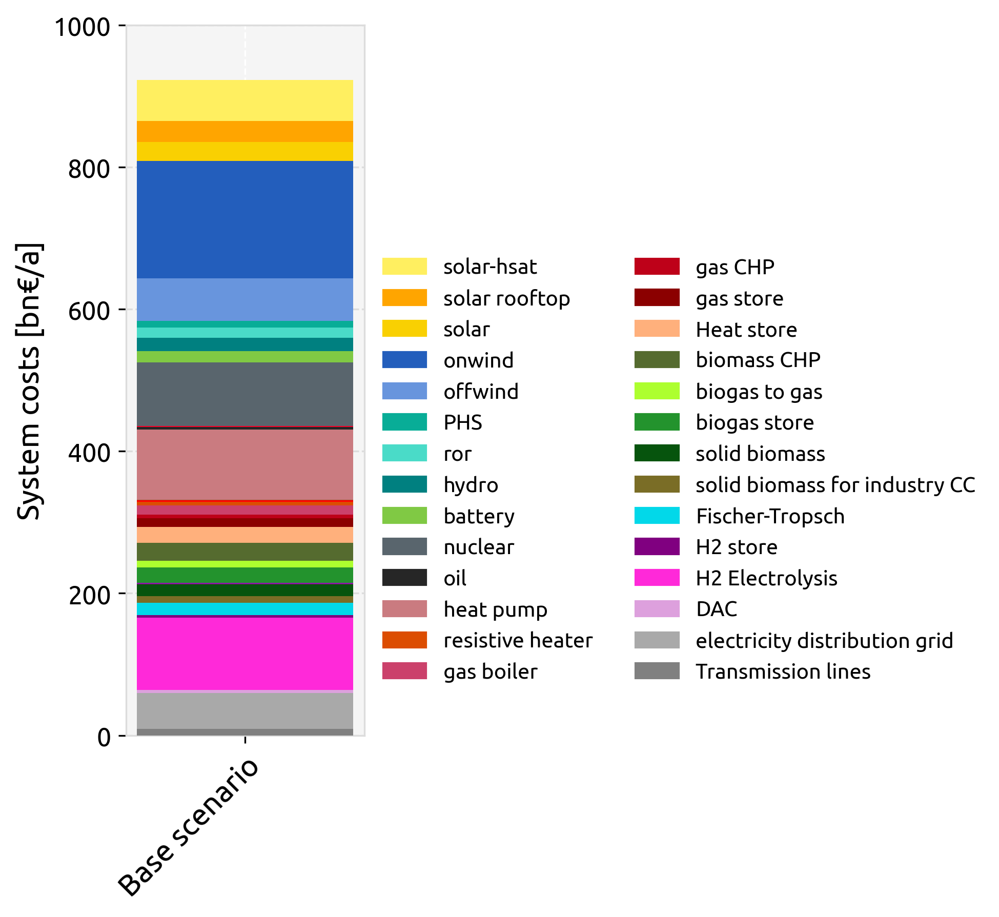

In [28]:
base='main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc'

plt.rc('font',family='Ubuntu')
plt.rc('axes',edgecolor='gainsboro')
plt.rcParams['hatch.linewidth'] = 0.2
#plt.rcParams['figure.dpi'] = 1000
    
fig, axs = plt.subplots(figsize=(2,6), sharey=True,dpi=300)
fig.subplots_adjust(hspace=0.2)
fig.subplots_adjust(wspace=0.5)

bar_width=0.5
index=np.arange(len(main_scen.keys())) #np.arange(len(main_scen[scen][0])) 

hatches=['','...']

preferred_order = pd.Index(
    [
        'Transmission lines','electricity distribution grid',
        'AC', 'BEV charger', 'DAC', 'DC', 'H2 Electrolysis',
       'H2 Fuel Cell', 'H2 store', 'Fischer-Tropsch', 'solid biomass for industry', 
        'solid biomass for industry CC', 'solid biomass',
         'EV battery', 
       'SMR', 'SMR CC', 'Sabatier', 'Solar thermal', 'V2G',
       'agriculture machinery oil',  'biogas store', 'biogas to gas', 
       'biomass CHP', 'biomass boiler', 'co2', 'co2 sequestered', 'co2 stored',
       'Heat store','gas store', 'gas CHP', 'gas boiler', 'resistive heater',
       'gas for industry', 'gas for industry CC', 'gas pipeline',
       'gas pipeline new',  'heat pump', 'home battery', 
       'industry methanol', 'kerosene for aviation', 'methanol',
       'methanolisation', 'naphtha for industry','oil','OCGT',  'nuclear', 'battery','hydro','ror','PHS','offwind', 
       'onwind', 
        'shipping methanol', 'solar',
       'solar rooftop', 'solar-hsat', 
       
    ]
)

costs_base = results_costs[base]
costs_base =costs_base.rename(index={'AC' : 'Transmission lines',}) 
costs_base =costs_base.rename(index={'DC' : 'Transmission lines',}) 
costs_base =costs_base.groupby(costs_base.index).sum()

order = preferred_order.intersection(costs_base.index).append(
       costs_base.index.difference(preferred_order))

costs_base=costs_base.reindex(order)
                           
axs.grid(axis = 'y',color='gainsboro', zorder=0)

for i,base in enumerate(main_scen.keys()):
 if i==0  : 
   for k, append in  enumerate(main_scen[base][0]):
    scenario=base.format(str(append))
    bottom=0
    for color, component in enumerate(costs_base.index):
        if not any(i in component for i in ['naphtha', 'methanol', 'kerosene', 'sequest','process emissions','generators-gas' ]) : 
                axs.bar(index[i], costs_base[component] , bar_width, bottom=bottom,
                           color=tech_colors[component], zorder=3,  )  #hatch=hatches[j], edgecolor='white'
                bottom+=costs_base[component]

    #xlabels = [i for i in main_scen.values()]
            #axs[i].set_xlabel("", rotation=0)
    #axs.set_xticks((index))    
    #axs.set_xticklabels(xlabels,fontsize=16, rotation=45,ha='right', rotation_mode='anchor')
    axs.tick_params(axis='y', labelsize=12)
    axs.set_yticks(np.arange(0, 1001, 200)) 

    
#xlabels = [i for i in main_scen.values()]
            #axs[i].set_xlabel("", rotation=0)
axs.set_xticks([0])    
axs.set_xticklabels(['Base scenario'],fontsize=14, rotation=45,ha='right', rotation_mode='anchor')    
axs.set_ylabel('System costs [bn€/a]', fontsize=14) 




legend_manual=[]
for key in (costs_base.index):
 if not any(i in key for i in ['naphtha', 'methanol', 
                'kerosene', 'sequest','process emissions','generators-gas' ]) and  costs_base[key]>2: 
    legend_manual.append(mpatches.Patch(color=tech_colors[key], label=key))
legend1=plt.legend(handles=legend_manual[::-1],loc='upper left', bbox_to_anchor=(1, .7),ncol=2,
           fontsize=10,frameon=False)
#plt.gca().add_artist(legend1)


In [63]:

for ix in results_caps.index :   
                if 'resistive heater' in ix  :
                   results_caps =results_caps.rename(index={ix : 'resistive heater',})
                if 'heat pump' in ix :
                   results_caps =results_caps.rename(index={ix : 'heat pump',})
                if 'biomass' in ix and 'CHP' in ix :
                    results_caps =results_caps.rename(index={ix:'biomass CHP',})
                if 'biomass' in ix and 'boiler' in ix:
                    results_caps =results_caps.rename(index={ix:'biomass boiler',})
                if 'gas' in ix and 'CHP' in ix :
                    results_caps =results_caps.rename(index={ix:'gas CHP',})
                if 'gas' in ix and 'boiler' in ix :
                    results_caps =results_caps.rename(index={ix:'gas boiler',})
                #if 'biogas' in ix :results_caps =results_caps.rename(index={ix:'Biogas',})
                #if 'oil' in ix and 'agri' not in ix :results_caps =results_caps.rename(index={ix:'Oil to power/heat',}) ##oil boilers, oil demand, etc.
                if 'solar thermal' in ix :results_caps =results_caps.rename(index={ix:'Solar thermal',})
                if 'water tank' in ix and 'discharger' in ix :results_caps =results_caps.rename(index={ix:'Heat storage',})
                if 'water tank' in ix  and 'charger'  not in ix:results_caps =results_caps.rename(index={ix:'Heat store',})
                if 'water tank' in ix :results_caps =results_caps.rename(index={ix:'Heat storage',})
                #if 'biogas' in ix :df.rename(index={ix:'Biomass',})
results_caps =results_caps.rename(index={'gas' : 'gas store',})  
results_caps =results_caps.rename(index={'biogas' : 'biogas store',}) 
results_caps =results_caps.rename(index={'H2' : 'H2 store',}) 
results_caps= results_caps.groupby(results_caps.index).sum()
results_caps =results_caps.rename(index={'H2' : 'H2 store',}) 
results_caps =results_caps.rename(index={'Li ion' : 'EV battery',}) 


In [68]:

for ix in results_costs.index :   
                if 'resistive heater' in ix  :
                   results_costs =results_costs.rename(index={ix : 'resistive heater',})
                if 'heat pump' in ix :
                   results_costs =results_costs.rename(index={ix : 'heat pump',})
                if 'biomass' in ix and 'CHP' in ix :
                    results_costs =results_costs.rename(index={ix:'biomass CHP',})
                if 'biomass' in ix and 'boiler' in ix:
                    results_costs =results_costs.rename(index={ix:'biomass boiler',})
                if 'gas' in ix and 'CHP' in ix :
                    results_costs =results_costs.rename(index={ix:'gas CHP',})
                if 'gas' in ix and 'boiler' in ix :
                    results_costs =results_costs.rename(index={ix:'gas boiler',})
                #if 'biogas' in ix :results_costs =results_costs.rename(index={ix:'Biogas',})
                #if 'oil' in ix and 'agri' not in ix :results_costs =results_costs.rename(index={ix:'Oil to power/heat',}) ##oil boilers, oil demand, etc.
                if 'solar thermal' in ix :results_costs =results_costs.rename(index={ix:'Solar thermal',})
                if 'water tank' in ix :results_costs =results_costs.rename(index={ix:'Heat store',}) ##all costs:charger+discharger+store
                if 'offwind' in ix :results_costs =results_costs.rename(index={ix:'offwind',})
                if 'home battery' in ix :results_costs =results_costs.rename(index={ix:'home battery',})
                if 'battery' in ix and 'home' not in ix :results_costs =results_costs.rename(index={ix:'battery',}) #all costs:charger+discharger+store
                #if 'biogas' in ix :df.rename(index={ix:'Biomass',})
results_costs =results_costs.rename(index={'gas' : 'gas store',})  
results_costs =results_costs.rename(index={'biogas' : 'biogas store',}) 
results_costs =results_costs.rename(index={'H2' : 'H2 store',}) 
results_costs= results_costs.groupby(results_costs.index).sum()
results_costs =results_costs.rename(index={'H2' : 'H2 store',})  ##only store costs, charger and discharger would
     ## be fuel cell and electrolyser, which have their own uses and can't be considered solely as a cost for storing H2
results_costs =results_costs.rename(index={'Li ion' : 'EV battery',}) ##technically has no costs


## Figure 3

In [10]:
def ready_csv(csv) :
 for ix in csv.index :   
                if 'resistive heater' in ix  :
                   csv =csv.rename(index={ix : 'resistive heater',})
                if 'heat pump' in ix :
                   csv =csv.rename(index={ix : 'heat pump',})
                if 'biomass' in ix and 'CHP' in ix :
                    csv =csv.rename(index={ix:'biomass CHP',})
                if 'biomass' in ix and 'boiler' in ix:
                    csv =csv.rename(index={ix:'biomass boiler',})
                if 'gas' in ix and 'CHP' in ix :
                    csv =csv.rename(index={ix:'gas CHP',})
                if 'gas' in ix and 'boiler' in ix :
                    csv =csv.rename(index={ix:'gas boiler',})
                #if 'biogas' in ix :csv =csv.rename(index={ix:'Biogas',})
                #if 'oil' in ix and 'agri' not in ix :csv =csv.rename(index={ix:'Oil to power/heat',}) ##oil boilers, oil demand, etc.
                if 'solar thermal' in ix :csv =csv.rename(index={ix:'Solar thermal',})
               # if 'water tank' in ix and 'discharger' in ix :csv =csv.rename(index={ix:'hot water storage',})
               # if 'water tank' in ix and 'discharger' in ix :csv =csv.rename(index={ix:'hot water storage',})
               # if 'water tank' in ix  and 'charger'  not in ix:csv =csv.rename(index={ix:'Heat store',})
                if 'water tanks charger' in ix :csv =csv.rename(index={ix:'hot water storage',})
                if 'water tanks discharger' in ix :csv =csv.rename(index={ix:'Heat storage',})
                if 'water tanks' in ix :csv =csv.rename(index={ix:'Heat store',})
                #if 'biogas' in ix :df.rename(index={ix:'Biomass',})
 csv =csv.rename(index={'gas' : 'gas store',})  
 csv =csv.rename(index={'biogas' : 'biogas store',}) 
 csv =csv.rename(index={'H2' : 'H2 store',}) 
 csv= csv.groupby(csv.index).sum()
 csv =csv.rename(index={'H2' : 'H2 store',}) 
 csv =csv.rename(index={'Li ion' : 'EV battery',}) 
    
 return csv

5.0 -0.7817257208908135


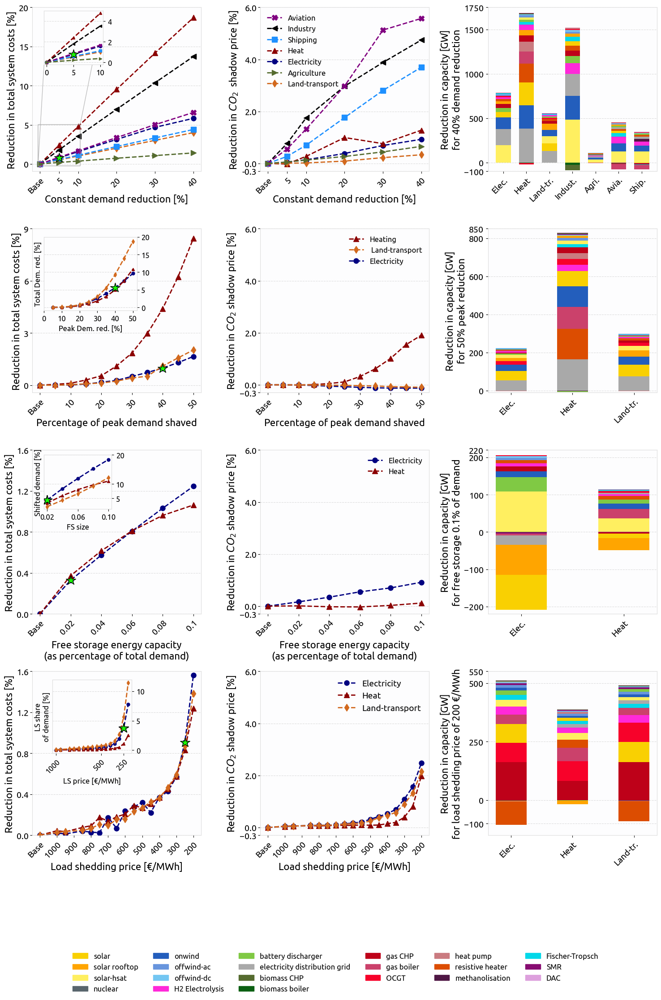

In [18]:
## constant demand reduction 
from matplotlib.gridspec import GridSpec
from matplotlib.ticker import FormatStrFormatter
"""
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'
plt.rc('axes',edgecolor='gainsboro')
plt.rcParams.update({"axes.grid" : True, "grid.color" :"gainsboro" , "grid.linestyle":"dotted"})
"""
plt.rc('axes',edgecolor='gainsboro') #dimgray
plt.rcParams['axes.facecolor'] =  '#fdfdfe' #'#fdfdfe'#'whitesmoke'
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams.update({"axes.grid" : True, "grid.color" :"gainsboro" , "grid.linestyle":"dotted"})

fig, axs = plt.subplots(4,3 ,figsize=(18,24), ) #sharey=True) ## run for first time
fig.subplots_adjust(wspace=0.35)
fig.subplots_adjust(hspace=0.35)

for ax in axs.reshape(-1):
    ax.grid(axis = 'y' , color='darkgray', zorder=0, linestyle='dashed',) 
    ax.grid(axis = 'x' , color='white', linestyle='dotted', zorder=0) 


"""
fig = plt.figure(figsize=(15, 20))
gs0 = GridSpec(1,2,width_ratios=[2,1], figure=fig)  

gs1 = gs0[0].subgridspec(1, 2, wspace=0.15)   
axs[0,0] = fig.add_subplot(gs1[0])  # create ax1
axs[0,1] = fig.add_subplot(gs1[1])  # create ax2

gs2 = gs0[1].subgridspec(1, 1, wspace=0.15)       
axs[0,2] = fig.add_subplot(gs2[0])  
"""
index= [i for i in range(9)]
#markers = ['o','v','d','<','X','s','>','p']
markers = {'Electricity':'o',
           'Heat': '^',
           'Land-transport': 'd',
           'elec':'o',
           'heat': '^',
           'tran': 'd',
           'Industry':'<',
           'Aviation':'X',
           'Shipping':'s',
           'Agriculture':'>',
           #'p'
          }

techs_to_plot= ['solar', 'solar rooftop' ,'solar-hsat','nuclear','onwind', 'offwind-ac' ,'offwind-dc', 
      'H2 Electrolysis', 'battery discharger', 'electricity distribution grid',#'V2G', 'BEV charger',: they have constant cap., but energy changes
            'biomass CHP', 'biomass boiler','gas CHP' , 'gas boiler', 'OCGT', #'Heat storage', #:too large? (water tank discharger)
        'heat pump','resistive heater',# 'Solar thermal','biomass boiler': too large
         #'gas store', 'H2 store','EV battery', :energy cap.
        'methanolisation', 'Fischer-Tropsch' ,'SMR', 'DAC']



main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIelecI{}_2050.nc':[['p05','p10','p20','p30','p40',],'Electricity demand reduction' ] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIheatI{}_2050.nc':[['p05','p10-lowtol','p20-lowtol','p30-lowtol','p40-lowtol',],'Heat demand reduction'] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIinduI{}_2050.nc':[['p05','p10','p20','p30','p40',],'Industry demand reduction']  ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmItranI{}_2050.nc':[['p05','p10','p20','p30-lowtol','p40',],'Land-transport demand reduction']  ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIshipI{}_2050.nc':[['p05','p10','p20','p30','p40',],'Shipping demand reduction']  ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIaviaI{}_2050.nc':[['p05','p10','p20','p30-lowtol','p40',],'Aviation demand reduction']  ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIagriI{}_2050.nc':[['p05','p10-lowtol','p20','p30','p40'],'Agriculture demand reduction']  ,  ## p90 available
}


results_total=pd.read_csv('csvs_read/results_total_dem.csv', index_col=0)
costs=pd.read_csv('csvs_read/costs_dem.csv', index_col=0)
results_caps=pd.read_csv('csvs_read/results_caps_dem.csv', index_col=0)
results_caps= ready_csv(results_caps)

axins = axs[0,0].inset_axes([0.07, 0.65, 0.35, 0.33],)

for i, scenario in enumerate(main_scen.keys()) : 
    if main_scen[scenario][1]=='Base' :
        base_scen = scenario
    else :  
        index= [0]+[float(i.split('p')[1][:2]) for i in main_scen[scenario][0]] ##TODO: fix the scenario

        #to_plot= (100*(costs[[base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]].sum()/
         #             costs[base_scen].sum()-1))
        to_plot= (100*((results_total.loc['Total-cost', [base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]]/
                     results_total.loc['Total-cost',base_scen ])-1)) 
        label = main_scen[scenario][1].split(' ')[0]
        axs[0,0].plot(index,  to_plot*-1,
                #color= 'k', #tech_colors['solar'],
                linestyle='--',
                linewidth = 2,
                marker=markers[label],
                markersize=8,
                zorder=3,
                label= label, #+ ' demand reduction',
                color= sector_colors[label]) 
        axins.plot(index[:3],  to_plot[:3]*-1,
                linestyle='--',
                linewidth = 2,
                marker=markers[label],
                markersize=5,
                zorder=3,
                label= label, #+ ' demand reduction',
                color= sector_colors[label]
                 )  
        if label=='Electricity':
                print(index[1], to_plot[1])
                axins.plot(index[1],  to_plot[1]*-1,
                marker='*',
                markersize=16,
                zorder=4,
                markerfacecolor= '#1bfc06',#'#00ffff',
                markeredgecolor= 'black',
                 ) 
                
                axs[0,0].plot(index[1],  to_plot[1]*-1,
                marker='*',
                markersize=16,
                zorder=4,
                color='white',
                markerfacecolor= '#1bfc06',#'#00ffff',
                markeredgecolor= 'black',
                label= '5% demand case'

                 )  

axins.grid(axis = 'y' , color='gainsboro', zorder=0, linestyle='dashed',) 
axins.grid(axis = 'x' , color='white', linestyle='dotted', zorder=0) 
axins.yaxis.tick_right()
axins.set_xticks([0,5,10])
axins.tick_params(axis='x', labelsize=12,)
axins.tick_params(axis='y', labelsize=12,)
#axins.set_xlim((0,10))
axs[0,0].indicate_inset_zoom(axins, edgecolor="gainsboro",zorder=3)
inset_indicator0 = axs[0,0].indicate_inset_zoom(axins)
inset_indicator0.connectors[0].set_visible(True)
inset_indicator0.connectors[3].set_visible(True)

xlabels = ['Base']+ [int(float(i.split('p')[1][:2])) for i in main_scen[scenario][0]]
axs[0,0].set_xticks((index))    
axs[0,0].set_xticklabels(xlabels,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')
axs[0,0].set_ylabel('Reduction in total system costs [%]', fontsize=16)    
axs[0,0].set_xlabel('Constant demand reduction [%]', fontsize=16, labelpad=-1)
axs[0,0].grid(axis = 'y' , color='gainsboro', zorder=0)
axs[0,0].tick_params(axis='y', labelsize=14, pad=2,)
axs[0,0].set_yticks(np.arange(0,20.1,5))    



for i, scenario in enumerate(main_scen.keys()) : 
    if main_scen[scenario][1]=='Base' :
        base_scen = scenario
    else :   
        index= [0]+[float(i.split('p')[1][:2]) for i in main_scen[scenario][0]]
        #to_plot= (100*(costs[[base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]].sum()/
         #             costs[base_scen].sum()-1))
        to_plot= (100*((abs(results_total.loc['CO2-price', 
                            [base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]])/
                     abs(results_total.loc['CO2-price',base_scen]))-1))   
        label = main_scen[scenario][1].split(' ')[0]
        axs[0,1].plot(index,  to_plot*-1,
                #color= 'k', #tech_colors['solar'],
                linestyle='--',
                linewidth = 2,
                marker=markers[label],
                markersize=8,
                zorder=3,
                label= label,#+ ' demand reduction',
                color= sector_colors[label])  


xlabels = ['Base']+ [int(float(i.split('p')[1][:2])) for i in main_scen[scenario][0]]
axs[0,1].set_xticks((index))    
axs[0,1].set_xticklabels(xlabels,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')
axs[0,1].set_ylabel('Reduction in $CO_{2}$  shadow price [%]',fontsize=16)    
axs[0,1].set_xlabel('Constant demand reduction [%]', fontsize=16 ,labelpad=-1)  
axs[0,1].grid(axis = 'y' , color='gainsboro', zorder=0)
axs[0,1].tick_params(axis='y', labelsize=14, pad=2,)
axs[0,1].set_yticks(np.arange(0,6.1,3))    
axs[0,1].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

handles, labels = axs[0,1].get_legend_handles_labels()
order = [5,2,4,1,0,6,3] #[2,3,6,1,5,4,0]
axs[0,1].legend([handles[idx] for idx in order],[labels[idx] for idx in order],
           loc='best',
           #bbox_to_anchor=(1.6, 0.5),ncol=1 , 
           fontsize=12, frameon=False)

## third figure
index= [i for i in range(9)]

#for conswcutive: costs[[i.format(main_scen[i][0][1]) for i in main_scen.keys()]].sum(),

sector_names = ['I'+j for j in carrier_names.keys()]

bar_width=.65
index=np.arange(len(sector_names))
for i, sector in enumerate(sector_names) :
      to_select= [i for i in main_scen.keys() if sector in i]
      last_scen=to_select[0].format(main_scen[to_select[0]][0][-1])
     # temp= (results_caps[last_scen]/results_caps[base_scen])-1  ## relative capacity
      temp= (results_caps[last_scen]-results_caps[base_scen])
        
      #temp =temp.loc[:, temp.columns[:7]] ##show only until 0.1% of demand 
      to_plot= temp[techs_to_plot].sort_values(ascending= True) #.mean() ? .diff(axis=1).sum(axis=1)
      bottom_p=0
      bottom_n=0
      for component in (to_plot.index): #(to_plot[abs(to_plot)<0.5]).index :
        if   to_plot[component]<0 :
          axs[0,2].bar(index[i], (to_plot[component])*-.001,
                  bar_width, bottom=bottom_n , 
                  color=tech_colors[component], label=component, zorder=3)
          bottom_n += (to_plot[component])*-.001
        else: 
          axs[0,2].bar(index[i], (to_plot[component])*-.001,
                  bar_width, bottom=bottom_p  ,
                  color=tech_colors[component], label=component, zorder=3)
          bottom_p += (to_plot[component])*-.001
            
    
labels = ['Elec.', 'Heat', 'Land-tr.','Indust.', 'Agri.','Avia.', 'Ship.']
xlabels = [i for i in labels] # carrier_names.keys()]
axs[0,2].set_xticks((index))    
axs[0,2].set_xticklabels(xlabels,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')
axs[0,2].set_ylabel('Reduction in capacity [GW]\nfor 40% demand reduction', fontsize=16)   
#axs[0,2].set_xlabel('Sector')    
axs[0,2].grid(axis = 'y' , color='gainsboro', zorder=0)
axs[0,2].tick_params(axis='y', labelsize=14)
   


## peak shaving


main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemIelecI{}_2050.nc':[['p05','p10','p15','p20','p25-lowtol','p30','p35-lowtol','p40', 'p45', 'p50'],'Electricity demand reduction' ] , #'p25','p30',
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemIheatI{}_2050.nc':[['p05','p10','p15','p20','p25','p30','p35','p40', 'p45', 'p50'],'Heat demand reduction'] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemItranI{}_2050.nc':[['p05','p10','p15','p20-lowtol','p25','p30','p35','p40', 'p45', 'p50'],'Land-transport demand reduction']  ,
}


results_total=pd.read_csv('csvs_read/results_total_pdem.csv', index_col=0)
costs=pd.read_csv('csvs_read/costs_pdem.csv', index_col=0)
results_caps=pd.read_csv('csvs_read/results_caps_pdem.csv', index_col=0)
results_caps= ready_csv(results_caps)

index= [i for i in range(9)]

#for conswcutive: costs[[i.format(main_scen[i][0][1]) for i in main_scen.keys()]].sum(),
axins = axs[1,0].inset_axes([0.07, 0.5, 0.55, 0.45])
axins.grid(axis = 'y' , color='gainsboro', zorder=0, linestyle='dashed',) 
axins.grid(axis = 'x' , color='white', linestyle='dotted', zorder=0) 
#for conswcutive: costs[[i.format(main_scen[i][0][1]) for i in main_scen.keys()]].sum(),

for i, scenario in enumerate(main_scen.keys()) : 
    if main_scen[scenario][1]=='Base' :
        base_scen = scenario
    else :     
        #to_plot= (100*(costs[[base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]].sum()/
         #             costs[base_scen].sum()-1))
        index1= [0]+[float(i.split('p')[1][:2]) for i in main_scen[scenario][0]]
    
        to_plot= (100*((results_total.loc['Total-cost', [base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]]/
                     results_total.loc['Total-cost',base_scen ])-1))   
        label = main_scen[scenario][1].split(' ')[0]
        axs[1,0].plot(index1,  to_plot*-1,
                #color= 'k', #tech_colors['solar'],
                linestyle='--',
                linewidth = 2,
                marker=markers[label],
                markersize=8,
                zorder=3,
                label= label+ ' demand reduction',
                color= sector_colors[label]) 
        if label=='Electricity':
                axs[1,0].plot(index1[8],  to_plot[8]*-1,
                marker='*',
                markersize=16,
                zorder=4,
                markerfacecolor= '#1bfc06',
                markeredgecolor= 'black',
                 ) 
        
peak_change_factors = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]
df_peak2dem_ratios =pd.read_csv('csvs_read/df_peak2dem_ratios.csv', index_col=0)

for j, sector in enumerate(['elec', 'heat', 'tran']) :       
        axins.plot( [k*100 for k in peak_change_factors], df_peak2dem_ratios.loc[sector, :], 
               linestyle='--',
                linewidth = 2,
                marker=markers[sector],
                markersize=5,
                zorder=3,
                color= sector_colors_[sector]
                 ) 
        if sector=='elec':
                axins.plot(40,  df_peak2dem_ratios.loc[sector, '0.4'],
                marker='*',
                markersize=16,
                zorder=4,
                markerfacecolor= '#1bfc06',
                markeredgecolor= 'black',
                 ) 
                
axins.yaxis.tick_right()
axins.set_xticks(np.arange(0,50.1,10),)
axins.set_yticks(np.arange(0,20.1,5),)   
axins.tick_params(axis='y', labelsize=12)
axins.tick_params(axis='x', labelsize=12)
axins.set_ylabel('Total Dem. red. [%]',fontsize=12)   
axins.set_xlabel('Peak Dem. red. [%]',fontsize=12)
#axins.patch.set_edgecolor('black') 

xlabels1 = ['Base']+ [10,20,30,40,50]#[float(i.split('p')[1][:2]) for i in main_scen[scenario][0]]

axs[1,0].set_xticks((index1[::2]))    
axs[1,0].set_xticklabels(xlabels1,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')
axs[1,0].set_ylabel('Reduction in total system costs [%]', fontsize=16)    
axs[1,0].grid(axis = 'y' , color='gainsboro', zorder=0)
axs[1,0].tick_params(axis='y', labelsize=14, pad=2,)
axs[1,0].set_yticks(np.arange(0,9.1,3)) 
#ax.spines[['right', 'top']].set_visible(False)
axs[1,0].set_xlabel('Percentage of peak demand shaved', fontsize=16,labelpad=3)        




for i, scenario in enumerate(main_scen.keys()) : 
    if main_scen[scenario][1]=='Base' :
        base_scen = scenario
    else :     
        #to_plot= (100*(costs[[base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]].sum()/
         #             costs[base_scen].sum()-1))
        index1= [0]+[float(i.split('p')[1][:2]) for i in main_scen[scenario][0]]
    
        to_plot= (100*((results_total.loc['CO2-price', [base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]]/
                     results_total.loc['CO2-price',base_scen ])-1))   
        label = main_scen[scenario][1].split(' ')[0]
        axs[1,1].plot(index1,  to_plot*-1,
                #color= 'k', #tech_colors['solar'],
                linestyle='--',
                linewidth = 2,
                marker=markers[label],
                markersize=8,
                zorder=3,
                label= label+ ' demand reduction',
                color= sector_colors[label])  

xlabels1 = ['Base']+[10,20,30,40,50] # [float(i.split('p')[1][:2]) for i in main_scen[scenario][0]]

axs[1,1].set_xticks(index1[::2])    
axs[1,1].set_xticklabels(xlabels1,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')
axs[1,1].set_ylabel('Reduction in $CO_{2}$ shadow price [%]', fontsize=16)    
axs[1,1].grid(axis = 'y' , color='gainsboro', zorder=0)
axs[1,1].tick_params(axis='y', labelsize=14, pad=2,)
axs[1,1].set_yticks([0,0.5,1,1.5,2])#(np.arange(0,2.1,.4)) 
axs[1,1].set_xlabel('Percentage of peak demand shaved', fontsize=16,labelpad=3)      

handles, labels = axs[1,1].get_legend_handles_labels()
order = [1,2,0]
axs[1,1].legend([handles[idx] for idx in order],['Heating', ' Land-transport','Electricity'],
           loc='best',
           #bbox_to_anchor=(0.4, 1.5),ncol=1 , 
           fontsize=12, frameon=False)

## third figure
index= [i for i in range(9)]
sector_names = ['I'+j for j in ['elec','heat','tran']]
bar_width=.5
index=np.arange(len(sector_names))
for i, sector in enumerate(sector_names) :
      to_select= [i for i in main_scen.keys() if sector in i]
      last_scen=to_select[0].format(main_scen[to_select[0]][0][-1])
     ## temp= (results_caps[last_scen]/results_caps[base_scen])-1  #relative
      temp= (results_caps[last_scen]-results_caps[base_scen])
        
      #temp =temp.loc[:, temp.columns[:7]] ##show only until 0.1% of demand 
      to_plot= temp[techs_to_plot].sort_values(ascending= True) #.mean() ? .diff(axis=1).sum(axis=1)
      bottom_p=0
      bottom_n=0
      for component in (to_plot.index): #(to_plot[abs(to_plot)<0.5]).index :
        if   to_plot[component]<0 :
          axs[1,2].bar(index[i], (to_plot[component])*-.001,
                  bar_width, bottom=bottom_n , 
                  color=tech_colors[component], label=component, zorder=3)
          bottom_n += (to_plot[component])*-.001
        else: 
          axs[1,2].bar(index[i], (to_plot[component])*-.001,
                  bar_width, bottom=bottom_p  ,
                  color=tech_colors[component], label=component, zorder=3)
          bottom_p += (to_plot[component])*-.001
    
labels = ['Elec.', 'Heat', 'Land-tr.',]#'Industry', 'Agriculture',]
xlabels = [i for i in labels] # carrier_names.keys()]
axs[1,2].set_xticks((index))    
axs[1,2].set_xticklabels(xlabels,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')
axs[1,2].set_ylabel('Reduction in capacity [GW]\nfor 50% peak reduction', fontsize=16)   
#axs[1,2].set_xlabel('Sector')    
axs[1,2].grid(axis = 'y' , color='gainsboro', zorder=0)
axs[1,2].tick_params(axis='y', labelsize=14)
#axs[1,2].set_yticks([-15, 0, 100, 200, 300, 320])    
#axs[1,2].set_ylim((-10, 320))


## Free storage

main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-nov2g_2050.nc':[[''],'Land-transport Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemIelecI{}_2050.nc':[['p0.02-lowv','p0.04-lowv','p0.06-lowv','p0.08-lowv','p0.1-lowv',],'Electricity demand reduction' ] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemIheatI{}_2050.nc':[['p0.02','p0.04','p0.06','p0.08','p0.1',],'Heat demand reduction'] ,
     'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemItranI{}_2050.nc':[['p0.02','p0.04','p0.06','p0.08','p0.1',],'Land-transport demand reduction']  ,
}

results_total=pd.read_csv('csvs_read/results_total_sdem_new.csv', index_col=0)
costs=pd.read_csv('csvs_read/costs_sdem_new.csv', index_col=0)
results_caps=pd.read_csv('csvs_read/results_caps_sdem_new.csv', index_col=0)
results_caps= ready_csv(results_caps)
df_share_shift= pd.read_csv('csvs_read/df_share_shift.csv', index_col=0)


for i, scenario in enumerate(main_scen.keys()) : 
    if main_scen[scenario][1]=='Base' :
        base_scen = scenario
    elif  main_scen[scenario][1]=='Land-transport Base':
        base_scen_tran = scenario
    else :  
        index= [0]+[float((i.split('p')[1]).split('-')[0]) for i in main_scen[scenario][0]]  ##TODO: fix the scenario

        #to_plot= (100*(costs[[base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]].sum()/
         #             costs[base_scen].sum()-1))
        if 'tran' not in scenario:
             to_plot= (100*((results_total.loc['Total-cost', [base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]]/
                     results_total.loc['Total-cost',base_scen ])-1))   
             to_plot_c= (100*((results_total.loc['CO2-price', [base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]]/
                     results_total.loc['CO2-price',base_scen ])-1))      
        else:   ##for land-transport, no v2g for base netweok and others
             to_plot= (100*((results_total.loc['Total-cost', [base_scen_tran]+[scenario.format(i) for i in main_scen[scenario][0]]]/
                     results_total.loc['Total-cost',base_scen_tran ])-1))  
             to_plot_c= (100*((results_total.loc['CO2-price', [base_scen_tran]+[scenario.format(i) for i in main_scen[scenario][0]]]/
                     results_total.loc['CO2-price',base_scen_tran ])-1))
            
        to_plot= to_plot.drop(labels=[i for i in to_plot.index if 'p0.01' in i])  ##TODO: run elec-p0.01 with lowrol       
        to_plot_c= to_plot_c.drop(labels=[i for i in to_plot_c.index if 'p0.01' in i])  ##TODO: run elec-p0.01 with lowrol       
        if 'tran' not in scenario:
        
         label = main_scen[scenario][1].split(' ')[0]
         axs[2,0].plot(index,  to_plot*-1,
                #color= 'k', #tech_colors['solar'],
                linestyle='--',
                linewidth = 2,
                marker=markers[label],
                markersize=8,
                zorder=3,
                label= label, #+ ' demand reduction',
                color= sector_colors[label])  

        
         if label=='Electricity':
                axs[2,0].plot(index[1],  to_plot[1]*-1,
                marker='*',
                markersize=16,
                zorder=4,
                markerfacecolor= '#1bfc06',#'#fffd01',
                markeredgecolor= 'black',
                 ) 
                
         axs[2,1].plot(index,  to_plot_c*-1,   #[:7]
                #color= 'k', #tech_colors['solar'],
                linestyle='--',
                linewidth = 2,
                marker=markers[label],
                markersize=8,
                zorder=3,
                label= label, #+ ' demand reduction',
                color= sector_colors[label])  
        
axins = axs[2,0].inset_axes([0.07, 0.64, 0.4, 0.33])
for k, scenario in enumerate(main_scen.keys()) :
    if 'Base' not in  main_scen[scenario][1]:
        index = [float((i.split('p')[1]).split('-')[0]) for i in main_scen[scenario][0]]  
        sector = scenario.split('I')[2]                                                            ##[1:7]
        axins.plot(index,  df_share_shift.loc[df_share_shift.index.str.contains(sector)].squeeze()[1:].values*100,
                #color= 'k', #tech_colors['solar'],
                linestyle='--',
                linewidth = 2,
                marker=markers[sector],
                markersize=5,
                zorder=3,
                label= label, #+ ' demand reduction', elec-p0.02
                color= sector_colors_[sector])
        axins.plot(index[0],  df_share_shift.loc['elec-p0.02'].sum()*100,
                marker='*',
                markersize=16,
                zorder=4,
                markerfacecolor= '#1bfc06',#'#fffd01',
                markeredgecolor= 'black',
                 )  
        
axins.yaxis.tick_right()
axins.set_xticks([0.02,0.06,0.1],)
axins.set_yticks([5,10,20], ) 
axins.tick_params(axis='x', labelsize=12)
axins.tick_params(axis='y', labelsize=12)
axins.set_ylabel('Shifted demand [%]', fontsize=12)
axins.set_xlabel('FS size', fontsize=12)
#axins.patch.set_edgecolor('black') 
axins.grid(axis = 'y' , color='gainsboro', zorder=0, linestyle='dashed',) 
axins.grid(axis = 'x' , color='white', linestyle='dotted', zorder=0) 

xlabels = ['Base']+ [ '0.02', '0.04', '0.06', '0.08', '0.1']#[str((round(i,1))) for i  in np.arange(0,.11,0.02)] #[float(i.split('p')[1]) for i in main_scen[scenario][0]]
for ax in [axs[2,0], axs[2,1]]: 
  ax.set_xticks([0,  0.02, 0.04, 0.06, 0.08, 0.1]) #(index))    np.arange(0,.11,0.02)) # 
  ax.set_xticklabels(xlabels,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')

axs[2,0].set_ylabel('Reduction in total system costs [%]', fontsize=16)    
axs[2,0].set_xlabel('Free storage energy capacity\n(as percentage of total demand)', fontsize=16)    #\n(as percentage of total demand)
axs[2,0].grid(axis = 'y' , color='gainsboro', zorder=0)
axs[2,0].tick_params(axis='y', labelsize=14, pad=2,)
axs[2,0].tick_params(axis='x', labelsize=14)
axs[2,0].set_yticks([0,0.5,1, 1.3])#(np.arange(0,1.61,.4))    
axs[2,0].set_ylim([-0.1,1.3])

axs[2,1].set_ylabel('Reduction in $CO_{2}$ shadow price [%]', fontsize=16)    
axs[2,1].grid(axis = 'y' , color='gainsboro', zorder=0)
axs[2,1].tick_params(axis='y', labelsize=14, pad=2,)
axs[2,1].set_yticks([0,0.5,1]) #(np.arange(0,1.01,.25)) 
axs[2,1].set_xlabel('Free storage energy capacity\n(as percentage of total demand)', fontsize=16)    #\n(as percentage of total demand)
axs[2,1].set_ylim([-0.1,1])
    
handles, labels = axs[2,1].get_legend_handles_labels()
order = [0,1]#[0,1,2] #[2,3,6,1,5,4,0]
axs[2,1].legend([handles[idx] for idx in order],[labels[idx] for idx in order],
           loc='best',
           #bbox_to_anchor=(1.6, 0.5),ncol=1 , 
           fontsize=12, frameon=False)


bar_width=.5
index=np.arange(len(sector_names)-1)
for i, sector in enumerate(sector_names) :
   if 'tran' not in sector:  
      to_select= [i for i in main_scen.keys() if sector in i]
      last_scen=to_select[0].format(main_scen[to_select[0]][0][-1])
      if 'tran' not in sector: 
        temp= (results_caps[last_scen]-results_caps[base_scen])
      else: 
        temp= (results_caps[last_scen]-results_caps[base_scen_tran])
        
      #temp =temp.loc[:, temp.columns[:7]] ##show only until 0.1% of demand 
      to_plot= temp[techs_to_plot].sort_values(ascending= True) #.mean() ? .diff(axis=1).sum(axis=1)
      bottom_p=0
      bottom_n=0
      for component in (to_plot.index): #(to_plot[abs(to_plot)<0.5]).index :
        if   to_plot[component]<0 :
          axs[2,2].bar(index[i], (to_plot[component])*-.001,
                  bar_width, bottom=bottom_n , 
                  color=tech_colors[component], label=component, zorder=3)
          bottom_n += (to_plot[component])*-.001
        else: 
          axs[2,2].bar(index[i], (to_plot[component])*-.001,
                  bar_width, bottom=bottom_p  ,
                  color=tech_colors[component], label=component, zorder=3)
          bottom_p += (to_plot[component])*-.001
    
labels = ['Elec.', 'Heat',] #'Land-tr.',]
xlabels = [i for i in labels] # carrier_names.keys()]
axs[2,2].set_xticks((index))    
axs[2,2].set_xticklabels(xlabels,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')
axs[2,2].set_ylabel('Reduction in capacity [GW]\nfor free storage 0.1% of demand', fontsize=16)   
axs[2,2].grid(axis = 'y' , color='gainsboro', zorder=0)
axs[2,2].tick_params(axis='y', labelsize=14)
#axs[2,2].set_yticks([-40, 0, 25, 50, 75])    
#axs[2,2].set_ylim((-40, 75))


## load shedding

main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   , #'p100000','p10000','p1000',p5000','p2500',
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemIelecI{}_2050.nc':[['p1000','p950-lowtol', 'p850-lowtol','p800', 'p750-lowtol','p700-lowtol','p650-lowtol','p600-lowtol','p550-lowtol', 'p549-lowtol','p500-lowtol','p450-lowtol','p400','p350-lowtol','p300', 'p250','p200-lowtol'],'Electricity demand reduction' ] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemIheatI{}_2050.nc':[['p1000','p950','p850','p800','p750-lowtol','p700','p650','p600','p550-lowtol','p500','p450','p400','p350','p300','p250-lowtol','p200'],'Heat demand reduction'] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemItranI{}_2050.nc':[['p1000','p950','p850','p800','p750','p700','p650','p600','p550','p500','p450','p400','p350','p300','p250','p200'],'Land-transport demand reduction']  ,
}


results_total=pd.read_csv('csvs_read/results_total_ldem_new.csv', index_col=0)
costs=pd.read_csv('csvs_read/costs_ldem_new.csv', index_col=0)
results_caps=pd.read_csv('csvs_read/results_caps_ldem_new.csv', index_col=0)
results_caps= ready_csv(results_caps)
df_ls_to_demand=pd.read_csv('csvs_read/df_ls_to_demand_new.csv', index_col=0)

axins = axs[3,0].inset_axes([0.12, 0.5, 0.47, 0.45])
axins.grid(axis = 'y' , color='gainsboro', zorder=0, linestyle='dashed',) 
axins.grid(axis = 'x' , color='white', linestyle='dotted', zorder=0) 

for i, scenario in enumerate(main_scen.keys()) : 
    if main_scen[scenario][1]=='Base' :
        base_scen = scenario

    else :  
      index= [float((i.split('p')[1]).split('-')[0]) for i in main_scen[scenario][0]] ##TODO: fix the scenario  #[0]+
       #index=[0,2500,4000,4200,4400,4500,4600,4700]  #arbitrary
        #to_plot= (100*(costs[[base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]].sum()/
         #             costs[base_scen].sum()-1))
      to_plot= (100*((results_total.loc['Total-cost', [scenario.format(i) for i in main_scen[scenario][0]]]/ #[base_scen]+
                     results_total.loc['Total-cost',base_scen ])-1))   
      to_plot_c= (100*((results_total.loc['CO2-price', [scenario.format(i) for i in main_scen[scenario][0]]]/ #[base_scen]+
                     results_total.loc['CO2-price',base_scen ])-1))     
      label = main_scen[scenario][1].split(' ')[0]
      to_plot[to_plot>0] = np.nan
  
      axs[3,0].plot([-1100]+[i*-1 for i in index],  [0]+ [i*-1 for i in to_plot] , ##arbitrary index for Base
                #color= 'k', #tech_colors['solar'],
                linestyle='--',
                linewidth = 2,
                marker=markers[label],
                markersize=8,
                zorder=3,
                label= label, #+ ' demand reduction',
                color= sector_colors[label])  
      axs[3,1].plot([-1100]+[i*-1 for i in index],  [0]+ [i*-1 for i in to_plot_c] , ##arbitrary index for Base
                #color= 'k', #tech_colors['solar'],
                linestyle='--',
                linewidth = 2,
                marker=markers[label],
                markersize=8,
                zorder=3,
                label= label, #+ ' demand reduction',
                color= sector_colors[label])  
      if label=='Electricity':
        axs[3,0].plot(index[-2]*-1,  to_plot[-2]*-1,
                marker='*',
                markersize=16,
                zorder=4,
                color='white',
                markerfacecolor= '#1bfc06', #'#cfff04',
                markeredgecolor= 'black',
                label= '5% demand case'

                 )  
      sector= scenario.split('I')[2]
      axins.plot ([i*-1 for i in index], df_ls_to_demand.loc[sector, ['p'+str(int(i)) for i in index]]*100, 
               linestyle='--',
                linewidth = 2,
                marker=markers[label],
                markersize=5,
                zorder=3,
                label= sector,
                color= sector_colors_[sector])
      axins.plot(-250, df_ls_to_demand.loc['elec', 'p250']*100, 
                marker='*',
                markersize=16,
                zorder=4,
                color='white',
                markerfacecolor= '#1bfc06',#'#cfff04',
                markeredgecolor= 'black',)
 

axins.yaxis.tick_right()
xlabels = [1000,500,250]
axins.set_xticks([i*-1 for i in xlabels])    
axins.set_xticklabels(xlabels,fontsize=12, rotation=45,ha='right', rotation_mode='anchor')
axins.set_yticks([0,5,10])  
axins.tick_params(axis='y', labelsize=12)
axins.tick_params(axis='x', labelsize=12)
axins.set_ylabel('LS share\nof demand [%]', fontsize=12)
axins.set_xlabel('LS price [€/MWh]', fontsize=12) 

xlabels = [i*-1 for i in np.arange(-1000, -200, 100)]+[200] #[float(i.split('p')[1]) for i in main_scen[scenario][0]] #['Base']+ 
for ax in [axs[3,0], axs[3,1]]:
    ax.set_xticks([-1100]+[i*-1 for i in xlabels])    
    ax.set_xticklabels(['Base']+ xlabels,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')

axs[3,0].set_ylabel('Reduction in total system costs [%]', fontsize=16)    
axs[3,0].set_xlabel('Load shedding price [€/MWh]', fontsize=16)      
axs[3,0].grid(axis = 'y' , color='gainsboro', zorder=0)
axs[3,0].tick_params(axis='y', labelsize=14, pad=2,)
axs[3,0].set_yticks(np.arange(0,1.61,.4))    
#axs[3,0].set_xscale('symlog', base=2)

axs[3,1].set_ylabel('Reduction in $CO_{2}$ shadow price [%]', fontsize=16)    
axs[3,1].grid(axis = 'y' , color='gainsboro', zorder=0)
axs[3,1].tick_params(axis='y', labelsize=14, pad=2,)
axs[3,1].set_yticks(np.arange(0,2.51,0.5)) 
axs[3,1].set_xlabel('Load shedding price [€/MWh]', fontsize=16)  

handles, labels = axs[3,1].get_legend_handles_labels()
order = [0,1,2]
axs[3,1].legend([handles[idx] for idx in order],[labels[idx] for idx in order],
           loc='best',
           #bbox_to_anchor=(1.6, 0.5),ncol=1 , 
           fontsize=14, frameon=False)


bar_width=.5
index=np.arange(len(sector_names))
for i, sector in enumerate(sector_names) :
      to_select= [i for i in main_scen.keys() if sector in i]
      last_scen=to_select[0].format(main_scen[to_select[0]][0][-1])
      temp= (results_caps[last_scen]-results_caps[base_scen]) #-1
        
      #temp =temp.loc[:, temp.columns[:7]] ##show only until 0.1% of demand 
      to_plot= temp[techs_to_plot].sort_values(ascending= True) #.mean() ? .diff(axis=1).sum(axis=1)
      bottom_p=0
      bottom_n=0
      for component in (to_plot.index): #(to_plot[abs(to_plot)<0.5]).index :
        if   to_plot[component]<0 :
          axs[3,2].bar(index[i], (to_plot[component])*-.001,
                  bar_width, bottom=bottom_n , 
                  color=tech_colors[component], label=component, zorder=3)
          bottom_n += (to_plot[component])*-.001
        else: 
          axs[3,2].bar(index[i], (to_plot[component])*-.001,
                  bar_width, bottom=bottom_p  ,
                  color=tech_colors[component], label=component, zorder=3)
          bottom_p += (to_plot[component])*-.001
    
labels = ['Elec.', 'Heat', 'Land-tr.',]#'Industry', 'Agriculture',]
xlabels = [i for i in labels] # carrier_names.keys()]
axs[3,2].set_xticks((index))    
axs[3,2].set_xticklabels(xlabels,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')
axs[3,2].set_ylabel('Reduction in capacity [GW]\nfor load shedding price of 200 €/MWh', fontsize=16)   
axs[3,2].grid(axis = 'y' , color='gainsboro', zorder=0)
axs[3,2].tick_params(axis='y', labelsize=14)
#axs[3,2].set_yticks([-50, 0, 50, 100, 150, 200, 250, 300, 350])   


axs[0,2].set_yticks([-100, 0, 500,1000,1500,1750])    
axs[0,2].set_ylim((-100, 1750)) 
axs[1,2].set_yticks([0, 200,400, 600,800,850])    
axs[1,2].set_ylim((-10, 850)) 
axs[2,2].set_yticks([ -200,-100, 0, 100,200, 220])    
axs[2,2].set_ylim((-220, 220)) 
axs[3,2].set_yticks([-100, 0, 250,500,550])    
axs[3,2].set_ylim((-150, 550)) 
"""
axs[0,2].set_yticks([i*-1 for i in [-100, 0, 500,1000,1500,1750]])    
axs[0,2].set_ylim((-1750, 100)) 
axs[1,2].set_yticks([i*-1 for i in [0, 200,400, 600,800,850]])   
axs[1,2].set_ylim((-850, 10)) 
axs[2,2].set_yticks([i*-1 for i in [ -200,-100, 0, 100,200, 220]])   
axs[2,2].set_ylim((-220, 220)) 
axs[3,2].set_yticks([i*-1 for i in [-100, 0, 250,500,550]]) 
axs[3,2].set_ylim((-550, 150)) 
"""

for ax in [axs[0,1], axs[1,1], axs[2,1], axs[3,1]]:
   ax.set_yticks([-0.3 ,0, 2, 4, 6])    

for ax in [axs[2,0], axs[3,0], ]:
   ax.set_yticks([0, 0.4, 0.8, 1.2, 1.6])    
   ax.set_ylim((0,1.6))    

legend_manual=[]
for key in techs_to_plot: #(techs_to_plot):
    legend_manual.append(mpatches.Patch(color=tech_colors[key], label=key))
plt.legend(handles=legend_manual,loc='lower left', bbox_to_anchor=(-2.5,-1),ncol=6,
           fontsize=12,frameon=False)

#fig.tight_layout()    

## Supplementary Figure 6

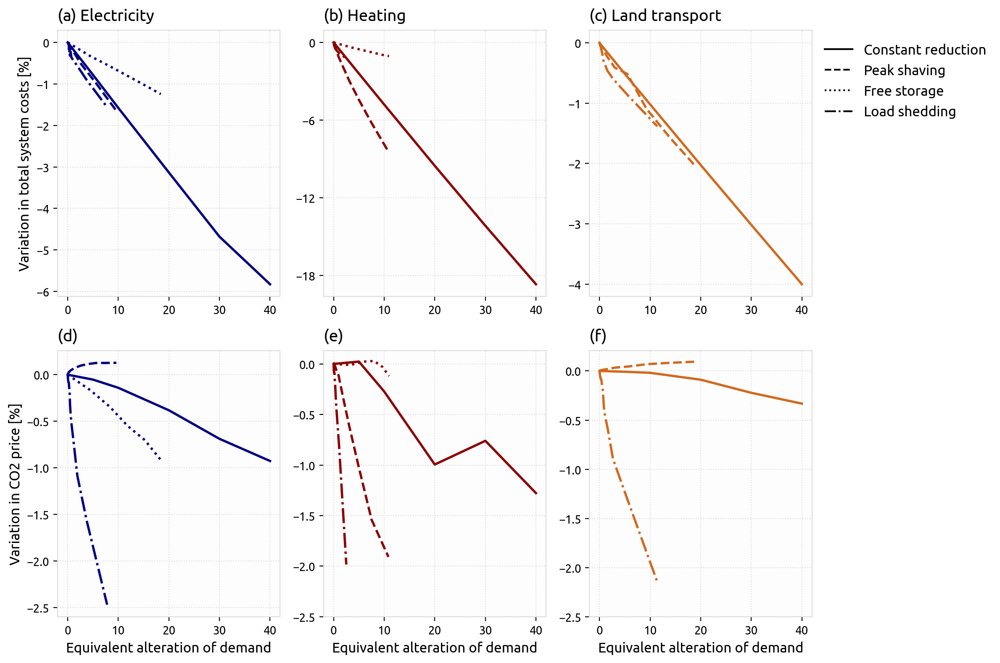

In [28]:
## constant demand reduction 
from matplotlib.gridspec import GridSpec
from matplotlib.ticker import FormatStrFormatter

plt.rc('axes',edgecolor='gainsboro')
plt.rcParams['axes.facecolor'] = '#fdfdfe'
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams.update({"axes.grid" : True, "grid.color" :"gainsboro" , "grid.linestyle":"dotted"})

fig, axs = plt.subplots(2,3 ,figsize=(12,8), dpi=200 ) #sharey=True) ## run for first time
fig.subplots_adjust(wspace=0.1)
fig.subplots_adjust(hspace=0.1)


index= [i for i in range(9)]
#markers = ['o','v','d','<','X','s','>','p']
markers = {'Electricity':'o',
           'Heat': '^',
           'Land-transport': 'd',
           'elec':'o',
           'heat': '^',
           'tran': 'd',
           'Industry':'<',
           'Aviation':'X',
           'Shipping':'s',
           'Agriculture':'>',
           #'p'
          }

techs_to_plot= ['solar', 'solar rooftop' ,'solar-hsat','nuclear','onwind', 'offwind-ac' ,'offwind-dc', 
      'H2 Electrolysis', 'battery discharger', 'electricity distribution grid',#'V2G', 'BEV charger',: they have constant cap., but energy changes
            'biomass CHP', 'biomass boiler','gas CHP' , 'gas boiler', 'OCGT', #'Heat storage', #:too large? (water tank discharger)
        'heat pump','resistive heater',# 'Solar thermal','biomass boiler': too large
         #'gas store', 'H2 store','EV battery', :energy cap.
        'methanolisation', 'Fischer-Tropsch' ,'SMR', 'DAC']



main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIelecI{}_2050.nc':[['p05','p10','p20','p30','p40',],'Electricity demand reduction' ] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIheatI{}_2050.nc':[['p05','p10-lowtol','p20-lowtol','p30-lowtol','p40-lowtol',],'Heat demand reduction'] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIinduI{}_2050.nc':[['p05','p10','p20','p30','p40',],'Industry demand reduction']  ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmItranI{}_2050.nc':[['p05','p10','p20','p30-lowtol','p40',],'Land-transport demand reduction']  ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIshipI{}_2050.nc':[['p05','p10','p20','p30','p40',],'Shipping demand reduction']  ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIaviaI{}_2050.nc':[['p05','p10','p20','p30-lowtol','p40',],'Aviation demand reduction']  ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIagriI{}_2050.nc':[['p05','p10-lowtol','p20','p30','p40'],'Agriculture demand reduction']  ,  ## p90 available
}


results_total=pd.read_csv('csvs_read/results_total_dem.csv', index_col=0)
costs=pd.read_csv('csvs_read/costs_dem.csv', index_col=0)
results_caps=pd.read_csv('csvs_read/results_caps_dem.csv', index_col=0)
results_caps= ready_csv(results_caps)


for i, scenario in enumerate(main_scen.keys()) : 
    if main_scen[scenario][1]=='Base' :
        base_scen = scenario
    else :  
        index= [0]+[float(i.split('p')[1][:2]) for i in main_scen[scenario][0]] ##TODO: fix the scenario

        #to_plot= (100*(costs[[base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]].sum()/
         #             costs[base_scen].sum()-1))
        to_plot= (100*((results_total.loc['Total-cost', [base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]]/
                     results_total.loc['Total-cost',base_scen ])-1)) 
        label = main_scen[scenario][1].split(' ')[0]
        if label == 'Electricity' : 
            ax= axs[0,0]
        elif label == 'Heat' : 
            ax= axs[0,1]
        elif label == 'Land-transport' : 
            ax= axs[0,2]
        else:
            continue
        ax.plot(index,  to_plot, #*-1,
                #color= 'k', #tech_colors['solar'],
                linestyle='solid',
                linewidth = 2,
                #marker=markers[label],
                #markersize=8,
                zorder=3,
                label= label, #+ ' demand reduction',
                color= sector_colors[label]) 
        


xlabels = ['Base']+ [int(float(i.split('p')[1][:2])) for i in main_scen[scenario][0]]
#axs[0,0].set_xticks((index))    
#axs[0,0].set_xticklabels(xlabels,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')


for i, scenario in enumerate(main_scen.keys()) : 
    if main_scen[scenario][1]=='Base' :
        base_scen = scenario
    else :  
        index= [0]+[float(i.split('p')[1][:2]) for i in main_scen[scenario][0]] ##TODO: fix the scenario

        #to_plot= (100*(costs[[base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]].sum()/
         #             costs[base_scen].sum()-1))
        to_plot= (100*((abs(results_total.loc['CO2-price', 
                            [base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]])/
                     abs(results_total.loc['CO2-price',base_scen]))-1))   
        label = main_scen[scenario][1].split(' ')[0]
        if label == 'Electricity' : 
            ax= axs[1,0]
        elif label == 'Heat' : 
            ax= axs[1,1]
        elif label == 'Land-transport' : 
            ax= axs[1,2]
        else:
            continue
        ax.plot(index,  to_plot, #*-1,
                #color= 'k', #tech_colors['solar'],
                linestyle='solid',
                linewidth = 2,
               # marker=markers[label],
               # markersize=8,
                zorder=3,
                label= label, #+ ' demand reduction',
                color= sector_colors[label]) 


        

xlabels = ['Base']+ [int(float(i.split('p')[1][:2])) for i in main_scen[scenario][0]]
#axs[0,1].set_xticks((index))    
#axs[0,1].set_xticklabels(xlabels,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')



## peak shaving


main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemIelecI{}_2050.nc':[['p05','p10','p15','p20','p25-lowtol','p30','p35-lowtol','p40', 'p45', 'p50'],'Electricity demand reduction' ] , #'p25','p30',
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemIheatI{}_2050.nc':[['p05','p10','p15','p20','p25','p30','p35','p40', 'p45', 'p50'],'Heat demand reduction'] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemItranI{}_2050.nc':[['p05','p10','p15','p20-lowtol','p25','p30','p35','p40', 'p45', 'p50'],'Land-transport demand reduction']  ,
}


results_total=pd.read_csv('csvs_read/results_total_pdem.csv', index_col=0)
costs=pd.read_csv('csvs_read/costs_pdem.csv', index_col=0)
results_caps=pd.read_csv('csvs_read/results_caps_pdem.csv', index_col=0)
results_caps= ready_csv(results_caps)


peak_change_factors = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]
df_peak2dem_ratios =pd.read_csv('csvs_read/df_peak2dem_ratios.csv', index_col=0)

for i, scenario in enumerate(main_scen.keys()) : 
    if main_scen[scenario][1]=='Base' :
        base_scen = scenario
    else :  
        sector = scenario.split('I')[2]     
        index= [0]+[df_peak2dem_ratios.loc[sector,str(float(i.split('p')[1][:2])/100)] for i in main_scen[scenario][0]] ##TODO: fix the scenario
        #to_plot= (100*(costs[[base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]].sum()/
         #             costs[base_scen].sum()-1))
        to_plot= (100*((results_total.loc['Total-cost', [base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]]/
                     results_total.loc['Total-cost',base_scen ])-1)) 
        label = main_scen[scenario][1].split(' ')[0]
        if label == 'Electricity' : 
            ax= axs[0,0]
        elif label == 'Heat' : 
            ax= axs[0,1]
        elif label == 'Land-transport' : 
            ax= axs[0,2]
        else:
            continue
        ax.plot(index,  to_plot, #*-1,
                #color= 'k', #tech_colors['solar'],
                linestyle='--',
                linewidth = 2,
                #marker=markers[label],
                #markersize=8,
                zorder=3,
                label= label, #+ ' demand reduction',
                color= sector_colors[label]) 
        

for i, scenario in enumerate(main_scen.keys()) : 
    if main_scen[scenario][1]=='Base' :
        base_scen = scenario
    else :  
        sector = scenario.split('I')[2]     
        index= [0]+[df_peak2dem_ratios.loc[sector,str(float(i.split('p')[1][:2])/100)] for i in main_scen[scenario][0]] ##TODO: fix the scenario
        #to_plot= (100*(costs[[base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]].sum()/
         #             costs[base_scen].sum()-1))
        to_plot= (100*((abs(results_total.loc['CO2-price', 
                            [base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]])/
                     abs(results_total.loc['CO2-price',base_scen]))-1))   
        label = main_scen[scenario][1].split(' ')[0]
        if label == 'Electricity' : 
            ax= axs[1,0]
        elif label == 'Heat' : 
            ax= axs[1,1]
        elif label == 'Land-transport' : 
            ax= axs[1,2]
        else:
            continue
        ax.plot(index,  to_plot, #*-1,
                #color= 'k', #tech_colors['solar'],
                linestyle='--',
                linewidth = 2,
                #marker=markers[label],
                #markersize=8,
                zorder=3,
                label= label, #+ ' demand reduction',
                color= sector_colors[label]) 



## Free storage

main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-nov2g_2050.nc':[[''],'Land-transport Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemIelecI{}_2050.nc':[['p0.02-lowv','p0.04-lowv','p0.06-lowv','p0.08-lowv','p0.1-lowv',],'Electricity demand reduction' ] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemIheatI{}_2050.nc':[['p0.02','p0.04','p0.06','p0.08','p0.1',],'Heat demand reduction'] ,
     'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemItranI{}_2050.nc':[['p0.02','p0.04','p0.06','p0.08','p0.1',],'Land-transport demand reduction']  ,
}

results_total=pd.read_csv('csvs_read/results_total_sdem_new.csv', index_col=0)
costs=pd.read_csv('csvs_read/costs_sdem_new.csv', index_col=0)
results_caps=pd.read_csv('csvs_read/results_caps_sdem_new.csv', index_col=0)
results_caps= ready_csv(results_caps)
df_share_shift= pd.read_csv('csvs_read/df_share_shift.csv', index_col=0)

for i, scenario in enumerate(main_scen.keys()) : 
    if main_scen[scenario][1]=='Base' :
        base_scen = scenario
    elif  main_scen[scenario][1]=='Land-transport Base':
        base_scen_tran = scenario
    else :  
        sector = scenario.split('I')[2]     
        index= [0]+[float(df_share_shift.loc[sector+'-p'+((i.split('p')[1]).split('-')[0])])*100 for i in main_scen[scenario][0]] 

        #to_plot= (100*(costs[[base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]].sum()/
         #             costs[base_scen].sum()-1))
        if 'tran' not in scenario:
             to_plot= (100*((results_total.loc['Total-cost', [base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]]/
                     results_total.loc['Total-cost',base_scen ])-1))   
             to_plot_c= (100*((results_total.loc['CO2-price', [base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]]/
                     results_total.loc['CO2-price',base_scen ])-1))      
        else:   ##for land-transport, no v2g for base netweok and others
             to_plot= (100*((results_total.loc['Total-cost', [base_scen_tran]+[scenario.format(i) for i in main_scen[scenario][0]]]/
                     results_total.loc['Total-cost',base_scen_tran ])-1))  
             to_plot_c= (100*((results_total.loc['CO2-price', [base_scen_tran]+[scenario.format(i) for i in main_scen[scenario][0]]]/
                     results_total.loc['CO2-price',base_scen_tran ])-1))
            
        to_plot= to_plot.drop(labels=[i for i in to_plot.index if 'p0.01' in i])  ##TODO: run elec-p0.01 with lowrol       
        to_plot_c= to_plot_c.drop(labels=[i for i in to_plot_c.index if 'p0.01' in i])  ##TODO: run elec-p0.01 with lowrol       
        
        label = main_scen[scenario][1].split(' ')[0]
        if label == 'Electricity' : 
            ax= axs[0,0]
        elif label == 'Heat' : 
            ax= axs[0,1]
        elif label == 'Land-transport' : 
            ax= axs[0,2]
        else:
            continue
        if 'tran' not in label:    
         ax.plot(index,  to_plot, #*-1,
                #color= 'k', #tech_colors['solar'],
                linestyle='dotted',
                linewidth = 2,
                #marker=markers[label],
                #markersize=8,
                zorder=3,
                label= label, #+ ' demand reduction',
                color= sector_colors[label])  


for i, scenario in enumerate(main_scen.keys()) : 
    if main_scen[scenario][1]=='Base' :
        base_scen = scenario
    elif  main_scen[scenario][1]=='Land-transport Base':
        base_scen_tran = scenario
    else :  
        sector = scenario.split('I')[2]     
        index= [0]+[float(df_share_shift.loc[sector+'-p'+((i.split('p')[1]).split('-')[0])])*100 for i in main_scen[scenario][0]] 

        #to_plot= (100*(costs[[base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]].sum()/
         #             costs[base_scen].sum()-1))
        if 'tran' not in scenario:
             to_plot= (100*((results_total.loc['Total-cost', [base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]]/
                     results_total.loc['Total-cost',base_scen ])-1))   
             to_plot_c= (100*((results_total.loc['CO2-price', [base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]]/
                     results_total.loc['CO2-price',base_scen ])-1))      
        else:   ##for land-transport, no v2g for base netweok and others
             to_plot= (100*((results_total.loc['Total-cost', [base_scen_tran]+[scenario.format(i) for i in main_scen[scenario][0]]]/
                     results_total.loc['Total-cost',base_scen_tran ])-1))  
             to_plot_c= (100*((results_total.loc['CO2-price', [base_scen_tran]+[scenario.format(i) for i in main_scen[scenario][0]]]/
                     results_total.loc['CO2-price',base_scen_tran ])-1))
            
        to_plot= to_plot.drop(labels=[i for i in to_plot.index if 'p0.01' in i])  ##TODO: run elec-p0.01 with lowrol       
        to_plot_c= to_plot_c.drop(labels=[i for i in to_plot_c.index if 'p0.01' in i])  ##TODO: run elec-p0.01 with lowrol       
        
        label = main_scen[scenario][1].split(' ')[0]
        if label == 'Electricity' : 
            ax= axs[1,0]
        elif label == 'Heat' : 
            ax= axs[1,1]
        elif label == 'Land-transport' : 
            ax= axs[1,2]
        else:
            continue
        if 'tran' not in label:                
               
          ax.plot(index,  to_plot_c, #*-1,   #[:7]
                #color= 'k', #tech_colors['solar'],
                linestyle='dotted',
                linewidth = 2,
                #marker=markers[label],
                #markersize=8,
                zorder=3,
                label= label, #+ ' demand reduction',
                color= sector_colors[label])  
        

## load shedding

main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   , #'p100000','p10000','p1000',p5000','p2500',
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemIelecI{}_2050.nc':[['p950-lowtol', 'p850-lowtol','p800', 'p750-lowtol','p700-lowtol','p650-lowtol','p600-lowtol','p550-lowtol', 'p549-lowtol','p500-lowtol','p450-lowtol','p400','p350-lowtol','p300', 'p250','p200-lowtol'],'Electricity demand reduction' ] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemIheatI{}_2050.nc':[['p950','p850','p800','p750-lowtol','p700','p650','p600','p550-lowtol','p500','p450','p400','p350','p300','p250-lowtol','p200'],'Heat demand reduction'] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemItranI{}_2050.nc':[['p950','p850','p800','p750','p700','p650','p600','p550','p500','p450','p400','p350','p300','p250','p200'],'Land-transport demand reduction']  ,
}
results_total=pd.read_csv('csvs_read/results_total_ldem_new.csv', index_col=0)
costs=pd.read_csv('csvs_read/costs_ldem_new.csv', index_col=0)
results_caps=pd.read_csv('csvs_read/results_caps_ldem_new.csv', index_col=0)
results_caps= ready_csv(results_caps)
df_ls_to_demand=pd.read_csv('csvs_read/df_ls_to_demand_new.csv', index_col=0)


for i, scenario in enumerate(main_scen.keys()) : 
    if main_scen[scenario][1]=='Base' :
        base_scen = scenario
    else :  
      sector= scenario.split('I')[2]
      index= [0]+[float(df_ls_to_demand.loc[sector, 'p'+(i.split('p')[1])[:3]])*100 for i in main_scen[scenario][0] ]       #index=[0,2500,4000,4200,4400,4500,4600,4700]  #arbitrary
        #to_plot= (100*(costs[[base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]].sum()/
         #             costs[base_scen].sum()-1))
      to_plot= (100*((results_total.loc['Total-cost', [scenario.format(i) for i in main_scen[scenario][0]]]/ #[base_scen]+
                     results_total.loc['Total-cost',base_scen ])-1))   
      to_plot_c= (100*((results_total.loc['CO2-price', [scenario.format(i) for i in main_scen[scenario][0]]]/ #[base_scen]+
                     results_total.loc['CO2-price',base_scen ])-1))     
      label = main_scen[scenario][1].split(' ')[0]
      to_plot[to_plot>0] = np.nan
    
      if label == 'Electricity' : 
            ax= axs[0,0]
      elif label == 'Heat' : 
            ax= axs[0,1]
      elif label == 'Land-transport' : 
            ax= axs[0,2]
      else:
            continue
      ax.plot(index,  [0]+ [i for i in to_plot] , ## i*-1  arbitrary index for Base
                #color= 'k', #tech_colors['solar'],
                linestyle='dashdot',
                linewidth = 2,
                #marker=markers[label],
                #markersize=8,
                zorder=3,
                label= label, #+ ' demand reduction',
                color= sector_colors[label])  


for i, scenario in enumerate(main_scen.keys()) : 
    if main_scen[scenario][1]=='Base' :
        base_scen = scenario
    else :  
      sector= scenario.split('I')[2]
      index= [0]+[float(df_ls_to_demand.loc[sector, 'p'+(i.split('p')[1])[:3]])*100 for i in main_scen[scenario][0] ]       #index=[0,2500,4000,4200,4400,4500,4600,4700]  #arbitrary
        #to_plot= (100*(costs[[base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]].sum()/
         #             costs[base_scen].sum()-1))
      to_plot= (100*((results_total.loc['Total-cost', [scenario.format(i) for i in main_scen[scenario][0]]]/ #[base_scen]+
                     results_total.loc['Total-cost',base_scen ])-1))   
      to_plot_c= (100*((results_total.loc['CO2-price', [scenario.format(i) for i in main_scen[scenario][0]]]/ #[base_scen]+
                     results_total.loc['CO2-price',base_scen ])-1))     
      label = main_scen[scenario][1].split(' ')[0]
      to_plot[to_plot>0] = np.nan
      label = main_scen[scenario][1].split(' ')[0]
    
      if label == 'Electricity' : 
            ax= axs[1,0]
      elif label == 'Heat' : 
            ax= axs[1,1]
      elif label == 'Land-transport' : 
            ax= axs[1,2]
      else:
            continue
            
      ax.plot(index,  [0]+ [i for i in to_plot_c] , ## i*-1 arbitrary index for Base
                #color= 'k', #tech_colors['solar'],
                linestyle='dashdot',
                linewidth = 2,
                #marker=markers[label],
                #markersize=8,
                zorder=3,
                label= label, #+ ' demand reduction',
                color= sector_colors[label])  

legend_manual=[]
labels=['Constant reduction', 'Peak shaving', 'Free storage', 'Load shedding']

custom_lines = [Line2D([0], [0], color='k', linestyle='solid'),
                Line2D([0], [0], color='k', linestyle='dashed'),
                Line2D([0], [0], color='k', linestyle='dotted'),
                Line2D([0], [0], color='k',linestyle='dashdot')]

axs[0,0].set_ylabel('Variation in total system costs [%]', fontsize=12)    
axs[1,0].set_ylabel('Variation in CO2 price [%]', fontsize=12)   


#for ax in axs.reshape(-1):
#  ax.set_xlim((0,20))
for ax in [axs[1,0],axs[1,1],axs[1,2]]:
 ax.set_xlabel('Equivalent alteration of demand', fontsize=12)    

axs[0,0].set_title('(a) Electricity',loc='left', fontsize= 14, pad=8)
axs[0,1].set_title('(b) Heating',loc='left', fontsize= 14, pad=8)
axs[0,2].set_title('(c) Land transport',loc='left', fontsize= 14, pad=8)
axs[1,0].set_title('(d)',loc='left', fontsize= 14, pad=8)
axs[1,1].set_title('(e)',loc='left', fontsize= 14, pad=8)
axs[1,2].set_title('(f) ',loc='left', fontsize= 14, pad=8)

for ax in [axs[1,0], axs[1,1], axs[1,2]]:
   ax.set_yticks([-2.5, -2, -1.5, -1, -0.5, 0 ])    

axs[0,1].set_yticks([-18, -12, -6, 0 ])    
axs[0,2].set_yticks([-4, -3, -2, -1, 0 ])    
ax.set_yticks([-2.5, -2, -1.5, -1, -0.5, 0 ])    

axs[0,2].legend(custom_lines, labels,loc='best',bbox_to_anchor=(1,1),
           ncol=1,
           fontsize=12, frameon=False)  

fig.tight_layout()    

## Supplementary Figure 7

INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores


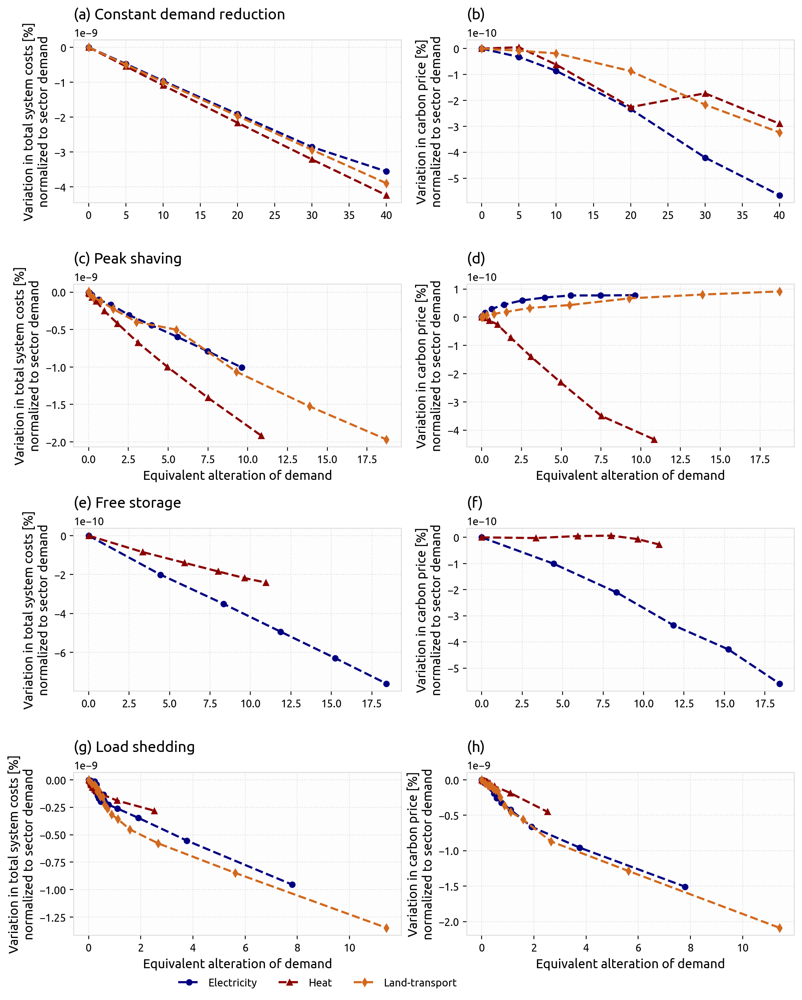

In [29]:
## constant demand reduction 
from matplotlib.gridspec import GridSpec
from matplotlib.ticker import FormatStrFormatter
"""
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'
plt.rc('axes',edgecolor='gainsboro')
plt.rcParams.update({"axes.grid" : True, "grid.color" :"gainsboro" , "grid.linestyle":"dotted"})
"""
plt.rc('axes',edgecolor='gainsboro')
plt.rcParams['axes.facecolor'] = '#fdfdfe'
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams.update({"axes.grid" : True, "grid.color" :"gainsboro" , "grid.linestyle":"dotted"})

fig, axs = plt.subplots(4,2 ,figsize=(12,15), dpi=200 ) #sharey=True) ## run for first time
plt.subplots_adjust(hspace=0.5)
plt.subplots_adjust(wspace=0.2)
index= [i for i in range(9)]



main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIelecI{}_2050.nc':[['p05','p10','p20','p30','p40',],'Electricity demand reduction' ] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIheatI{}_2050.nc':[['p05','p10-lowtol','p20-lowtol','p30-lowtol','p40-lowtol',],'Heat demand reduction'] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmItranI{}_2050.nc':[['p05','p10','p20','p30-lowtol','p40',],'Land-transport demand reduction']  ,
}

n_base= pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc')
df_load = n_base.loads_t.p.sum().groupby(n_base.loads.carrier).sum() * (8760/len(n_base.snapshots)) #


results_total=pd.read_csv('csvs_read/results_total_dem.csv', index_col=0)
costs=pd.read_csv('csvs_read/costs_dem.csv', index_col=0)
results_caps=pd.read_csv('csvs_read/results_caps_dem.csv', index_col=0)
results_caps= ready_csv(results_caps)

for i, scenario in enumerate(main_scen.keys()) : 
    if main_scen[scenario][1]=='Base' :
        base_scen = scenario
    else :  
        index= [0]+[float(i.split('p')[1][:2]) for i in main_scen[scenario][0]] ##TODO: fix the scenario

        #to_plot= (100*(costs[[base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]].sum()/
         #             costs[base_scen].sum()-1))
        to_plot= (100*((results_total.loc['Total-cost', [base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]]/
                     results_total.loc['Total-cost',base_scen ])-1)) 
        label = main_scen[scenario][1].split(' ')[0]
        sector= [i for i in carrier_names.keys() if i+'I' in scenario][0]
        sector_load = df_load[[i for i in carrier_names[sector] if i in df_load.index]].sum()
        to_plot= to_plot/sector_load
        axs[0,0].plot(index,  to_plot,#*-1,
                #color= 'k', #tech_colors['solar'],
                linestyle='--',
                linewidth = 2,
                marker=markers[label],
                markersize=5,
                zorder=3,
                label= label, #+ ' demand reduction',
                color= sector_colors[label]) 


for i, scenario in enumerate(main_scen.keys()) : 
    if main_scen[scenario][1]=='Base' :
        base_scen = scenario
    else :   
        index= [0]+[float(i.split('p')[1][:2]) for i in main_scen[scenario][0]]
        #to_plot= (100*(costs[[base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]].sum()/
         #             costs[base_scen].sum()-1))
        to_plot= (100*((abs(results_total.loc['CO2-price', 
                            [base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]])/
                     abs(results_total.loc['CO2-price',base_scen]))-1))   
        sector= [i for i in carrier_names.keys() if i+'I' in scenario][0]
        sector_load = df_load[[i for i in carrier_names[sector] if i in df_load.index]].sum()
        to_plot= to_plot/sector_load
        label = main_scen[scenario][1].split(' ')[0]
        axs[0,1].plot(index,  to_plot,#*-1,
                #color= 'k', #tech_colors['solar'],
                linestyle='--',
                linewidth = 2,
                marker=markers[label],
                markersize=5,
                zorder=3,
                label= label,#+ ' demand reduction',
                color= sector_colors[label])  


## peak shaving


main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemIelecI{}_2050.nc':[['p05','p10','p15','p20','p25-lowtol','p30','p35-lowtol','p40', 'p45', 'p50'],'Electricity demand reduction' ] , #'p25','p30',
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemIheatI{}_2050.nc':[['p05','p10','p15','p20','p25','p30','p35','p40', 'p45', 'p50'],'Heat demand reduction'] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemItranI{}_2050.nc':[['p05','p10','p15','p20-lowtol','p25','p30','p35','p40', 'p45', 'p50'],'Land-transport demand reduction']  ,
}


results_total=pd.read_csv('csvs_read/results_total_pdem.csv', index_col=0)
costs=pd.read_csv('csvs_read/costs_pdem.csv', index_col=0)
results_caps=pd.read_csv('csvs_read/results_caps_pdem.csv', index_col=0)
results_caps= ready_csv(results_caps)

index= [i for i in range(9)]


for i, scenario in enumerate(main_scen.keys()) : 
    if main_scen[scenario][1]=='Base' :
        base_scen = scenario
    else :     
        #to_plot= (100*(costs[[base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]].sum()/
         #             costs[base_scen].sum()-1))
    
        to_plot= (100*((results_total.loc['Total-cost', [base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]]/
                     results_total.loc['Total-cost',base_scen ])-1))   
        sector= [i for i in carrier_names.keys() if i+'I' in scenario][0]
        index= [0]+[df_peak2dem_ratios.loc[sector,str(float(i.split('p')[1][:2])/100)] for i in main_scen[scenario][0]] ##TODO: fix the scenario
        sector_load = df_load[[i for i in carrier_names[sector] if i in df_load.index]].sum()
        to_plot= to_plot/sector_load
        label = main_scen[scenario][1].split(' ')[0]
        axs[1,0].plot(index,  to_plot,#*-1,
                #color= 'k', #tech_colors['solar'],
                linestyle='--',
                linewidth = 2,
                marker=markers[label],
                markersize=5,
                zorder=3,
                label= label+ ' demand reduction',
                color= sector_colors[label]) 


for i, scenario in enumerate(main_scen.keys()) : 
    if main_scen[scenario][1]=='Base' :
        base_scen = scenario
    else :     
        #to_plot= (100*(costs[[base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]].sum()/
         #             costs[base_scen].sum()-1))
    
        to_plot= (100*((results_total.loc['CO2-price', [base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]]/
                     results_total.loc['CO2-price',base_scen ])-1))   
        sector= [i for i in carrier_names.keys() if i+'I' in scenario][0]
        sector_load = df_load[[i for i in carrier_names[sector] if i in df_load.index]].sum()
        to_plot= to_plot/sector_load
        index= [0]+[df_peak2dem_ratios.loc[sector,str(float(i.split('p')[1][:2])/100)] for i in main_scen[scenario][0]] ##TODO: fix the scenario
        
        label = main_scen[scenario][1].split(' ')[0]
        axs[1,1].plot(index,  to_plot,#*-1,
                #color= 'k', #tech_colors['solar'],
                linestyle='--',
                linewidth = 2,
                marker=markers[label],
                markersize=5,
                zorder=3,
                label= label+ ' demand reduction',
                color= sector_colors[label])  



## Free storage

main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-nov2g_2050.nc':[[''],'Land-transport Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemIelecI{}_2050.nc':[['p0.02-lowv','p0.04-lowv','p0.06-lowv','p0.08-lowv','p0.1-lowv',],'Electricity demand reduction' ] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemIheatI{}_2050.nc':[['p0.02','p0.04','p0.06','p0.08','p0.1',],'Heat demand reduction'] ,
     'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemItranI{}_2050.nc':[['p0.02','p0.04','p0.06','p0.08','p0.1',],'Land-transport demand reduction']  ,
}

results_total=pd.read_csv('csvs_read/results_total_sdem_new.csv', index_col=0)
costs=pd.read_csv('csvs_read/costs_sdem_new.csv', index_col=0)
results_caps=pd.read_csv('csvs_read/results_caps_sdem_new.csv', index_col=0)
results_caps= ready_csv(results_caps)
df_share_shift= pd.read_csv('csvs_read/df_share_shift.csv', index_col=0)


for i, scenario in enumerate(main_scen.keys()) : 
    if main_scen[scenario][1]=='Base' :
        base_scen = scenario
    elif  main_scen[scenario][1]=='Land-transport Base':
        base_scen_tran = scenario
    else :  

        #to_plot= (100*(costs[[base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]].sum()/
         #             costs[base_scen].sum()-1))
        if 'tran' not in scenario:
             to_plot= (100*((results_total.loc['Total-cost', [base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]]/
                     results_total.loc['Total-cost',base_scen ])-1))   
             to_plot_c= (100*((results_total.loc['CO2-price', [base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]]/
                     results_total.loc['CO2-price',base_scen ])-1))      
        else:   ##for land-transport, no v2g for base netweok and others
             to_plot= (100*((results_total.loc['Total-cost', [base_scen_tran]+[scenario.format(i) for i in main_scen[scenario][0]]]/
                     results_total.loc['Total-cost',base_scen_tran ])-1))  
             to_plot_c= (100*((results_total.loc['CO2-price', [base_scen_tran]+[scenario.format(i) for i in main_scen[scenario][0]]]/
                     results_total.loc['CO2-price',base_scen_tran ])-1))
            
        to_plot= to_plot.drop(labels=[i for i in to_plot.index if 'p0.01' in i])  ##TODO: run elec-p0.01 with lowrol       
        to_plot_c= to_plot_c.drop(labels=[i for i in to_plot_c.index if 'p0.01' in i])  ##TODO: run elec-p0.01 with lowrol       

        sector= [i for i in carrier_names.keys() if i+'I' in scenario][0]
        sector_load = df_load[[i for i in carrier_names[sector] if i in df_load.index]].sum()
        to_plot= to_plot/sector_load
        to_plot_c= to_plot_c/sector_load
        index= [0]+[float(df_share_shift.loc[sector+'-p'+((i.split('p')[1]).split('-')[0])])*100 for i in main_scen[scenario][0]] 

        label = main_scen[scenario][1].split(' ')[0]
        if 'tran' not in label:                

         axs[2,0].plot(index,  to_plot,#*-1,
                #color= 'k', #tech_colors['solar'],
                linestyle='--',
                linewidth = 2,
                marker=markers[label],
                markersize=5,
                zorder=3,
                label= label, #+ ' demand reduction',
                color= sector_colors[label])  

                
         axs[2,1].plot(index,  to_plot_c,#*-1,   #[:7]
                #color= 'k', #tech_colors['solar'],
                linestyle='--',
                linewidth = 2,
                marker=markers[label],
                markersize=5,
                zorder=3,
                label= label, #+ ' demand reduction',
                color= sector_colors[label])  


## load shedding

main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   , #'p100000','p10000','p1000',p5000','p2500',
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemIelecI{}_2050.nc':[['p950-lowtol', 'p850-lowtol','p800', 'p750-lowtol','p700-lowtol','p650-lowtol','p600-lowtol','p550-lowtol', 'p549-lowtol','p500-lowtol','p450-lowtol','p400','p350-lowtol','p300', 'p250','p200-lowtol'],'Electricity demand reduction' ] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemIheatI{}_2050.nc':[['p950','p850','p800','p750-lowtol','p700','p650','p600','p550-lowtol','p500','p450','p400','p350','p300','p250-lowtol','p200'],'Heat demand reduction'] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemItranI{}_2050.nc':[['p950','p850','p800','p750','p700','p650','p600','p550','p500','p450','p400','p350','p300','p250','p200'],'Land-transport demand reduction']  ,
}


results_total=pd.read_csv('csvs_read/results_total_ldem_new.csv', index_col=0)
costs=pd.read_csv('csvs_read/costs_ldem_new.csv', index_col=0)
results_caps=pd.read_csv('csvs_read/results_caps_ldem_new.csv', index_col=0)
results_caps= ready_csv(results_caps)
df_ls_to_demand=pd.read_csv('csvs_read/df_ls_to_demand_new.csv', index_col=0)

for i, scenario in enumerate(main_scen.keys()) : 
    if main_scen[scenario][1]=='Base' :
        base_scen = scenario

    else :  
       #index=[0,2500,4000,4200,4400,4500,4600,4700]  #arbitrary
        #to_plot= (100*(costs[[base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]].sum()/
         #             costs[base_scen].sum()-1))
      to_plot= (100*((results_total.loc['Total-cost', [scenario.format(i) for i in main_scen[scenario][0]]]/ #[base_scen]+
                     results_total.loc['Total-cost',base_scen ])-1))   
      to_plot_c= (100*((results_total.loc['CO2-price', [scenario.format(i) for i in main_scen[scenario][0]]]/ #[base_scen]+
                     results_total.loc['CO2-price',base_scen ])-1))     
      label = main_scen[scenario][1].split(' ')[0]
      to_plot[to_plot>0] = np.nan

      sector= [i for i in carrier_names.keys() if i+'I' in scenario][0]
      sector_load = df_load[[i for i in carrier_names[sector] if i in df_load.index]].sum()
      to_plot= to_plot/sector_load
      to_plot_c= to_plot_c/sector_load
      index= [0]+[float(df_ls_to_demand.loc[sector, 'p'+(i.split('p')[1])[:3]])*100 for i in main_scen[scenario][0] ]       #index=[0,2500,4000,4200,4400,4500,4600,4700]  #arbitrary
        
      axs[3,0].plot(index,  [0]+ [i for i in to_plot] , ##i*-1 arbitrary index for Base
                #color= 'k', #tech_colors['solar'],
                linestyle='--',
                linewidth = 2,
                marker=markers[label],
                markersize=5,
                zorder=3,
                label= label, #+ ' demand reduction',
                color= sector_colors[label])  
      axs[3,1].plot(index,  [0]+ [i for i in to_plot_c] , ##i*-1 arbitrary index for Base
                #color= 'k', #tech_colors['solar'],
                linestyle='--',
                linewidth = 2,
                marker=markers[label],
                markersize=5,
                zorder=3,
                label= label, #+ ' demand reduction',
                color= sector_colors[label])  
for ax in [axs[0,0], axs[1,0], axs[2,0], axs[3,0] ]:
 ax.set_ylabel('Variation in total system costs [%]\nnormalized to sector demand', fontsize=12)    

for ax in [axs[0,1], axs[1,1], axs[2,1], axs[3,1] ]:
 ax.set_ylabel('Variation in carbon price [%]\nnormalized to sector demand', fontsize=12)  

for ax in [axs[1,0], axs[1,1], axs[3,0], axs[3,1] ]:
 ax.set_xlabel('Equivalent alteration of demand', fontsize=12) 
    
axs[0,0].set_title('(a) Constant demand reduction',loc='left', fontsize= 14, pad=8)
axs[1,0].set_title('(c) Peak shaving',loc='left', fontsize= 14, pad=8)
axs[2,0].set_title('(e) Free storage',loc='left', fontsize= 14, pad=8)
axs[3,0].set_title('(g) Load shedding',loc='left', fontsize= 14, pad=8)
axs[0,1].set_title('(b)',loc='left', fontsize= 14, pad=8)
axs[1,1].set_title('(d)',loc='left', fontsize= 14, pad=8)
axs[2,1].set_title('(f)',loc='left', fontsize= 14, pad=8)
axs[3,1].set_title('(h) ',loc='left', fontsize= 14, pad=8)

plt.legend(bbox_to_anchor=(0,-.2),frameon=False, ncol=3)
#fig.tight_layout()    

## Supplementary Figure 5

INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores


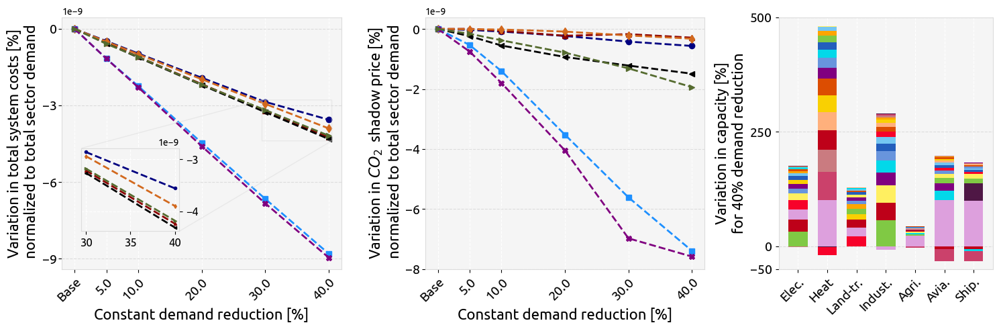

In [15]:
## constant demand reduction 
from matplotlib.gridspec import GridSpec

#fig, axs = plt.subplots(1,3 ,figsize=(18,5), ) #sharey=True) ## run for first time

fig = plt.figure(figsize=(15, 5))
gs0 = GridSpec(1,2,width_ratios=[3,1], figure=fig)  # set up two rows


gs1 = gs0[0].subgridspec(1, 2, wspace=0.3)   
axs[0] = fig.add_subplot(gs1[0])  # create ax1
axs[1] = fig.add_subplot(gs1[1])  # create ax2

gs2 = gs0[1].subgridspec(1, 1, wspace=0.15)       
axs[2] = fig.add_subplot(gs2[0])  

index= [i for i in range(9)]

#for conswcutive: costs[[i.format(main_scen[i][0][1]) for i in main_scen.keys()]].sum(),
axins = axs[0].inset_axes([0.07, 0.15, 0.35, 0.33],)
n_base= pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc')
df_load = n_base.loads_t.p.sum().groupby(n_base.loads.carrier).sum() * (8760/len(n_base.snapshots)) #

for i, scenario in enumerate(main_scen.keys()) : 
    if main_scen[scenario][1]=='Base' :
        base_scen = scenario
    else :  
        index= [0]+[float(i.split('p')[1][:2]) for i in main_scen[scenario][0]] ##TODO: fix the scenario
        sector= [i for i in carrier_names.keys() if i+'I' in scenario][0]
        sector_load = df_load[[i for i in carrier_names[sector] if i in df_load.index]].sum()
        
        #to_plot= (100*(costs[[base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]].sum()/
         #             costs[base_scen].sum()-1))
        to_plot= (100*((results_total.loc['Total-cost', [base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]]/
                     results_total.loc['Total-cost',base_scen ])-1))
        
        ## normalize:
        to_plot= to_plot/ sector_load
        
        label = main_scen[scenario][1].split(' ')[0]
        axs[0].plot(index,  to_plot, #*-1,
                #color= 'k', #tech_colors['solar'],
                linestyle='--',
                linewidth = 2,
                marker=markers[label],
                markersize=6,
                zorder=3,
                label= label, #+ ' demand reduction',
                color= sector_colors[label]) 
        if sector not in ['avia', 'ship'] :  ##added
          axins.plot(index[4:],  to_plot[4:],#*-1,
                #index[:3],  to_plot[:3]*-1,
                linestyle='--',
                linewidth = 2,
                marker=markers[label],
                markersize=3,
                zorder=3,
                label= label, #+ ' demand reduction',
                color= sector_colors[label]
                 )  
  


axins.yaxis.tick_right()
axins.set_xticks([30,35, 40])
axins.tick_params(axis='x', labelsize=12,)
axins.tick_params(axis='y', labelsize=12,)
axs[0].indicate_inset_zoom(axins, edgecolor="gainsboro")


xlabels = ['Base']+ [float(i.split('p')[1][:2]) for i in main_scen[scenario][0]]
axs[0].set_xticks((index))    
axs[0].set_xticklabels(xlabels,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')
axs[0].set_ylabel('Variation in total system costs [%]\n normalized to total sector demand', fontsize=16)    
axs[0].set_xlabel('Constant demand reduction [%]', fontsize=16)    
axs[0].grid(axis = 'y' , color='gainsboro', zorder=0)
axs[0].tick_params(axis='y', labelsize=14, pad=2,)
#axs[0].set_yticks(np.arange(0,20.1,5))    



for i, scenario in enumerate(main_scen.keys()) : 
    if main_scen[scenario][1]=='Base' :
        base_scen = scenario
    else :   
        index= [0]+[float(i.split('p')[1][:2]) for i in main_scen[scenario][0]]
        sector= [i for i in carrier_names.keys() if i+'I' in scenario][0]
        sector_load = df_load[[i for i in carrier_names[sector] if i in df_load.index]].sum()
        
        #to_plot= (100*(costs[[base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]].sum()/
         #             costs[base_scen].sum()-1))
        to_plot= (100*((abs(results_total.loc['CO2-price', 
                            [base_scen]+[scenario.format(i) for i in main_scen[scenario][0]]])/
                     abs(results_total.loc['CO2-price',base_scen]))-1)) 
        
        ## normalize:
        to_plot= to_plot/ sector_load
        
        label = main_scen[scenario][1].split(' ')[0]
        axs[1].plot(index,  to_plot, # *-1,
                #color= 'k', #tech_colors['solar'],
                linestyle='--',
                linewidth = 2,
                marker=markers[label],
                markersize=6,
                zorder=3,
                label= label,#+ ' demand reduction',
                color= sector_colors[label])  


xlabels = ['Base']+ [float(i.split('p')[1][:2]) for i in main_scen[scenario][0]]
axs[1].set_xticks((index))    
axs[1].set_xticklabels(xlabels,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')
axs[1].set_ylabel('Variation in $CO_{2}$  shadow price [%]\n normalized to total sector demand',fontsize=16)    
axs[1].set_xlabel('Constant demand reduction [%]', fontsize=16)    
axs[1].grid(axis = 'y' , color='gainsboro', zorder=0)
axs[1].tick_params(axis='y', labelsize=14, pad=2,)

handles, labels = axs[1].get_legend_handles_labels()
order = [5,2,4,1,0,6,3] #[2,3,6,1,5,4,0]
order = reversed(order)
axs[1].legend([handles[idx] for idx in order],[labels[idx] for idx in order],
           loc='best',
           #bbox_to_anchor=(1.6, 0.5),ncol=1 , 
           fontsize=12, frameon=False)

## third figure
index= [i for i in range(9)]

#for conswcutive: costs[[i.format(main_scen[i][0][1]) for i in main_scen.keys()]].sum(),

sector_names = ['I'+j for j in carrier_names.keys()]#+['avia', 'ship']
techs_to_plot= ['solar', 'solar rooftop' ,'solar-hsat','onwind', 'offwind-ac' ,'offwind-dc', 'nuclear', 
        'ror', 'gas CHP' , 'OCGT', 
        'heat pump','resistive heater','gas boiler', # 'Solar thermal','biomass boiler', #: too large
        'hydro', 'PHS', 'H2 store' , 'Heat storage' ,# 'EV battery', : never changes
                'battery' ,# 'home battery', # 'gas store',
             #   'biomass CHP',# really big reduction in industry, but in fact quite small installed capacity
                'methanolisation', 'Fischer-Tropsch' , 'DAC']
bar_width=.65
index=np.arange(len(sector_names))
for i, sector in enumerate(sector_names) :
      to_select= [i for i in main_scen.keys() if sector in i]
      last_scen=to_select[0].format(main_scen[to_select[0]][0][-1])
      temp= (results_caps[last_scen]/results_caps[base_scen])-1
        
      #temp =temp.loc[:, temp.columns[:7]] ##show only until 0.1% of demand 
      to_plot= temp[techs_to_plot].sort_values(ascending= True) #.mean() ? .diff(axis=1).sum(axis=1)
      bottom_p=0
      bottom_n=0
      for component in (to_plot.index): #(to_plot[abs(to_plot)<0.5]).index :
        if   to_plot[component]<0 :
          axs[2].bar(index[i], (to_plot[component])*-100,
                  bar_width, bottom=bottom_n , 
                  color=tech_colors[component], label=component, zorder=3)
          bottom_n += (to_plot[component])*-100
        else: 
          axs[2].bar(index[i], (to_plot[component])*-100,
                  bar_width, bottom=bottom_p  ,
                  color=tech_colors[component], label=component, zorder=3)
          bottom_p += (to_plot[component])*-100
            
    
labels = ['Elec.', 'Heat', 'Land-tr.','Indust.', 'Agri.','Avia.', 'Ship.']
xlabels = [i for i in labels] # carrier_names.keys()]
axs[2].set_xticks((index))    
axs[2].set_xticklabels(xlabels,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')
axs[2].set_ylabel('Variation in capacity [%]\nfor 40% demand reduction', fontsize=16)   
#axs[2].set_xlabel('Sector')    
axs[2].grid(axis = 'y' , color='gainsboro', zorder=0)
axs[2].tick_params(axis='y', labelsize=14)
axs[2].set_yticks([-50, 0, 250, 500])    
axs[2].set_ylim((-50, 500))    

axs[0].set_yticks([i*-1 for i in [0,3e-9,6e-9,9e-9]])    
axs[1].set_yticks([i*-1 for i in [0,2e-9,4e-9,6e-9,8e-9]])    

for ax in axs.flat:
  ax.grid(axis = 'x' , color='white', zorder=0)
    


fig.tight_layout()    

## Supplementary figure 8, supplementary figure 9, supplementary figure 10, supplementary figure 11

In [30]:
def ready_csv_supp(csv) :
 for ix in csv.index :   
                if 'resistive heater' in ix  :
                   csv =csv.rename(index={ix : 'resistive heater',})
                if 'heat pump' in ix :
                   csv =csv.rename(index={ix : 'heat pump',})
                if 'biomass' in ix and 'CHP' in ix :
                    csv =csv.rename(index={ix:'biomass CHP',})
                if 'biomass' in ix and 'boiler' in ix:
                    csv =csv.rename(index={ix:'biomass boiler',})
                if 'gas' in ix and 'CHP' in ix :
                    csv =csv.rename(index={ix:'gas CHP',})
                if 'gas' in ix and 'boiler' in ix :
                    csv =csv.rename(index={ix:'gas boiler',})
                #if 'biogas' in ix :csv =csv.rename(index={ix:'Biogas',})
                #if 'oil' in ix and 'agri' not in ix :csv =csv.rename(index={ix:'Oil to power/heat',}) ##oil boilers, oil demand, etc.
                if 'solar thermal' in ix :csv =csv.rename(index={ix:'Solar thermal',})
                if 'water tanks charger' in ix :csv =csv.rename(index={ix:'Heat storage',})
                if 'water tanks discharger' in ix :csv =csv.rename(index={ix:'Heat storage',})
                if 'water tanks' in ix :csv =csv.rename(index={ix:'Heat store',})
                #if 'biogas' in ix :df.rename(index={ix:'Biomass',})
 csv =csv.rename(index={'gas' : 'gas store',})  
 csv =csv.rename(index={'biogas' : 'biogas store',}) 
 csv =csv.rename(index={'H2' : 'H2 store',}) 
 csv= csv.groupby(csv.index).sum()
 csv =csv.rename(index={'H2' : 'H2 store',}) 
 csv =csv.rename(index={'Li ion' : 'EV battery',}) 
    
 return csv



In [31]:
def ready_csv_costs_supp(results_costs) :

  for ix in results_costs.index :   
                if 'resistive heater' in ix  :
                   results_costs =results_costs.rename(index={ix : 'resistive heater',})
                if 'heat pump' in ix :
                   results_costs =results_costs.rename(index={ix : 'heat pump',})
                if 'biomass' in ix and 'CHP' in ix :
                    results_costs =results_costs.rename(index={ix:'biomass CHP',})
                if 'biomass' in ix and 'boiler' in ix:
                    results_costs =results_costs.rename(index={ix:'biomass boiler',})
                if 'gas' in ix and 'CHP' in ix :
                    results_costs =results_costs.rename(index={ix:'gas CHP',})
                if 'gas' in ix and 'boiler' in ix :
                    results_costs =results_costs.rename(index={ix:'gas boiler',})
                #if 'biogas' in ix :results_costs =results_costs.rename(index={ix:'Biogas',})
                #if 'oil' in ix and 'agri' not in ix :results_costs =results_costs.rename(index={ix:'Oil to power/heat',}) ##oil boilers, oil demand, etc.
                if 'solar thermal' in ix :results_costs =results_costs.rename(index={ix:'Solar thermal',})
                if 'water tank' in ix :results_costs =results_costs.rename(index={ix:'Heat store',}) ##all costs:charger+discharger+store
                if 'offwind' in ix :results_costs =results_costs.rename(index={ix:'offwind',})
                if 'home battery' in ix :results_costs =results_costs.rename(index={ix:'home battery',})
                if 'battery' in ix and 'home' not in ix :results_costs =results_costs.rename(index={ix:'battery',}) #all costs:charger+discharger+store
                #if 'biogas' in ix :df.rename(index={ix:'Biomass',})
  results_costs =results_costs.rename(index={'gas' : 'gas store',})  
  results_costs =results_costs.rename(index={'biogas' : 'biogas store',}) 
  results_costs =results_costs.rename(index={'H2' : 'H2 store',}) 
  results_costs= results_costs.groupby(results_costs.index).sum()
  results_costs =results_costs.rename(index={'H2' : 'H2 store',})  ##only store costs, charger and discharger would
     ## be fuel cell and electrolyser, which have their own uses and can't be considered solely as a cost for storing H2
  results_costs =results_costs.rename(index={'Li ion' : 'EV battery',}) ##technically has no costs
  return results_costs


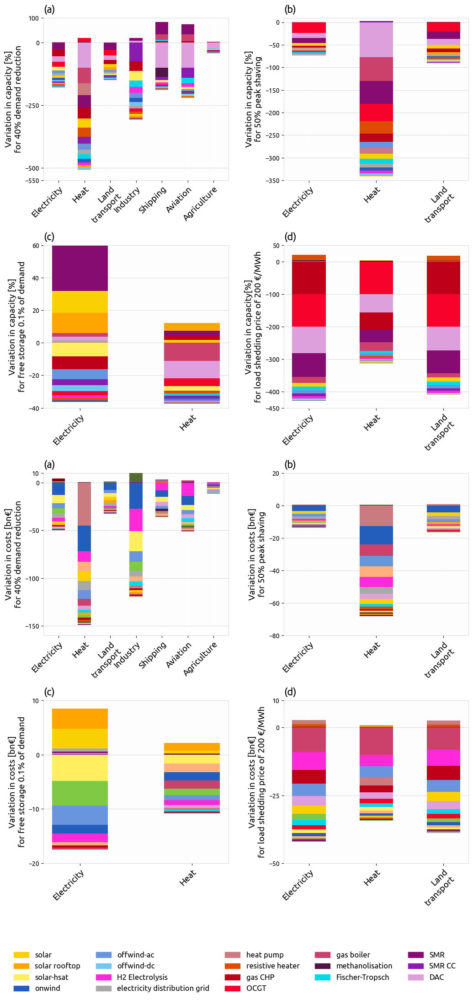

In [47]:
from matplotlib.gridspec import GridSpec
from matplotlib.ticker import FormatStrFormatter

fig, axs = plt.subplots(4,2 ,figsize=(12,24), ) #sharey=True) ## run for first time
fig.subplots_adjust(wspace=0.3)
fig.subplots_adjust(hspace=0.4)


def plot_cap_cost_figures(main_scen, base_scen, sector_names, results_caps, results_costs, axs0, axs1):
  bar_width=.5
  index=np.arange(len(sector_names))
  for i, sector in enumerate(sector_names) :
    
      to_select= [i for i in main_scen.keys() if sector in i]
      last_scen=to_select[0].format(main_scen[to_select[0]][0][-1])
      base_scen= 'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-nov2g_2050.nc' if ('tran' in sector and 'sdem' in last_scen) else 'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc'

     # print(last_scen, base_scen)
      temp= (results_caps[last_scen]/results_caps[base_scen])-1
        
      to_plot= temp[techs_to_plot_cap].sort_values(ascending= True) #.sum() ? .diff(axis=1).sum(axis=1)
      bottom_p=0
      bottom_n=0
      for component in to_plot.index: #(to_plot[abs(to_plot)>0.001]).index :
        if   to_plot[component]<0 :
          axs0.bar(index[i], (to_plot[component])*100, bar_width, bottom=bottom_n , 
                  color=tech_colors[component], label=component, zorder=3)
          bottom_n += (to_plot[component])*100
        else: 
          axs0.bar(index[i], (to_plot[component])*100, bar_width, bottom=bottom_p  ,
                  color=tech_colors[component], label=component, zorder=3)
          bottom_p += (to_plot[component])*100
            
      #temp= (results_costs[to_select]) ##absolute costs .div(results_costs[base_scen].values,axis=0))-1
      temp= (results_costs[last_scen]-results_costs[base_scen])
      to_plot= temp[techs_to_plot].sort_values(ascending= True) #.sum() ? diff(axis=1).sum(axis=1)
      bottom_p=0
      bottom_n=0
      for component in to_plot.index: #(to_plot[abs(to_plot)>0.001]).index :
        if   to_plot[component]<0 :
          axs1.bar(index[i], (to_plot[component])*1, bar_width, bottom=bottom_n , 
                  color=tech_colors[component], label=component, zorder=3)
          bottom_n += (to_plot[component])*1
        else: 
          axs1.bar(index[i], (to_plot[component])*1, bar_width, bottom=bottom_p  ,
                  color=tech_colors[component], label=component, zorder=3)
          bottom_p += (to_plot[component]) *1           
    

markers = ['o','v','d','<','X','s','>','p']
  
#only components that change notica

techs_to_plot_cap= ['solar', 'solar rooftop' ,'solar-hsat','onwind', 'offwind-ac' ,'offwind-dc', 
      'H2 Electrolysis',   'electricity distribution grid', 
          'heat pump','resistive heater', 
                    'gas CHP' , 'OCGT',  'gas boiler', # 'Solar thermal','biomass boiler', #: too large
             #   'biomass CHP',# really big reduction in industry, but in fact quite small installed capacity
                'methanolisation', 'Fischer-Tropsch' ,'SMR',  'SMR CC', 'DAC',#'biomass CHP', 'DC': too small
                   ]


techs_to_plot= ['AC', 'BEV charger', 'DAC', 'DC', 'Fischer-Tropsch', 'H2 Electrolysis',
       'H2 Fuel Cell', 'H2 store', 'Heat store', 'EV battery', 'OCGT', 'PHS',
       'SMR', 'SMR CC', 'Sabatier', 'Solar thermal', 'V2G',
       'battery', 'biogas store', 'biogas to gas',
       'biomass CHP', 'biomass boiler', 'co2', 'co2 sequestered', 'co2 stored',
       'electricity distribution grid', 'gas CHP', 'gas boiler',
       'gas pipeline',
       'gas store','generators-gas', 'heat pump', 'home battery', 'hydro',
       #'methanol', ??
       'methanolisation',  'nuclear', 'offwind', 'oil',
       'onwind', 
       'resistive heater', 'ror', 'solar',
       'solar rooftop', 'solar-hsat', 'solid biomass',
       ]

techs_to_plot= ['solar', 'solar rooftop' ,'solar-hsat','onwind', 'offwind',
       'H2 Electrolysis', 'battery' ,'electricity distribution grid', 
        'gas CHP' , 'OCGT', 'gas boiler',
        'heat pump','resistive heater', 
         'H2 store' , 'Heat store' , 'gas store',
     'biomass CHP',
'SMR',  'methanolisation', 'Fischer-Tropsch' , 'DAC', ]


main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIelecI{}_2050.nc':[['p05','p10','p20','p30','p40',],'Electricity demand reduction' ] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIheatI{}_2050.nc':[['p05','p10-lowtol','p20-lowtol','p30-lowtol','p40-lowtol',],'Heat demand reduction'] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIinduI{}_2050.nc':[['p05','p10','p20','p30','p40',],'Industry demand reduction']  ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmItranI{}_2050.nc':[['p05','p10','p20','p30-lowtol','p40',],'Land-transport demand reduction']  ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIshipI{}_2050.nc':[['p05','p10','p20','p30','p40',],'Shipping demand reduction']  ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIaviaI{}_2050.nc':[['p05','p10','p20','p30-lowtol','p40',],'Aviation demand reduction']  ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIagriI{}_2050.nc':[['p05','p10-lowtol','p20','p30','p40'],'Agriculture demand reduction']  ,  ## p90 available
}

results_costs=pd.read_csv('csvs_read/results_costs_dem.csv', index_col=0)
results_costs= ready_csv_costs_supp(results_costs)
results_caps=pd.read_csv('csvs_read/results_caps_dem.csv', index_col=0)
results_caps= ready_csv_supp(results_caps)
sector_names = ['I'+j for j in ['elec', 'heat', 'tran','indu', 'ship', 'avia', 'agri']]

plot_cap_cost_figures(main_scen, base_scen, sector_names, results_caps, results_costs, axs[0,0], axs[2,0])
           
            
labels = ['Electricity', 'Heat', 'Land\ntransport','Industry', 'Shipping','Aviation','Agriculture']
index=np.arange(len(sector_names))
xlabels = [i for i in labels] # carrier_names.keys()]
for ax in [axs[0,0],axs[2,0]]:
  ax.set_xticks((index))    
  ax.set_xticklabels(xlabels,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')
  #ax.set_xlabel('Sector')    
  ax.grid(axis = 'y' , color='gainsboro', zorder=0)

axs[0,0].set_ylabel('Variation in capacity [%]\nfor 40% demand reduction', fontsize=14) 
axs[2,0].set_ylabel('Variation in costs [bn€]\nfor 40% demand reduction', fontsize=14) 

   
## peak shaving


main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemIelecI{}_2050.nc':[['p05','p10','p15','p20','p25-lowtol','p30','p35-lowtol','p40', 'p45', 'p50'],'Electricity demand reduction' ] , #'p25','p30',
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemIheatI{}_2050.nc':[['p05','p10','p15','p20','p25','p30','p35','p40', 'p45', 'p50'],'Heat demand reduction'] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemItranI{}_2050.nc':[['p05','p10','p15','p20-lowtol','p25','p30','p35','p40', 'p45', 'p50'],'Land-transport demand reduction']  ,
}

results_costs=pd.read_csv('csvs_read/results_costs_pdem.csv', index_col=0)
results_costs= ready_csv_costs_supp(results_costs)
results_caps=pd.read_csv('csvs_read/results_caps_pdem.csv', index_col=0)
results_caps= ready_csv_supp(results_caps)
sector_names = ['I'+j for j in ['elec', 'heat', 'tran',]]

plot_cap_cost_figures(main_scen, base_scen, sector_names, results_caps, results_costs, axs[0,1], axs[2,1])
           
            
labels = ['Electricity', 'Heat', 'Land\ntransport',]
index=np.arange(len(sector_names))
xlabels = [i for i in labels] # carrier_names.keys()]
for ax in [axs[0,1],axs[2,1]]:
  ax.set_xticks((index))    
  ax.set_xticklabels(xlabels,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')
  #ax.set_xlabel('Sector')    
  ax.grid(axis = 'y' , color='gainsboro', zorder=0)
    
axs[0,1].set_ylabel('Variation in capacity [%]\nfor 50% peak shaving', fontsize=14) 
axs[2,1].set_ylabel('Variation in costs [bn€]\nfor 50% peak shaving', fontsize=14)     

## Free storage

main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-nov2g_2050.nc':[[''],'Land-transport Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemIelecI{}_2050.nc':[['p0.02-lowv','p0.04-lowv','p0.06-lowv','p0.08-lowv','p0.1-lowv',],'Electricity demand reduction' ] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemIheatI{}_2050.nc':[['p0.02','p0.04','p0.06','p0.08','p0.1',],'Heat demand reduction'] ,
     'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemItranI{}_2050.nc':[['p0.02','p0.04','p0.06','p0.08','p0.1',],'Land-transport demand reduction']  ,
}

results_costs=pd.read_csv('csvs_read/results_costs_sdem_new.csv', index_col=0)
results_costs= ready_csv_costs_supp(results_costs)
results_caps=pd.read_csv('csvs_read/results_caps_sdem_new.csv', index_col=0)
results_caps= ready_csv_supp(results_caps)
sector_names = ['I'+j for j in ['elec', 'heat',]]# 'tran',]]

plot_cap_cost_figures(main_scen, base_scen, sector_names, results_caps, results_costs, axs[1,0], axs[3,0])
           
            
labels = ['Electricity', 'Heat',]# 'Land\ntransport',]
index=np.arange(len(sector_names))
xlabels = [i for i in labels] # carrier_names.keys()]
for ax in [axs[1,0],axs[3,0]]:
  ax.set_xticks((index))    
  ax.set_xticklabels(xlabels,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')
  #ax.set_xlabel('Sector')    
  ax.grid(axis = 'y' , color='gainsboro', zorder=0)
    
axs[1,0].set_ylabel('Variation in capacity [%]\nfor free storage 0.1% of demand', fontsize=14) 
axs[3,0].set_ylabel('Variation in costs [bn€]\nfor free storage 0.1% of demand', fontsize=14)       


## load shedding

main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   , #'p100000','p10000','p1000',p5000','p2500',
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemIelecI{}_2050.nc':[['p1000','p950-lowtol', 'p850-lowtol','p800', 'p750-lowtol','p700-lowtol','p650-lowtol','p600-lowtol','p550-lowtol', 'p549-lowtol','p500-lowtol','p450-lowtol','p400','p350-lowtol','p300', 'p250','p200-lowtol'],'Electricity demand reduction' ] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemIheatI{}_2050.nc':[['p1000','p950','p850','p800','p750-lowtol','p700','p650','p600','p550-lowtol','p500','p450','p400','p350','p300','p250-lowtol','p200'],'Heat demand reduction'] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemItranI{}_2050.nc':[['p1000','p950','p850','p800','p750','p700','p650','p600','p550','p500','p450','p400','p350','p300','p250','p200'],'Land-transport demand reduction']  ,
}

results_costs=pd.read_csv('csvs_read/results_costs_ldem_new.csv', index_col=0)
results_costs= ready_csv_costs_supp(results_costs)
results_caps=pd.read_csv('csvs_read/results_caps_ldem_new.csv', index_col=0)
results_caps= ready_csv_supp(results_caps)
sector_names = ['I'+j for j in ['elec', 'heat', 'tran',]]

plot_cap_cost_figures(main_scen, base_scen, sector_names, results_caps, results_costs, axs[1,1], axs[3,1])
           
            
labels = ['Electricity', 'Heat', 'Land\ntransport',]
index=np.arange(len(sector_names))
xlabels = [i for i in labels] # carrier_names.keys()]
for ax in [axs[1,1],axs[3,1]]:
  ax.set_xticks((index))    
  ax.set_xticklabels(xlabels,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')
  #ax.set_xlabel('Sector')    
  ax.grid(axis = 'y' , color='gainsboro', zorder=0)
    
axs[1,1].set_ylabel('Variation in capacity[%]\nfor load shedding price of 200 €/MWh', fontsize=14) 
axs[3,1].set_ylabel('Variation in costs [bn€]\nfor load shedding price of 200 €/MWh', fontsize=14)   



axs[0,0].set_yticks([i*-1 for i in [-100, 0, 250, 500, 550]])    
axs[0,0].set_ylim([-550,100])
axs[2,0].set_yticks([i*-1 for i in [-10, 0, 50, 100,150]])  
axs[2,0].set_ylim([-160,10])
axs[0,1].set_ylim([-350,10])
axs[1,0].set_ylim([-40,60])
axs[1,1].set_ylim([-450,50])
axs[1,1].set_yticks([i*-1 for i in [-50, 0, 100,200,300,400,450]]) 
axs[2,1].set_yticks([i*-1 for i in [-20, 0, 20, 40, 60, 80]])    
axs[2,1].set_ylim([-80,20])
axs[3,0].set_ylim([-20,10])
axs[3,0].set_yticks([i*-1 for i in [-10, 0, 10,20]])    
axs[3,1].set_ylim([-50,10])
axs[3,1].set_yticks([i*-1 for i in [-10, 0, 25,50]]) 

for i, title in enumerate(['(a)', '(b)','(c)', '(d)']):
    axs[0+int(i/2),i%2].set_title(title,loc='left', fontsize= 16, pad=8)
    axs[2+int(i/2),i%2].set_title(title,loc='left', fontsize= 16, pad=8)
    
for ax in axs.flat:
    ax.grid(which='major', axis='x', color= 'white')

legend_manual=[]
for key in techs_to_plot_cap: #(techs_to_plot):
    key_name  = 'oil imports' if key=='oil' else key
    key_name  = 'gas imports' if key=='generators-gas' else key
    legend_manual.append(mpatches.Patch(color=tech_colors[key], label=key_name))
legend1=plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(-1.5,-.5),ncol=5,
           fontsize=12,frameon=False)
#plt.gca().add_artist(legend1)

legend_manual=[]
for key in techs_to_plot: #(techs_to_plot):
  #if key not in ['hydro','PHS','ror','nuclear', 'H2 store']  :
    key_name  = 'oil imports' if key=='oil' else key
    legend_manual.append(mpatches.Patch(color=tech_colors[key], label=key_name))
#legend2=plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(-1.5,-1),ncol=5,
  #         fontsize=12,frameon=False)
#plt.gca().add_artist(legend2)  
   

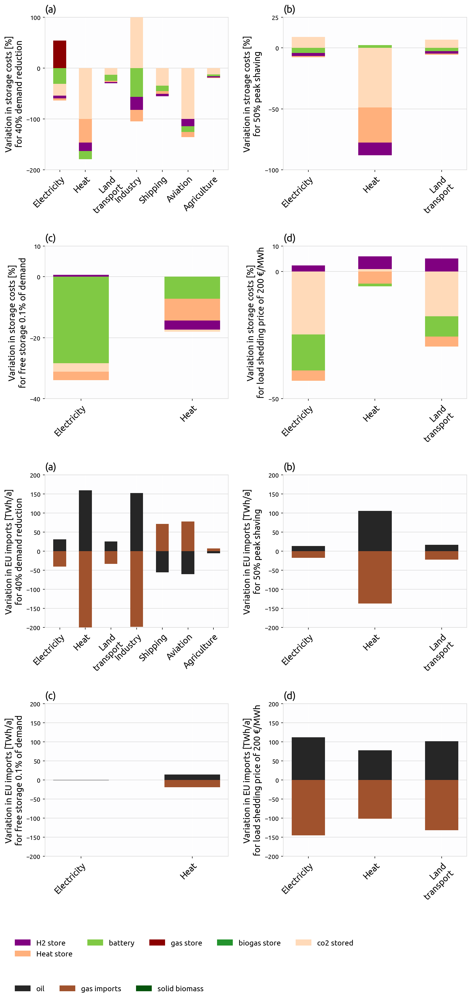

In [68]:
from matplotlib.gridspec import GridSpec
from matplotlib.ticker import FormatStrFormatter

fig, axs = plt.subplots(4,2 ,figsize=(12,24), dpi=150 ) #sharey=True) ## run for first time
fig.subplots_adjust(wspace=0.3)
fig.subplots_adjust(hspace=0.5)

energy_ = pd.read_csv('main_runs/csvs/energy.csv', index_col= [0,1], header=[0,1,2,3])
costs_ = pd.read_csv('main_runs/csvs/costs.csv', index_col= [0,1,2], header=[0,1,2,3])

def plot_cap_cost_figures(main_scen, base_scen, sector_names, results_costs, axs0, axs1):
  bar_width=.5
  index=np.arange(len(sector_names))
  for i, sector in enumerate(sector_names) :

      to_select= [i for i in main_scen.keys() if sector in i]
      last_scen=to_select[0].format(main_scen[to_select[0]][0][-1])
      base_scen= 'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-nov2g_2050.nc' if ('tran' in sector and 'sdem' in last_scen) else 'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc'
      #print(base_scen, last_scen)
      temp= (results_costs[last_scen]/results_costs[base_scen])-1
        
      to_plot= temp[techs_to_plot_store].sort_values(ascending= True) #.sum() ? .diff(axis=1).sum(axis=1)
      bottom_p=0
      bottom_n=0
      for component in to_plot.index: #(to_plot[abs(to_plot)>0.001]).index :
        if   to_plot[component]<0 :
          axs0.bar(index[i], (to_plot[component])*100, bar_width, bottom=bottom_n , 
                  color=tech_colors[component], label=component, zorder=3)
          bottom_n += (to_plot[component])*100
        else: 
          axs0.bar(index[i], (to_plot[component])*100, bar_width, bottom=bottom_p  ,
                  color=tech_colors[component], label=component, zorder=3)
          bottom_p += (to_plot[component])*100
            
      #temp= (results_costs[to_select]) ##absolute costs .div(results_costs[base_scen].values,axis=0))-1
      temp= (results_costs[last_scen]-results_costs[base_scen]) #(results_costs[last_scen]/results_costs[base_scen])-1
      bottom_p=0
      bottom_n=0
      ## convert cost to energy (bnEUR to Twh/a)
      temp=results_costs[last_scen]-results_costs[base_scen]
      temp['oil'] = temp['oil']*1e3*(energy_.loc[('generators','oil')]/costs_.loc[('generators', 'marginal', 'oil')].values).mean()
      temp['generators-gas'] = temp['generators-gas']*1e3*(
          energy_.loc[('generators','gas')]/costs_.loc[('generators', 'marginal', 'gas')].values).mean()

      to_plot= temp[techs_to_plot_fuel].sort_values(ascending= True) #.sum() ? diff(axis=1).sum(axis=1)

      for component in to_plot.index: #(to_plot[abs(to_plot)>0.001]).index :
        if   to_plot[component]<0 :
          axs1.bar(index[i], (to_plot[component])*1, bar_width, bottom=bottom_n , 
                  color=tech_colors[component], label=component, zorder=3)
          bottom_n += (to_plot[component])*1
        else: 
          axs1.bar(index[i], (to_plot[component])*1, bar_width, bottom=bottom_p  ,
                  color=tech_colors[component], label=component, zorder=3)
          bottom_p += (to_plot[component]) *1           
    

markers = ['o','v','d','<','X','s','>','p']
  
#only components that change noticably:

techs_to_plot_store= ['H2 store', 'Heat store',  'battery', #'home battery',
                      'gas store', 
        #'EV battery', no costs
       'biogas store', #'co2', #'co2 sequestered', 
        'co2 stored',
        # 'methanol',
       ]

techs_to_plot_fuel= ['oil', 'generators-gas', 'solid biomass'
       #'methanol',
       ]


main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIelecI{}_2050.nc':[['p05','p10','p20','p30','p40',],'Electricity demand reduction' ] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIheatI{}_2050.nc':[['p05','p10-lowtol','p20-lowtol','p30-lowtol','p40-lowtol',],'Heat demand reduction'] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIinduI{}_2050.nc':[['p05','p10','p20','p30','p40',],'Industry demand reduction']  ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmItranI{}_2050.nc':[['p05','p10','p20','p30-lowtol','p40',],'Land-transport demand reduction']  ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIshipI{}_2050.nc':[['p05','p10','p20','p30','p40',],'Shipping demand reduction']  ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIaviaI{}_2050.nc':[['p05','p10','p20','p30-lowtol','p40',],'Aviation demand reduction']  ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIagriI{}_2050.nc':[['p05','p10-lowtol','p20','p30','p40'],'Agriculture demand reduction']  ,  ## p90 available
}

results_costs=pd.read_csv('csvs_read/results_costs_dem.csv', index_col=0)
results_costs= ready_csv_costs_supp(results_costs)
results_caps=pd.read_csv('csvs_read/results_caps_dem.csv', index_col=0)
results_caps= ready_csv_supp(results_caps)
sector_names = ['I'+j for j in ['elec', 'heat', 'tran','indu', 'ship', 'avia', 'agri']]

plot_cap_cost_figures(main_scen, base_scen, sector_names, results_costs, axs[0,0], axs[2,0])
           
            
labels = ['Electricity', 'Heat', 'Land\ntransport','Industry', 'Shipping','Aviation','Agriculture']
index=np.arange(len(sector_names))
xlabels = [i for i in labels] # carrier_names.keys()]
for ax in [axs[0,0],axs[2,0]]:
  ax.set_xticks((index))    
  ax.set_xticklabels(xlabels,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')
  #ax.set_xlabel('Sector')    
  ax.grid(axis = 'y' , color='gainsboro', zorder=0)

axs[0,0].set_ylabel('Variation in storage costs [%]\nfor 40% demand reduction', fontsize=14) 
axs[2,0].set_ylabel('Variation in EU imports [TWh/a]\nfor 40% demand reduction', fontsize=14) 



## peak shaving


main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemIelecI{}_2050.nc':[['p05','p10','p15','p20','p25-lowtol','p30','p35-lowtol','p40', 'p45', 'p50'],'Electricity demand reduction' ] , #'p25','p30',
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemIheatI{}_2050.nc':[['p05','p10','p15','p20','p25','p30','p35','p40', 'p45', 'p50'],'Heat demand reduction'] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemItranI{}_2050.nc':[['p05','p10','p15','p20-lowtol','p25','p30','p35','p40', 'p45', 'p50'],'Land-transport demand reduction']  ,
}

results_costs=pd.read_csv('csvs_read/results_costs_pdem.csv', index_col=0)
results_costs= ready_csv_costs_supp(results_costs)
results_caps=pd.read_csv('csvs_read/results_caps_pdem.csv', index_col=0)
results_caps= ready_csv_supp(results_caps)
sector_names = ['I'+j for j in ['elec', 'heat', 'tran',]]

plot_cap_cost_figures(main_scen, base_scen, sector_names, results_costs, axs[0,1], axs[2,1])
           
            
labels = ['Electricity', 'Heat', 'Land\ntransport',]
index=np.arange(len(sector_names))
xlabels = [i for i in labels] # carrier_names.keys()]
for ax in [axs[0,1],axs[2,1]]:
  ax.set_xticks((index))    
  ax.set_xticklabels(xlabels,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')
  #ax.set_xlabel('Sector')    
  ax.grid(axis = 'y' , color='gainsboro', zorder=0)
    
axs[0,1].set_ylabel('Variation in stroage costs [%]\nfor 50% peak shaving', fontsize=14) 
axs[2,1].set_ylabel('Variation in EU imports [TWh/a]\nfor 50% peak shaving', fontsize=14) 

## Free storage

main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-nov2g_2050.nc':[[''],'Land-transport Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemIelecI{}_2050.nc':[['p0.02-lowv','p0.04-lowv','p0.06-lowv','p0.08-lowv','p0.1-lowv',],'Electricity demand reduction' ] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemIheatI{}_2050.nc':[['p0.02','p0.04','p0.06','p0.08','p0.1',],'Heat demand reduction'] ,
     'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemItranI{}_2050.nc':[['p0.02','p0.04','p0.06','p0.08','p0.1',],'Land-transport demand reduction']  ,
}

results_costs=pd.read_csv('csvs_read/results_costs_sdem_new.csv', index_col=0)
results_costs= ready_csv_costs_supp(results_costs)
results_caps=pd.read_csv('csvs_read/results_caps_sdem_new.csv', index_col=0)
results_caps= ready_csv_supp(results_caps)
sector_names = ['I'+j for j in ['elec', 'heat',]]# 'tran',]]

plot_cap_cost_figures(main_scen, base_scen, sector_names,  results_costs, axs[1,0], axs[3,0])
           
            
labels = ['Electricity', 'Heat', ]#'Land\ntransport',]
index=np.arange(len(sector_names))
xlabels = [i for i in labels] # carrier_names.keys()]
for ax in [axs[1,0],axs[3,0]]:
  ax.set_xticks((index))    
  ax.set_xticklabels(xlabels,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')
  #ax.set_xlabel('Sector')    
  ax.grid(axis = 'y' , color='gainsboro', zorder=0)
    
axs[1,0].set_ylabel('Variation in storage costs [%]\nfor free storage 0.1% of demand', fontsize=14) 
axs[3,0].set_ylabel('Variation in EU imports [TWh/a]\nfor free storage 0.1% of demand', fontsize=14) 


## load shedding

main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   , #'p100000','p10000','p1000',p5000','p2500',
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemIelecI{}_2050.nc':[['p1000','p950-lowtol', 'p850-lowtol','p800', 'p750-lowtol','p700-lowtol','p650-lowtol','p600-lowtol','p550-lowtol', 'p549-lowtol','p500-lowtol','p450-lowtol','p400','p350-lowtol','p300', 'p250','p200-lowtol'],'Electricity demand reduction' ] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemIheatI{}_2050.nc':[['p1000','p950','p850','p800','p750-lowtol','p700','p650','p600','p550-lowtol','p500','p450','p400','p350','p300','p250-lowtol','p200'],'Heat demand reduction'] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemItranI{}_2050.nc':[['p1000','p950','p850','p800','p750','p700','p650','p600','p550','p500','p450','p400','p350','p300','p250','p200'],'Land-transport demand reduction']  ,
}

results_costs=pd.read_csv('csvs_read/results_costs_ldem_new.csv', index_col=0)
results_costs= ready_csv_costs_supp(results_costs)
results_caps=pd.read_csv('csvs_read/results_caps_ldem_new.csv', index_col=0)
results_caps= ready_csv_supp(results_caps)
sector_names = ['I'+j for j in ['elec', 'heat', 'tran',]]

plot_cap_cost_figures(main_scen, base_scen, sector_names, results_costs, axs[1,1], axs[3,1])
           
            
labels = ['Electricity', 'Heat', 'Land\ntransport',]
index=np.arange(len(sector_names))
xlabels = [i for i in labels] # carrier_names.keys()]
for ax in [axs[1,1],axs[3,1]]:
  ax.set_xticks((index))    
  ax.set_xticklabels(xlabels,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')
  #ax.set_xlabel('Sector')    
  ax.grid(axis = 'y' , color='gainsboro', zorder=0)
    
axs[1,1].set_ylabel('Variation in storage costs [%]\nfor load shedding price of 200 €/MWh', fontsize=14) 
axs[3,1].set_ylabel('Variation in EU imports [TWh/a]\nfor load shedding price of 200 €/MWh', fontsize=14) 

    

axs[0,0].set_yticks([i*-1 for i in [-100, 0, 100, 200]])    
axs[0,0].set_ylim([-200,100])
axs[0,1].set_yticks([i*-1 for i in [-25,0,50,100]])  
axs[0,1].set_ylim([-100,25])
axs[1,1].set_yticks([i*-1 for i in [-10,  0, 50]])  
axs[1,1].set_ylim([-50,10])
axs[1,0].set_yticks([i*-1 for i in [-10,  0, 20,40]])  
axs[1,0].set_ylim([-40,10])
#axs[3,0].set_yticks([i*-1 for i in [-25, -20, -10, 0, 10]])  
#axs[3,0].set_ylim([-10,25])
#axs[3,1].set_yticks([i*-1 for i in [-200,-100,0,50]])  
#axs[2,1].set_yticks([i*-1 for i in [-150,-100,-50,0,50,100,150]])  
#axs[2,1].set_ylim([-150,150])
#axs[2,0].set_yticks([i*-1 for i in [-160, -120,-80,-40,0,50,100,150,200]])  
#axs[2,0].set_ylim([-210,160])
for ax in [axs[2,0], axs[2,1], axs[3,0], axs[3,1]] :
  ax.set_yticks([i*-1 for i in [-200,-150,-100,-50,0,50,100,150,200]])  
  ax.set_ylim((-200,200))

for i, title in enumerate(['(a)', '(b)','(c)', '(d)']):
    axs[0+int(i/2),i%2].set_title(title,loc='left', fontsize= 16, pad=8)
    axs[2+int(i/2),i%2].set_title(title,loc='left', fontsize= 16, pad=8)
    
for ax in axs.flat:
    ax.grid(which='major', axis='x', color= 'white')
    
legend_manual=[]
for key in techs_to_plot_store: #(techs_to_plot):
    legend_manual.append(mpatches.Patch(color=tech_colors[key], label=key))
legend1=plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(-1.5,-.5),ncol=5,
           fontsize=12,frameon=False)
plt.gca().add_artist(legend1)

legend_manual=[]
for key in techs_to_plot_fuel: #(techs_to_plot):
  #if key not in ['hydro','PHS','ror','nuclear', 'H2 store']  :
    key_name  = 'oil imports' if key=='oil' else key
    key_name  = 'gas imports' if key=='generators-gas' else key
    legend_manual.append(mpatches.Patch(color=tech_colors[key], label=key_name))
legend2=plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(-1.5,-.8),ncol=5,
           fontsize=12,frameon=False)
#plt.gca().add_artist(legend2)  
   

## Figure 5

In [ ]:
### elec. costs 
n= pypsa.Network('main_runs/prenetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc')

label= 'capital+marginal'
countries=([i for i in n.buses.index if n.buses.carrier[i]=='AC'])  #[:2] 
scenarios = [i+'-'+j for i in ['elec', 'heat', 'tran'] for j in
             ['Base','p05', 'p10', 'p20', 'p30', 'p40']]

##p5
iterables = [scenarios,
             countries]
df_price= pd.DataFrame(index=n.snapshots,
            columns=pd.MultiIndex.from_product(iterables, names=["scenario", "country"]))

df_tload= pd.DataFrame(index=list(countries),
                columns=scenarios)

df_price= df_price.reindex(sorted(df_price.columns), axis=1)

sector_bus_carriers= {'elec' : 'low voltage', # 'low voltage',
                     'heat' :  'heat',
                     'tran' :  'Li ion' }

for scen in main_scen.keys():
 if  not any(i in scen for i in ['agri', 'ship', 'avia','indu']):  
  for  reduction in main_scen[scen][0]:
    #print(scen, reduction)    
    scenario=scen.format(str(reduction))
    n=pypsa.Network(scenario)
    nodal_costs=pd.DataFrame({})
    
    scen_name = 'Base' if main_scen[scen][1]=='Base' else scenario.split('I')[2] +'-'+reduction[:3]
    

    if  scen_name != 'Base' : ##not for agri, ship, avia
       load_carrier = scenario.split('I')[2] 
       sector_bus_carrier = sector_bus_carriers[load_carrier]
       sector_loads =  carrier_names[load_carrier]
       load_i = n.loads.index[n.loads.carrier.isin(sector_loads)]
       df_tload[scen_name]= pd.Series(n.loads_t.p_set.loc[:, [i for i in load_i if i in 
                                    n.loads_t.p_set.columns]].groupby([n.loads.bus.map(n.buses.location)],
                                                     axis=1).sum().sum(axis=0).values, index=(countries))
       df=(n.loads_t.p.loc[:,load_i]*
        n.buses_t.marginal_price[[i for i in n.buses.index if sector_bus_carrier in n.buses.carrier[i] ]].values) /(
              n.loads_t.p.loc[:,load_i].sum())
       df_price[scen_name]=df.groupby([n.loads.bus.map(n.buses.location)], axis=1).sum().sort_index() # df.groupby(df['country']).mean().T.sort_index() 

    else :
      for load_carrier in ['elec', 'heat', 'tran']  :
       scen_name= load_carrier+'-Base'
       sector_bus_carrier = sector_bus_carriers[load_carrier]
       sector_loads =  carrier_names[load_carrier]
       load_i = n.loads.index[n.loads.carrier.isin(sector_loads)]
       df_tload[scen_name]= pd.Series(n.loads_t.p_set.loc[:, [i for i in load_i if i in 
                                    n.loads_t.p_set.columns]].groupby([n.loads.bus.map(n.buses.location)],
                                                     axis=1).sum().sum(axis=0).values, index=(countries))  
    
       #print(scenario, scen_name,load_carrier, sector_bus_carrier,sector_loads, load_i) 
       df=(n.loads_t.p.loc[:,load_i]*
        n.buses_t.marginal_price[[i for i in n.buses.index if sector_bus_carrier in n.buses.carrier[i] ]].values) /(
              n.loads_t.p.loc[:,load_i].sum())
       df_price[scen_name]=df.groupby([n.loads.bus.map(n.buses.location)], axis=1).sum().sort_index() # df.groupby(df['country']).mean().T.sort_index() 


    
    

In [66]:
#df_price.to_csv('csvs/df_price_dm.csv')
#df_tload.to_csv('csvs/df_tload_dm.csv')
df_price= pd.read_csv('csvs_read/df_price_dm.csv',index_col=0, header=[0,1], low_memory=False)
df_tload= pd.read_csv('csvs_read/df_tload_dm.csv', index_col=0, header=[0,1], low_memory=False)

In [80]:
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'

plt.rcParams.update({"axes.grid" : True, "grid.color" :"white" , "grid.linestyle":"solid"})

In [81]:
from matplotlib.ticker import  Locator

class MinorSymLogLocator(Locator):
    """
    Dynamically find minor tick positions based on the positions of
    major ticks for a symlog scaling.
    """
    def __init__(self, linthresh):
        """
        Ticks will be placed between the major ticks.
        The placement is linear for x between -linthresh and linthresh,
        otherwise its logarithmically
        """
        self.linthresh = linthresh

    def __call__(self):
        'Return the locations of the ticks'
        majorlocs = self.axis.get_majorticklocs()

        # iterate through minor locs
        minorlocs = []

        # handle the lowest part
        for i in range(1, len(majorlocs)):
            majorstep = majorlocs[i] - majorlocs[i-1]
            if abs(majorlocs[i-1] + majorstep/2) < self.linthresh:
                ndivs = 1
            elif abs(majorlocs[i-1] + majorstep/2) > .09  :
                ndivs = majorstep/0.1            
            else:
                ndivs = 9
            minorstep = majorstep / ndivs
            locs = np.arange(majorlocs[i-1], majorlocs[i], minorstep)[1:]
            #if majorstep >0.1:
            minorlocs.extend(locs)
        #print(minorlocs)
        return self.raise_if_exceeds(np.array(minorlocs))

    def tick_values(self, vmin, vmax):
        raise NotImplementedError('Cannot get tick locations for a '
                                  '%s type.' % type(self))

Text(0.17, 0.17, 'Load shedding price of 250 €/MWh')

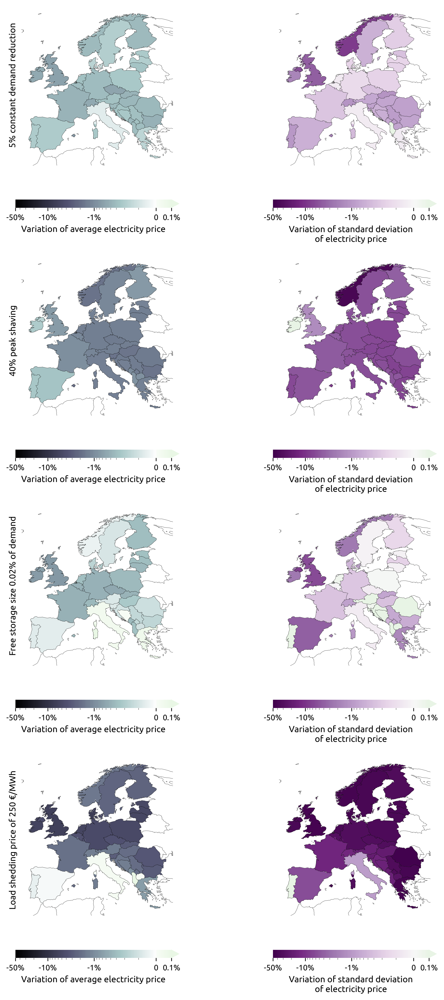

In [98]:
## Figure 5
import cartopy.crs as ccrs
import cartopy
import geopandas as gpd
from matplotlib.colors import TwoSlopeNorm, SymLogNorm
from matplotlib.ticker import FixedLocator, FixedFormatter, LogLocator,  MultipleLocator, FuncFormatter, NullFormatter, Locator
plt.rc('axes',edgecolor='None')

def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = matplotlib.colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap


# Load the colormaps
cmap1 = plt.get_cmap('bone')  ##cividis
cmap2 = plt.get_cmap('Greens') #viridis_r truncate_colormap(plt.get_cmap('viridis_r'), 0,0.5)
cmap3 = plt.get_cmap('viridis') #truncate_colormap(plt.get_cmap('viridis_r'), 0,0.5)
colors1 = cmap1(np.linspace(0, 1, 128))
colors2 = cmap2(np.linspace(0, 1, 128))
colors3 = cmap3(np.linspace(0, 1, 128))
combined_colors = np.vstack((colors1, colors2))
combined_colors2 = np.vstack((colors3, colors2))
combined_cmap = matplotlib.colors.LinearSegmentedColormap.from_list('PRGn_bwr', combined_colors)
combined_cmap= truncate_colormap(combined_cmap, 0,0.55)
combined_cmap2 = matplotlib.colors.LinearSegmentedColormap.from_list('PRGn_bwr', combined_colors2)
combined_cmap2= truncate_colormap(plt.get_cmap('PRGn'), 0,0.55)


ocean_camp = truncate_colormap(plt.get_cmap('ocean_r'), 0, 0.8)
PRGn_tr = truncate_colormap(plt.get_cmap('PRGn'), 0, 0.6)
bwr = truncate_colormap(plt.get_cmap('bwr'), 0, 0.6)
Rdylgn = truncate_colormap(plt.get_cmap('RdYlGn'), 0, 0.8)
twilight = truncate_colormap(plt.get_cmap('twilight_shifted'), 0, 0.6)

proj = ccrs.EqualEarth() #ccrs.PlateCarree() 

df_price_dm= pd.read_csv('csvs_read/df_price_dm.csv',index_col=0, header=[0,1], low_memory=False)
#df_tload= pd.read_csv('csvs_read/df_tload_dm.csv', index_col=0, header=[0,1], low_memory=False)
scenario= 'elec-p05'


df_price_dem= pd.read_csv('csvs_read/df_pice_pdem.csv',index_col=0, header=[0,1], low_memory=False)
#df_tload= pd.read_csv('csvs_read/df_tload_pdem.csv', index_col=0, header=[0,1], low_memory=False)
scenario= 'elec-p40'

df_price_sdem= pd.read_csv('csvs_read/df_pice_sdem_new.csv',index_col=0, header=[0,1], low_memory=False)
#df_tload= pd.read_csv('csvs_read/df_tload_sdem_new.csv', index_col=0, header=[0], low_memory=False)
scenario= 'elec-p0.02'

df_price_ldem= pd.read_csv('csvs_read/df_pice_ldem_new.csv',index_col=0, header=[0,1], low_memory=False)
#df_tload= pd.read_csv('csvs_read/df_tload_ldem_new.csv', index_col=0, header=[0,1], low_memory=False)
scenario = 'elec-p250'

fig, axs = plt.subplots(4,2, figsize=(10, 20), subplot_kw={"projection": proj}, dpi=300, sharex=True)
fig.subplots_adjust(hspace=0.1)
fig.subplots_adjust(wspace=0.1)

geodf = gpd.read_file('../resources/regions_onshore_elec_s370_37m.geojson').set_index("name")
geodf = geodf.to_crs(proj.proj4_init)
#s=pd.Series(n.generators.p_nom_max.filter(like='rooftop').groupby(n.generators.bus).sum().values
#            ,geodf.index).fillna(0)

## change in el. price and el demand
color_map = ocean_camp #'cividis_r'

scenarios = ['elec-p05', 'elec-p40', 'elec-p0.02', 'elec-p250']  
for i, df_price in enumerate([df_price_dm, df_price_dem, df_price_sdem, df_price_ldem]) : 
  scenario =scenarios[i]
  s=pd.Series(((df_price[scenario].mean()/df_price['elec-Base'].mean())-1).values*1, geodf.index)#*-1
  lim = max(abs(s.min()), abs(s.max()))
  #print(s.min())

  #tick_vals = [-0.1, -0.01, -0.005, 0, 0.005, 0.01, 0.1]
  tick_vals = [-.5,-0.1, -0.01, 0, 0.001, ]
  #vmin = min(tick_vals)
  #vmax = max(tick_vals)
  #norm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
  norm = SymLogNorm(linthresh=0.001, linscale=0.3, vmin=-.5, vmax=0.001, base=10)

  plot= geodf.plot(
        ax=axs[i,0],
        column=s,
        # transform=ccrs.PlateCarree(),
        cmap=combined_cmap,
        alpha=1,
        linewidths=0,
        #vmax=.01, #s.max(), #lim
        #vmin=-.1, #s.min(), #-lim,
        norm = norm, #matplotlib.colors.LogNorm(vmin=-0.001, vmax=10),
        legend=True,
       legend_kwds={"label": 'Variation of average electricity price', "shrink": 0.7, "extend": "max", 'orientation' : "horizontal"},     
    )

  cbar = plot.get_figure().get_axes()[-1]  # usually the last axis is the colorbar
  # Format colorbar labels as percentages with no scientific notation
  formatter = FuncFormatter(lambda x, pos: f"{x*100:.1f}%")
  cbar.set_xticks(tick_vals)
  #cbar.set_xticklabels([str(x) for x in tick_vals], fontsize=8)
  cbar.set_xticklabels(['-50%', '-10%', '-1%', '0', '0.1%'], fontsize=9)
  #cbar.xaxis.set_major_formatter(formatter)  # xaxis for horizontal legend
  cbar.xaxis.set_minor_locator(MinorSymLogLocator(0.001))
  cbar.tick_params(which='minor', color='gray',)

  s=pd.Series((1*(df_price[scenario].std()/df_price['elec-Base'].std())-1).values, geodf.index)#*-1
  lim = max(abs(s.min()), abs(s.max()))
  #print(s.min())
  tick_vals = [-.5,-0.1, -0.01,  0, 0.001, ]
  #vmin = min(tick_vals)
  #vmax = max(tick_vals)
  #norm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
  norm = SymLogNorm(linthresh=0.001, linscale=0.3, vmin=-.5, vmax=0.001, base=10)
    
  plot2=geodf.plot(
        ax=axs[i,1],
        column=s,
        # transform=ccrs.PlateCarree(),
        cmap=combined_cmap2,
        alpha=1,
        linewidths=0,
        #vmax=.05, #s.max(), #lim
        #vmin=-.1, #s.min(), #-lim,
        legend=True,
        norm = norm, #matplotlib.colors.LogNorm(vmin=-0.001, vmax=10),
       legend_kwds={"label": 'Variation of standard deviation\nof electricity price', "shrink": 0.7, "extend": "max", 'orientation' : "horizontal"},     
    )

  cbar = plot.get_figure().get_axes()[-1]  # usually the last axis is the colorbar
  # Format colorbar labels as percentages with no scientific notation
  formatter = FuncFormatter(lambda x, pos: f"{x*100:.1f}%")
  cbar.set_xticks(tick_vals)
  cbar.set_xticklabels(['-50%', '-10%', '-1%','0', '0.1%'], fontsize=9)
  #cbar.xaxis.set_major_formatter(formatter)  # xaxis for horizontal legend
  #cbar.xaxis.set_minor_locator(LogLocator(base=10.0, subs='auto', numticks=100))
  #cbar.xaxis.set_minor_formatter(NullFormatter())  # Hide minor tick labels
  cbar.xaxis.set_minor_locator(MinorSymLogLocator(0.001))
  cbar.tick_params(which='minor', color='gray',)

for ax in axs.flat:
  ax.add_feature(cartopy.feature.COASTLINE.with_scale("50m"), linewidth=0.2, zorder=2)
  ax.add_feature(cartopy.feature.BORDERS.with_scale("50m"), linewidth=0.2, zorder=2)

axs[0,0].text(0.17, 0.77, '5% constant demand reduction',
                         size=10, rotation=90,transform=fig.transFigure)
axs[1,0].text(0.17, 0.59, '40% peak shaving',
                         size=10, rotation=90,transform=fig.transFigure)
axs[2,0].text(0.17, 0.37, 'Free storage size 0.02% of demand',
                         size=10, rotation=90, transform=fig.transFigure)
axs[3,0].text(0.17, 0.17, 'Load shedding price of 250 €/MWh',
                         size=10, rotation=90, transform=fig.transFigure)

## Supplementary figure 18

Text(0.17, 0.17, 'Heat shedding price of 200 €/MWh')

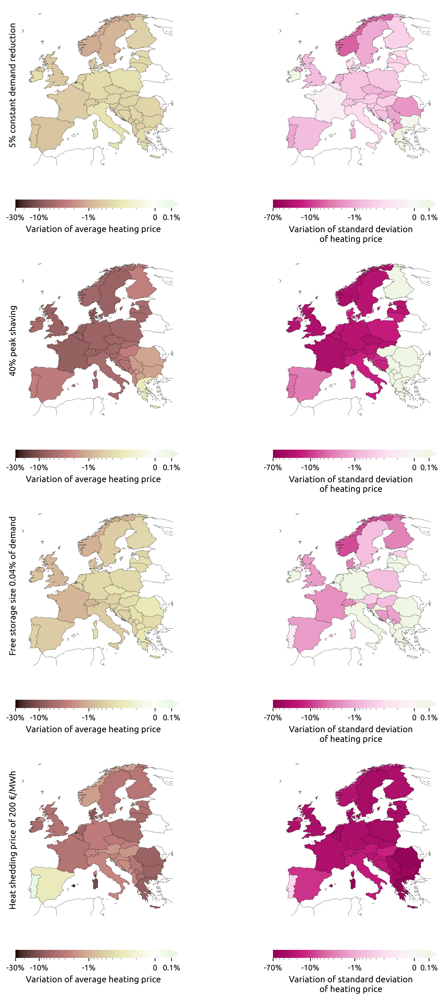

In [99]:

import cartopy.crs as ccrs
import cartopy
import geopandas as gpd
from matplotlib.colors import TwoSlopeNorm, SymLogNorm
from matplotlib.ticker import FixedLocator, FixedFormatter, LogLocator,  MultipleLocator, FuncFormatter, NullFormatter, Locator
plt.rc('axes',edgecolor='None')
plt.rcParams['axes.facecolor'] = 'white'

def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = matplotlib.colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap


# Load the colormaps
cmap1 = plt.get_cmap('pink')  ##cividis
cmap2 = plt.get_cmap('Greens') #viridis_r truncate_colormap(plt.get_cmap('viridis_r'), 0,0.5)
cmap3 = plt.get_cmap('viridis') #truncate_colormap(plt.get_cmap('viridis_r'), 0,0.5)
colors1 = cmap1(np.linspace(0, 1, 128))
colors2 = cmap2(np.linspace(0, 1, 128))
colors3 = cmap3(np.linspace(0, 1, 128))
combined_colors = np.vstack((colors1, colors2))
combined_colors2 = np.vstack((colors3, colors2))
combined_cmap = matplotlib.colors.LinearSegmentedColormap.from_list('PRGn_bwr', combined_colors)
combined_cmap= truncate_colormap(combined_cmap, 0,0.55)
combined_cmap2 = matplotlib.colors.LinearSegmentedColormap.from_list('PRGn_bwr', combined_colors2)
combined_cmap2= truncate_colormap(plt.get_cmap('PiYG'), 0,0.55)


ocean_camp = truncate_colormap(plt.get_cmap('ocean_r'), 0, 0.8)
PRGn_tr = truncate_colormap(plt.get_cmap('PRGn'), 0, 0.6)
bwr = truncate_colormap(plt.get_cmap('bwr'), 0, 0.6)
Rdylgn = truncate_colormap(plt.get_cmap('RdYlGn'), 0, 0.8)
twilight = truncate_colormap(plt.get_cmap('twilight_shifted'), 0, 0.6)

proj = ccrs.EqualEarth() #ccrs.PlateCarree() 

df_price_dm= pd.read_csv('csvs_read/df_price_dm.csv',index_col=0, header=[0,1], low_memory=False)
#df_tload= pd.read_csv('csvs_read/df_tload_dm.csv', index_col=0, header=[0,1], low_memory=False)
scenario= 'heat-p05'


df_price_dem= pd.read_csv('csvs_read/df_pice_pdem.csv',index_col=0, header=[0,1], low_memory=False)
#df_tload= pd.read_csv('csvs_read/df_tload_pdem.csv', index_col=0, header=[0,1], low_memory=False)
scenario= 'heat-p40'

df_price_sdem= pd.read_csv('csvs_read/df_pice_sdem_new.csv',index_col=0, header=[0,1], low_memory=False)
#df_tload= pd.read_csv('csvs_read/df_tload_sdem_new.csv', index_col=0, header=[0], low_memory=False)
scenario= 'elec-p0.04'

df_price_ldem= pd.read_csv('csvs_read/df_pice_ldem_new.csv',index_col=0, header=[0,1], low_memory=False)
#df_tload= pd.read_csv('csvs_read/df_tload_ldem_new.csv', index_col=0, header=[0,1], low_memory=False)
scenario = 'heat-p200'

fig, axs = plt.subplots(4,2, figsize=(10, 20), subplot_kw={"projection": proj}, dpi=300, sharex=True)
fig.subplots_adjust(hspace=0.1)
fig.subplots_adjust(wspace=0.1)

geodf = gpd.read_file('../resources/regions_onshore_elec_s370_37m.geojson').set_index("name")
geodf = geodf.to_crs(proj.proj4_init)
#s=pd.Series(n.generators.p_nom_max.filter(like='rooftop').groupby(n.generators.bus).sum().values
#            ,geodf.index).fillna(0)

## change in el. price and el demand
color_map = ocean_camp #'cividis_r'

scenarios = ['heat-p05', 'heat-p40', 'heat-p0.04', 'heat-p200']  
for i, df_price in enumerate([df_price_dm, df_price_dem, df_price_sdem, df_price_ldem]) : 
  scenario =scenarios[i]
  s=pd.Series(((df_price[scenario].mean()/df_price['heat-Base'].mean())-1).values*1, geodf.index)#*-1
  lim = max(abs(s.min()), abs(s.max()))
  #print(s.min()) 

  #tick_vals = [-0.1, -0.01, -0.005, 0, 0.005, 0.01, 0.1]
  tick_vals = [-0.3,-0.1, -0.01, 0, 0.001, ]
  #vmin = min(tick_vals)
  #vmax = max(tick_vals)
  #norm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
  norm = SymLogNorm(linthresh=0.001, linscale=0.3, vmin=-0.3, vmax=0.001, base=10)

  plot= geodf.plot(
        ax=axs[i,0],
        column=s,
        # transform=ccrs.PlateCarree(),
        cmap=combined_cmap,
        alpha=1,
        linewidths=0,
        #vmax=.01, #s.max(), #lim
        #vmin=-.1, #s.min(), #-lim,
        norm = norm, #matplotlib.colors.LogNorm(vmin=-0.001, vmax=10),
        legend=True,
       legend_kwds={"label": 'Variation of average heating price', "shrink": 0.7, "extend": "max", 'orientation' : "horizontal"},     
    )

  cbar = plot.get_figure().get_axes()[-1]  # usually the last axis is the colorbar
  # Format colorbar labels as percentages with no scientific notation
  formatter = FuncFormatter(lambda x, pos: f"{x*100:.1f}%")
  cbar.set_xticks(tick_vals)
  #cbar.set_xticklabels([str(x) for x in tick_vals], fontsize=8)
  cbar.set_xticklabels(['-30%', '-10%', '-1%', '0', '0.1%'], fontsize=9)
  #cbar.xaxis.set_major_formatter(formatter)  # xaxis for horizontal legend
  cbar.xaxis.set_minor_locator(MinorSymLogLocator(0.001))
  cbar.tick_params(which='minor', color='gray',)

  s=pd.Series((1*(df_price[scenario].std()/df_price['heat-Base'].std())-1).values, geodf.index)#*-1
  lim = max(abs(s.min()), abs(s.max()))
  #print(s.min()) 
  tick_vals = [-0.7,-0.1, -0.01,  0, 0.001, ]
  #vmin = min(tick_vals)
  #vmax = max(tick_vals)
  #norm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
  norm = SymLogNorm(linthresh=0.001, linscale=0.3, vmin= -0.7, vmax=0.001, base=10)
    
  plot2=geodf.plot(
        ax=axs[i,1],
        column=s,
        # transform=ccrs.PlateCarree(),
        cmap=combined_cmap2,
        alpha=1,
        linewidths=0,
        #vmax=.05, #s.max(), #lim
        #vmin=-.1, #s.min(), #-lim,
        legend=True,
        norm = norm, #matplotlib.colors.LogNorm(vmin=-0.001, vmax=10),
       legend_kwds={"label": 'Variation of standard deviation\nof heating price', "shrink": 0.7, "extend": "max", 'orientation' : "horizontal"},     
    )

  cbar = plot.get_figure().get_axes()[-1]  # usually the last axis is the colorbar
  # Format colorbar labels as percentages with no scientific notation
  formatter = FuncFormatter(lambda x, pos: f"{x*100:.1f}%")
  cbar.set_xticks(tick_vals)
  cbar.set_xticklabels(['-70%', '-10%', '-1%','0', '0.1%'], fontsize=9)
  #cbar.xaxis.set_major_formatter(formatter)  # xaxis for horizontal legend
  #cbar.xaxis.set_minor_locator(LogLocator(base=10.0, subs='auto', numticks=100))
  #cbar.xaxis.set_minor_formatter(NullFormatter())  # Hide minor tick labels
  cbar.xaxis.set_minor_locator(MinorSymLogLocator(0.001))
  cbar.tick_params(which='minor', color='gray',)

for ax in axs.flat:
  ax.add_feature(cartopy.feature.COASTLINE.with_scale("50m"), linewidth=0.2, zorder=2)
  ax.add_feature(cartopy.feature.BORDERS.with_scale("50m"), linewidth=0.2, zorder=2)

#'50% constant demand reduction'
#'40% peak shavinf'
# Free storage size 0.04% of demand'
# Heat shedding price of 200 €/MWh'
             
axs[0,0].text(0.17, 0.77, '5% constant demand reduction',
                         size=10, rotation=90,transform=fig.transFigure)
axs[1,0].text(0.17, 0.59, '40% peak shaving',
                         size=10, rotation=90,transform=fig.transFigure)
axs[2,0].text(0.17, 0.37, 'Free storage size 0.04% of demand',
                         size=10, rotation=90, transform=fig.transFigure)
axs[3,0].text(0.17, 0.17, 'Heat shedding price of 200 €/MWh',
                         size=10, rotation=90, transform=fig.transFigure)

## Supplementary Figure 17.a

scenario
elec-p05   -0.345178
elec-p10   -0.725483
elec-p20   -1.520491
elec-p30   -2.320119
elec-p40   -3.020502
dtype: float64
scenario
heat-p05   -0.427702
heat-p10   -1.025810
heat-p20   -2.582074
heat-p30   -4.173474
heat-p40   -6.244936
dtype: float64


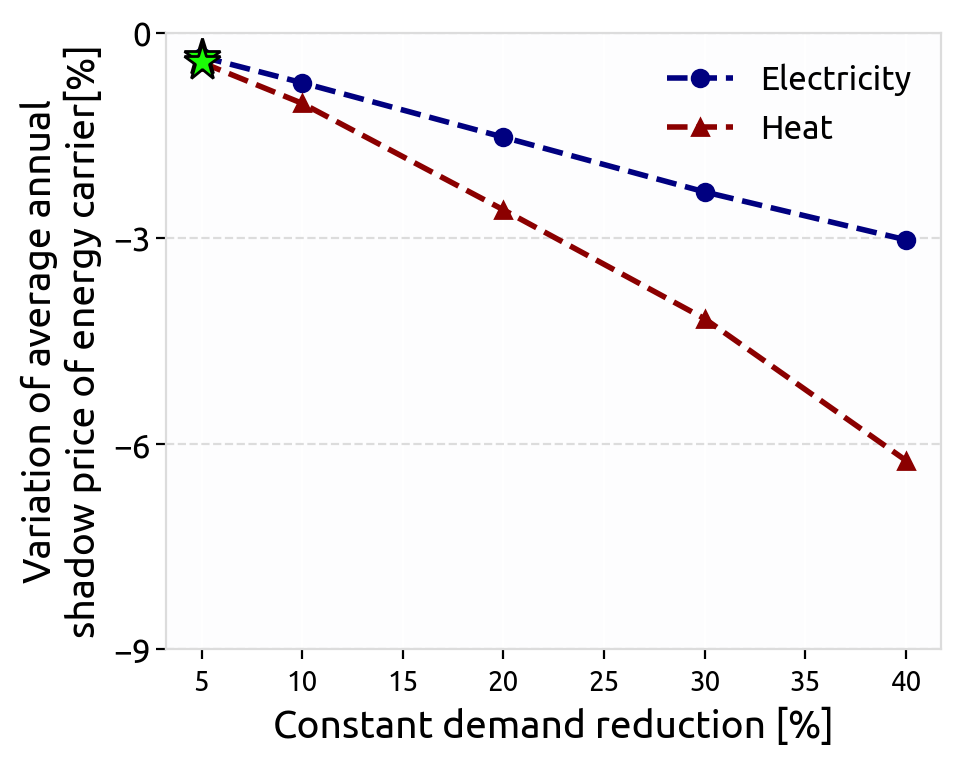

In [70]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['axes.facecolor'] = '#fdfdfe'
plt.rc('axes',edgecolor='gainsboro')

fig, axs = plt.subplots(figsize=(5,4), sharey=True, )
index= [i for i in range(7)]


#index= [0]+[float(i.split('p')[1]) for i in main_scen[scenario][0]] ##TODO: fix the scenario

#for conswcutive: costs[[i.format(main_scen[i][0][1]) for i in main_scen.keys()]].sum(),
markers = ['o','^','d','<','X','s','>','p']

for i, sector in enumerate(['elec', 'heat']):
     to_select= list(set([i for i in df_price.columns.get_level_values(0) if sector in i and 'Base' not in i]))
     to_plot= ((df_price[to_select].mean().unstack().mean(axis=1)/df_price[sector+'-Base'].mean().mean())-1)*100
     to_plot=to_plot.sort_index()
     print(to_plot)
     index= [float(i.split('p')[1]) for i in to_plot.index]
     label= sector_long_names[sector]
     axs.plot(index,  to_plot,#*-1,
                #color= 'k', #tech_colors['solar'],
                linestyle='--',
                linewidth = 2,
                marker=markers[i],
                markersize=6,
                zorder=3,
                label= label, #+ ' demand reduction',
                color= sector_colors[label]) 
     axs.plot(5,  to_plot[sector+'-p05'],#*-1,
                marker='*',
                markersize=14,
                zorder=4,
                markerfacecolor= '#1bfc06',
                markeredgecolor= 'k',
                 )         

#xlabels = [float(i.split('p')[1]) for i in main_scen[scenario][0]]
#axs.set_xticks((index))    
#axs.set_xticklabels(xlabels,fontsize=12, rotation=45,ha='right', rotation_mode='anchor')
axs.set_ylabel('Variation of average annual\nshadow price of energy carrier[%]', fontsize=14)    
axs.set_xlabel('Constant demand reduction [%]', fontsize=14)    
axs.grid(axis = 'y' , color='gainsboro', zorder=0, linestyle='dashed')
axs.tick_params(axis='y', labelsize=12, pad=2,)
#axs.set_yticks(np.arange(0,20.1,5))    

axs.set_yticks([0,-3,-6,-9])    
axs.set_ylim((-9,0))    

axs.legend(
           loc='best',
           #bbox_to_anchor=(1.6, 0.5),ncol=1 , 
           fontsize=12, frameon=False)

## Supplementary Figure 20

In [10]:
rename={'battery':'Battery storage','battery charger':'Battery storage','battery discharger':'Battery storage',
                          'home battery':'Home battery storage','home battery charger':'Home battery storage','home battery discharger':'Home battery storage',                                                       
                          'offwind':'Offshore wind', 'offwind-ac':'Offshore wind','offwind-dc':'Offshore wind', 'onwind':'Onshore wind',
                          'AC':'Transmission lines'  , 'DC':'Transmission lines','ror': 'Run of river',
                          'hydro':'Hydroelectricity' , 'nuclear':'Nuclear','uranium':'Nuclear',
                          'solar':'Solar utility', 'solar rooftop':'Solar rooftop',
                          'electricity distribution grid' : 'Electricity distribution grid',
                           'PHS' : 'Pumped hydro storage', 'H2':'H2 storage',
                           'SMR':'Power to gas'  , 'SMR CC':'Power to gas','oil': 'Oil to power/heat',
                           'Fischer-Tropsch':'Power to liquid', 'methanolisation':'Power to liquid',
                           'Sabatier':'Power to gas', 'helmeth':'Power to gas', 'coal' : 'Coal', 'lignite' :'Coal',
                            "solar-delta": "Solar-delta",'Li ion':'EV battery',
                          }

In [46]:
iso2name={'AT':'Austria',
          'BE':'Belgium',
          'BG':'Bulgaria',
          'CH':'Switzerland',
          'CZ':'Czechia',
          'DE':'Germany',
          'DK':'Denmark',
          'EE':'Estonia',
          'ES':'Spain',
          'FI':'Finland',
          'FR':'France',
          'GB':'UK',
          'GR':'Greece',
          'HR':'Croatia',
          'HU':'Hungary',
          'IT':'Italy',
          'LT':'Lithuania',
          'LU':'Luxembourg',
          'LV':'Latvia',
          'NO':'Norway',
          'PL':'Poland',
          'PT':'Portugal',
          'RO':'Romania',
          'SE':'Sweden',
          'SI':'Slovenia',
          'SK':'Slovakia',
          'IE':'Ireland',
          'NL':'Netherlands',
          'ME':'Montenegro',
          'AL':'Albania',
          'BA':'Bosnia & Herz.',
          'MK':'N. Macedonia',
          'RS':'Serbia',}

In [15]:
n=pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc')

INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [28]:
## Change the network names manually to get parts a, b, c, and d of the figure
main_scen = {'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc': 
  'Base',
# 'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIelecIp40_2050.nc': 
 #'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemIelecIp50_2050.nc': 
 #'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemIelecIp0.1-lowv_2050.nc': 
 'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemIelecIp200-lowtol_2050.nc': 
  'Base w Equity',
}

In [ ]:
## the final dataframe has some zero rows for transmission lines, H2 pipelines, EU methanl, co2 atmsphere (store)
## run of river is also zero in later years

label= 'capital+marginal'
countries=set([i[:2] for i in n.buses.index if n.buses.carrier[i]=='AC'])

iterables = [main_scen.values(), countries]

for i, scenario in enumerate(main_scen.keys()):
    n=pypsa.Network(scenario)
    nodal_costs=pd.DataFrame({})
    
    assign_carriers(n)
    assign_locations(n)
    df= calculate_nodal_costs(n, label, nodal_costs)
    df=df.rename(rename, level=3)
    for ix in df.index.get_level_values(3) :   
                if 'resistive heater' in ix or 'heat pump' in ix :
                   df =df.rename(index={ix : 'Power to heat',})
                if  any(w in ix for w in ['gas', 'OCGT', 'CCGT'])  :
                   df =df.rename(index={ix:'Gas to power/heat',})
                if 'biomass' in ix :df =df.rename(index={ix:'Biomass',})
                if 'biogas' in ix :df =df.rename(index={ix:'Biogas',})
                if 'oil' in ix :df =df.rename(index={ix:'Oil to power/heat',})
                if 'solar thermal' in ix :df =df.rename(index={ix:'Solar thermal',})
                if 'water tank' in ix :df =df.rename(index={ix:'Heat storage',})
                #if 'biogas' in ix :df.rename(index={ix:'Biomass',})
                if 'solar-hsat' in ix :df =df.rename(index={ix:'Solar-HSAT',})
                if 'solar-inv' in ix :df =df.rename(index={ix:'Solar utility',})
                       
    
    if i==0 : df_countries_cost= pd.DataFrame(index=list(set(df.index.get_level_values(3))),
                               columns=pd.MultiIndex.from_product(iterables, names=["scenario", "country"]))
    for j,country in enumerate(countries):                
      df_temp=df[df.index.get_level_values(2).str.contains(country)]

      df_countries_cost.loc[:, (main_scen[scenario],country)] = df_temp.groupby(df_temp.index.get_level_values(3)).sum()[label]         



In [17]:
plt.rc('axes',edgecolor='gainsboro')

plt.rcParams['axes.facecolor'] = 'whitesmoke'
plt.rcParams['figure.facecolor'] = 'white'

plt.rcParams.update({"axes.grid" : True, "grid.color" :"white" , "grid.linestyle":"dashed"})

/tmp/ipykernel_32284/1771183419.py:70: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs.set_xticklabels(xlabels,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')


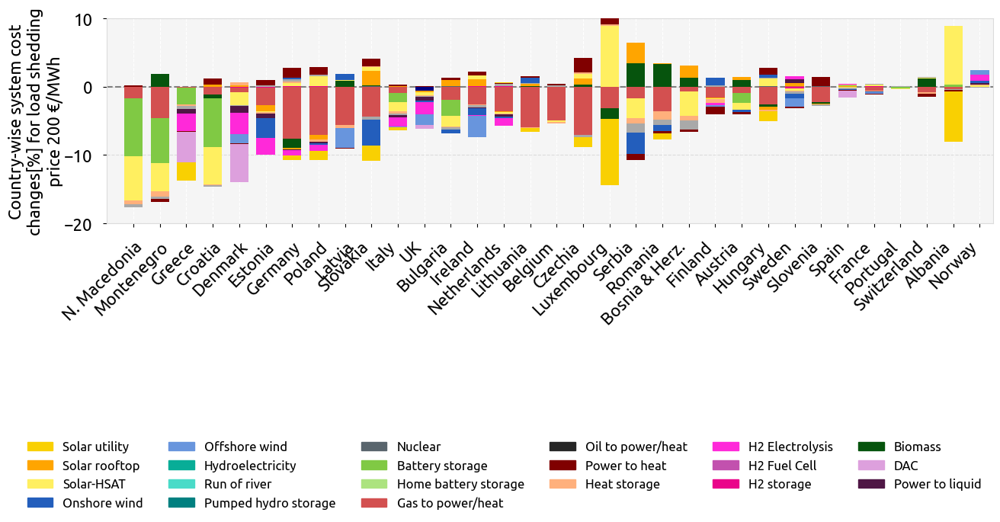

In [30]:
fig, axs = plt.subplots( figsize=(15,3.5), sharey=True)


bar_width=0.7
axs.grid(axis = 'y',color='gainsboro', zorder=0)


index=np.arange(len(df_countries_cost['Base'].columns) )
#country_order_ = list(country_order)[::-1]
total_cost_differece = (df_countries_cost['Base w Equity'].sum()-
                              df_countries_cost['Base'].sum())

total_cost_differece_percentage = (df_countries_cost['Base w Equity'].sum()-
                              df_countries_cost['Base'].sum())/ df_countries_cost['Base'].sum()

country_order_ = list(total_cost_differece_percentage.sort_values().index)

for i,country in enumerate(df_countries_cost['Base'].columns):
            bottom_p=0
            bottom_n=0 
            
            bottom_p_2=0
            bottom_n_2=0
            index_country=  (country_order_).index(country)
            
            difference=(100*total_cost_differece_percentage.loc[country]*(df_countries_cost['Base w Equity'][country]-
                              df_countries_cost['Base'][country])/total_cost_differece.loc[country])
            
            
            for color, component in enumerate(list(difference.index)[::-1]):#df_countries_cost.index):

                 if (abs(difference.sum())<110) :

                         if difference.loc[component] > 0 : 
                             axs.bar(index_country, difference.loc[component]
                                   , bar_width, 
                                   bottom=bottom_p_2,
                                   color=tech_colors[component], zorder=3)
                             bottom_p_2+=difference.loc[component]
                         elif difference.loc[component] < 0 :
                             #print(bottom_n)
                             axs.bar(index_country, difference.loc[component]
                                   , bar_width, 
                                   bottom=bottom_n_2,
                                   color=tech_colors[component], zorder=3)
                             bottom_n_2+=difference.loc[component]
                
            
legend_manual=[]
labels= [ 'Solar utility','Solar rooftop','Solar-HSAT', 
     'Onshore wind', 'Offshore wind', 'Hydroelectricity', 'Run of river', 'Pumped hydro storage',   
           'Nuclear','Battery storage','Home battery storage', 
         'Gas to power/heat', 'Oil to power/heat', 'Power to heat', 'Heat storage',
      'H2 Electrolysis', 'H2 Fuel Cell',   'H2 storage',  'Biomass',  
      'DAC', 'Power to liquid',
      # 'Transmission lines', 'Electricity distribution grid', 
     ]
#import textwrap
#[(' '.join(s.split(' ')[:3])+'\n'+' '.join(s.split(' ')[3:])) if s.count(' ')>2 else s for s in labels]
    
for key in (labels) : #(sorted(list(df_countries_cost.index)[::-1])): #
    legend_manual.append(mpatches.Patch(color=tech_colors[key.replace('\n',' ')], label=key))
plt.legend(handles=legend_manual,loc='upper right',  bbox_to_anchor=(1, -1),ncol=6,
           fontsize=12,frameon=False)
        
xlabels = [iso2name[i] for i in (country_order_)]        
#ylabels = [i for i in df_countries_cost['Base'].columns]
axs.set_xticklabels(xlabels,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')
axs.set_xticks((index))    
axs.set_xlim([-1,32.5])    

axs.tick_params(axis='x', labelsize=16, pad=10,)
#axs.set_yticks(np.arange(-25, 12.5, 5),fontsize=18, ) 
#axs.set_ylim([-25, 7.5])
#axs.set_yticks([-5,0,5],fontsize=18, ) 
#axs.set_ylim([-6, 5])
axs.set_yticks([-20,-10,0,10],fontsize=18, ) 
axs.set_ylim([-20, 10])
axs.tick_params(axis='y', labelsize=16, pad=10,)
#axs.set_ylabel('Country-wise system cost\nchanges[%] for 40% demand\ndown-scaling',fontsize=16, labelpad=1) 
#axs.set_ylabel('Country-wise system cost\nchanges[%] for 50% peak\nshaving',fontsize=16, labelpad=1) 
#axs.set_ylabel('Country-wise system cost\nchanges[%] for free storage\n0.1% of demand',fontsize=16, labelpad=1) 
axs.set_ylabel('Country-wise system cost\nchanges[%] for load shedding\nprice 200 €/MWh',fontsize=16, labelpad=1) 
axs.axhline(y=0, color='grey', linestyle='--')

# Supplementary Figure 19
## Change the network names manually to get parts a, b, c, and d of the figure


In [50]:
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'

plt.rcParams.update({"axes.grid" : True, "grid.color" :"white" , "grid.linestyle":"solid"})

n1= pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc')
#n2= pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIelecIp40_2050.nc')
#n2= pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemIelecIp50_2050.nc')
#n2= pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemIelecIp0.1-lowv_2050.nc')
n2= pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemIelecIp40_2050.nc') 

label='capital'
for n in [n1, n2]:    
    assign_carriers(n)
    assign_locations(n)
nodal_costs=pd.DataFrame({})    
df1= calculate_nodal_costs(n1, label, nodal_costs)
nodal_costs=pd.DataFrame({})
df2= calculate_nodal_costs(n2, label, nodal_costs)



INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores
INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemIelecIp40_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores


In [51]:
tofind= list((n.generators.bus.map(n.buses.location)).index)
mapper =n.generators.bus.map(n.buses.location)

df_temp1 = df1.groupby(df1.index.get_level_values(2)).sum()
df_temp1['node']= df_temp1.apply(lambda x: x.name, axis=1) 
for idx in df_temp1.index:
   try:
    df_temp1.loc[idx, 'node'] = mapper[([i for i in tofind if idx in i][0])]
   except:
     pass
df_temp1 = df_temp1.drop(labels=['gas pipeline','process','solid',''])  ##empty is for EU expenses,
                               ##so we won't see kerosene for example in country-wise results
df_temp1= df_temp1.groupby(df_temp1['node']).sum()
df_temp1 = df_temp1.drop(labels=[i for i in df_temp1.index if 'EU' in i])        

In [52]:
df_temp2 = df2.groupby(df2.index.get_level_values(2)).sum()
df_temp2['node']= df_temp2.apply(lambda x: x.name, axis=1) 
for idx in df_temp2.index:
   try:
    df_temp2.loc[idx, 'node'] = mapper[([i for i in tofind if idx in i][0])]
   except:
     pass
df_temp2 = df_temp2.drop(labels=['gas pipeline','process','solid',''])  ##empty is for EU expenses,
                               ##so we won't see kerosene for example in country-wise results
df_temp2= df_temp2.groupby(df_temp2['node']).sum()
df_temp2 = df_temp2.drop(labels=[i for i in df_temp2.index if 'EU' in i])      

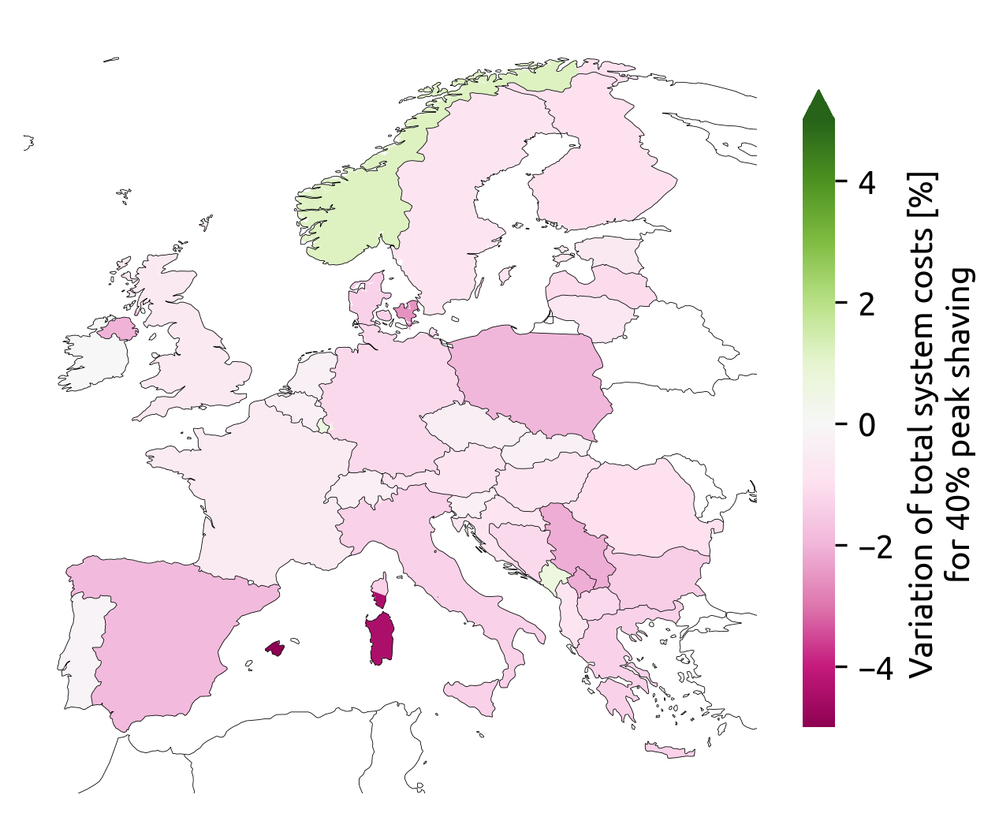

In [53]:
## elec price reduction : would it make sense to weigh it bu load reduction in each country?
## like is it simply related to the amount of reduced load?

import cartopy.crs as ccrs
import cartopy
import geopandas as gpd
plt.rc('axes',edgecolor='None')

def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = matplotlib.colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

ocean_camp = truncate_colormap(plt.get_cmap('ocean_r'), 0, 0.8)
proj = ccrs.EqualEarth() #ccrs.PlateCarree() 

fig, axs = plt.subplots(figsize=(5, 5), subplot_kw={"projection": proj}, dpi=300)
geodf = gpd.read_file('../resources/regions_onshore_elec_s370_37m.geojson').set_index("name")
geodf = geodf.to_crs(proj.proj4_init)
color_map = ocean_camp #'cividis_r'


s=pd.Series(((df_temp2-df_temp1)/df_temp1).squeeze().values*100, geodf.index)
lim = max(abs(s.min()), abs(s.max()))

geodf.plot(
        ax=axs,
        column=s,
        # transform=ccrs.PlateCarree(),
        cmap='PiYG',
        alpha=1,
        linewidths=0,
        vmax=5, #-1*s.min(), #lim
        vmin=-5, #s.min(), #-lim,
        legend=True,
        legend_kwds={"label": 'Variation of total system costs [%]\nfor 40% peak shaving', "shrink": 0.7, "extend": "max"},     
        #legend_kwds={"label": 'Reduction in total costs [%]\nfor free storage 0.1% of demand', "shrink": 0.7, "extend": "max"},     
        #legend_kwds={"label": 'Reduction in total costs [%]\nfor 40% constant reduction', "shrink": 0.7, "extend": "max"},     
    )

axs.add_feature(cartopy.feature.COASTLINE.with_scale("50m"), linewidth=0.2, zorder=2)
axs.add_feature(cartopy.feature.BORDERS.with_scale("50m"), linewidth=0.2, zorder=2)

## Peak shaving results

## Supplementary Figure 12.a

INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores


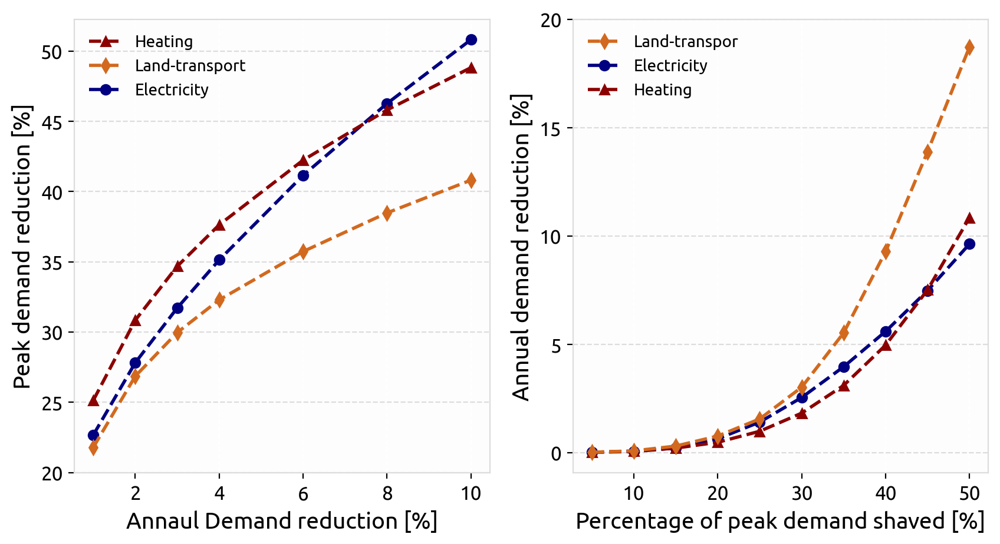

In [56]:
import copy
fig, axs = plt.subplots(1,2,figsize=(10,5), sharey=False,dpi=200)
plt.rcParams['axes.facecolor'] =  '#fdfdfe' #'#fdfdfe'#'whitesmoke'

n= pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc')

load_change_factors = [0.01, 0.02,0.03, 0.04, 0.06, 0.08, 0.1]  ##p10 is shaving peak until total reduction equals 10% of demand
peak_change_factors = [0.05, 0.1 ,0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5,]# 0.6,0.7,0.8,0.9]  ##p10 is shaving peak until total reduction equals 10% of demand

df_peak_ratios=pd.DataFrame(index =[i for i in ['elec', 'heat', 'tran']], columns = load_change_factors)
df_peak2dem_ratios=pd.DataFrame(index =[i for i in ['elec', 'heat', 'tran']], columns = peak_change_factors)

def find_x_for_sum(df, C, tolerance=1e-9):
    low, high = df.min(), df.max() # Search range for x
    while high - low > tolerance:
        mid = (low + high) / 2
        df_temp=copy.deepcopy(df)
        df_temp[df_temp>mid] = mid
        if df_temp.sum() > C:
            high = mid  # Narrow to lower half
        else:
            low = mid  # Narrow to upper half
    return (low + high) / 2

for j, sector in enumerate(['elec', 'heat', 'tran']) :
    sector_loads =  carrier_names[sector]
    load_i = n.loads.index[n.loads.carrier.isin(sector_loads)]
    df = n.loads_t.p_set.loc[:, [i for i in load_i if i in n.loads_t.p_set.columns]]

    for load_change_factor in load_change_factors:
        C = df.sum().sum()*(1-load_change_factor) # equal to constant demand reduction
        peak = find_x_for_sum(df.sum(axis=1), C)
        peak_change_factor= (peak - df.sum(axis =1).min())/(df.sum(axis =1).max()-df.sum(axis =1).min())
        df_peak_ratios.loc[sector, load_change_factor] =  (1-peak_change_factor)*100

    df = n.loads_t.p_set.loc[:, [i for i in load_i if i in n.loads_t.p_set.columns]]        
    for load_change_factor in peak_change_factors:
        peak= df.sum(axis =1).min() + (df.sum(axis =1).max()-df.sum(axis =1).min())*(1-load_change_factor)
        temp=df.sum(axis=1)
        temp[temp>peak] =peak

        df_peak2dem_ratios.loc[sector, load_change_factor] =  100* ( 1-((temp.sum())/(df.sum().sum()))  )    
    
    axs[0].plot ([k*100 for k in load_change_factors], df_peak_ratios.loc[sector, :], 
               linestyle='--',
                linewidth = 2,
                marker=markers[sector],
                markersize=6,
                zorder=3,
                label= sector,
                color= sector_colors_[sector])
        
    axs[1].plot ([k*100 for k in peak_change_factors], df_peak2dem_ratios.loc[sector, :], 
               linestyle='--',
                linewidth = 2,
                marker=markers[sector],
                markersize=6,
                zorder=3,
                label= sector,
                color= sector_colors_[sector])
    
axs[1].set_ylabel('Annual demand reduction [%]', fontsize=14)    
axs[1].set_xlabel('Percentage of peak demand shaved [%]', fontsize=14)        
axs[1].set_yticks(np.arange(0,20.1,5))    
axs[1].grid(axis = 'y' , color='gainsboro', zorder=0) 

    
axs[0].set_ylabel('Peak demand reduction [%]', fontsize=14)        
axs[0].set_xlabel('Annaul Demand reduction [%]', fontsize=14)        
axs[0].set_yticks(np.arange(20,51,5))    
axs[0].grid(axis = 'y' , color='gainsboro', zorder=0) 

for ax in axs.flat:
    ax.tick_params(which='major', axis='both', labelsize=12)

handles, labels = plt.gca().get_legend_handles_labels()
order = [1,2,0]
axs[0].legend([handles[idx] for idx in order],['Heating', 'Land-transport','Electricity'],
           loc='best',
          # bbox_to_anchor=(1.4, 0.5),ncol=1 , 
           fontsize=10, frameon=False)

order = [2,0,1]
axs[1].legend([handles[idx] for idx in order],['Land-transpor', 'Electricity','Heating'],
           loc='best',
          # bbox_to_anchor=(1.4, 0.5),ncol=1 , 
           fontsize=10, frameon=False)


## Supplementary figure 17.b

In [ ]:

n= pypsa.Network('main_runs/prenetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc')

label= 'capital+marginal'
countries=([i for i in n.buses.index if n.buses.carrier[i]=='AC'])  #[:2] 
scenarios = [i+'-'+j for i in ['elec', 'heat', 'tran'] for j in
             ['Base','p05', 'p10','p15' ,'p20', 'p25','p30','p35', 'p40','p45', 'p50']]

##p5
iterables = [scenarios,
             countries]
df_price= pd.DataFrame(index=n.snapshots,
            columns=pd.MultiIndex.from_product(iterables, names=["scenario", "country"]))

df_tload= pd.DataFrame(index=list(countries),
                columns=scenarios)

df_price= df_price.reindex(sorted(df_price.columns), axis=1)

sector_bus_carriers= {'elec' : 'low voltage', # 'low voltage',
                     'heat' :  'heat',
                     'tran' :  'Li ion' }

for scen in main_scen.keys():
 if  not any(i in scen for i in ['agri', 'ship', 'avia','indu']):  
  for  reduction in main_scen[scen][0]:
    #print(scen, reduction)    
    scenario=scen.format(str(reduction))
    n=pypsa.Network(scenario)
    nodal_costs=pd.DataFrame({})
    
    scen_name = 'Base' if main_scen[scen][1]=='Base' else scenario.split('I')[2] +'-'+reduction[:3]
    

    if  scen_name != 'Base' : ##not for agri, ship, avia
       load_carrier = scenario.split('I')[2] 
       sector_bus_carrier = sector_bus_carriers[load_carrier]
       sector_loads =  carrier_names[load_carrier]
       load_i = n.loads.index[n.loads.carrier.isin(sector_loads)]
       df_tload[scen_name]= pd.Series(n.loads_t.p_set.loc[:, [i for i in load_i if i in 
                                    n.loads_t.p_set.columns]].groupby([n.loads.bus.map(n.buses.location)],
                                                     axis=1).sum().sum(axis=0).values, index=(countries))
       df=(n.loads_t.p.loc[:,load_i]*
        n.buses_t.marginal_price[[i for i in n.buses.index if sector_bus_carrier in n.buses.carrier[i] ]].values) /(
              n.loads_t.p.loc[:,load_i].sum())
       df_price[scen_name]=df.groupby([n.loads.bus.map(n.buses.location)], axis=1).sum().sort_index() # df.groupby(df['country']).mean().T.sort_index() 

    else :
      for load_carrier in ['elec', 'heat', 'tran']  :
       scen_name= load_carrier+'-Base'
       sector_bus_carrier = sector_bus_carriers[load_carrier]
       sector_loads =  carrier_names[load_carrier]
       load_i = n.loads.index[n.loads.carrier.isin(sector_loads)]
       df_tload[scen_name]= pd.Series(n.loads_t.p_set.loc[:, [i for i in load_i if i in 
                                    n.loads_t.p_set.columns]].groupby([n.loads.bus.map(n.buses.location)],
                                                     axis=1).sum().sum(axis=0).values, index=(countries))  
    
       #print(scenario, scen_name,load_carrier, sector_bus_carrier,sector_loads, load_i) 
       df=(n.loads_t.p.loc[:,load_i]*
        n.buses_t.marginal_price[[i for i in n.buses.index if sector_bus_carrier in n.buses.carrier[i] ]].values) /(
              n.loads_t.p.loc[:,load_i].sum())
       df_price[scen_name]=df.groupby([n.loads.bus.map(n.buses.location)], axis=1).sum().sort_index() # df.groupby(df['country']).mean().T.sort_index() 

    
    

In [72]:
#df_price.to_csv('csvs/df_pice_pdem.csv')
#df_tload.to_csv('csvs/df_tload_pdem.csv')

df_price= pd.read_csv('csvs_read/df_pice_pdem.csv',index_col=0, header=[0,1], low_memory=False)
df_tload= pd.read_csv('csvs_read/df_tload_pdem.csv', index_col=0, header=[0,1], low_memory=False)

In [71]:
for i, sector in enumerate(['elec', 'heat']):
     to_select= list(set([i for i in df_price.columns.get_level_values(0) if sector in i and 'Base' not in i]))
     for scenario in to_select:
        s=((100*(df_price[scenario].std()/df_price[sector+'-Base'].std())-100))*-1
        print(scenario, '   ', s.mean())

elec-p20     2.4051664159456356
elec-p10     0.35938087827672943
elec-p15     1.1945479560403849
elec-p05     0.026624355588784343
elec-p30     4.449055675803317
elec-p50     7.980656572956586
elec-p40     6.3100402364360555
elec-p35     5.335472516482902
elec-p45     7.219510819476187
elec-p25     3.376865985427768
heat-p10     1.658386903954471
heat-p20     4.424992690213201
heat-p50     19.458575842194985
heat-p25     6.076993028909295
heat-p40     12.471740416369737
heat-p45     15.797330649720644
heat-p15     2.904329700594287
heat-p35     10.300267720775249
heat-p30     8.016964393827482
heat-p05     0.5890739145164094


scenario
elec-p05   -0.008200
elec-p10   -0.066727
elec-p15   -0.226319
elec-p20   -0.493203
elec-p25   -0.720368
elec-p30   -0.911214
elec-p35   -1.064537
elec-p40   -1.221770
elec-p45   -1.425096
elec-p50   -1.643217
dtype: float64
scenario
heat-p05   -0.038989
heat-p10   -0.154448
heat-p15   -0.375008
heat-p20   -0.738621
heat-p25   -1.306957
heat-p30   -2.106958
heat-p35   -3.182984
heat-p40   -4.576638
heat-p45   -6.393733
heat-p50   -8.518264
dtype: float64


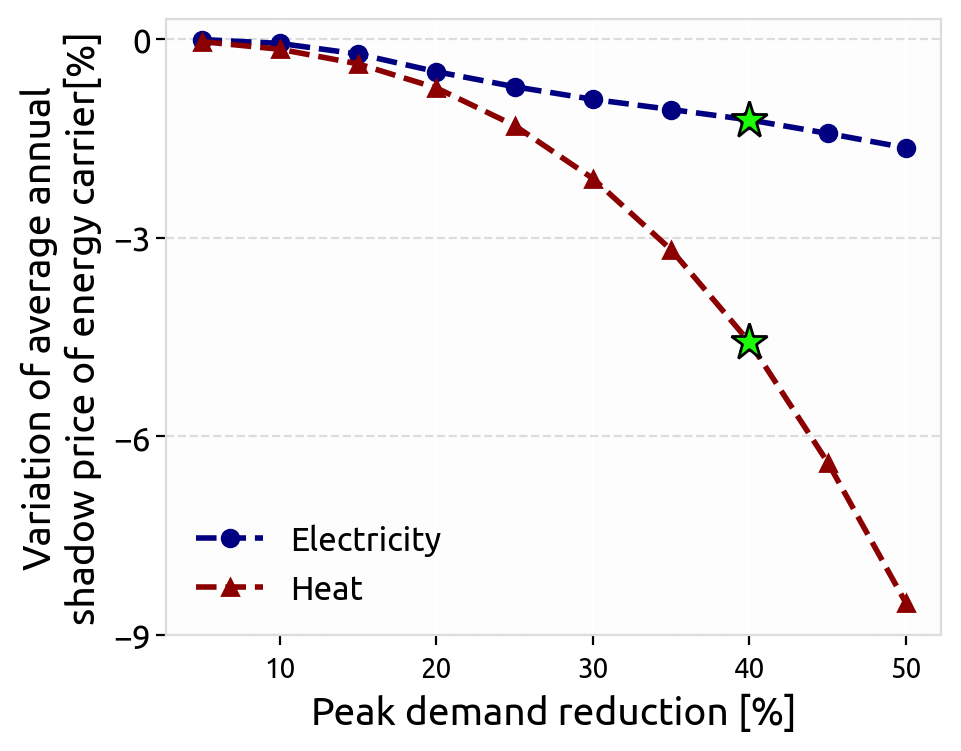

In [75]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['axes.facecolor'] = '#fdfdfe'
plt.rc('axes',edgecolor='gainsboro')

fig, axs = plt.subplots(figsize=(5,4), sharey=True, )
index= [i for i in range(7)]


#index= [0]+[float(i.split('p')[1]) for i in main_scen[scenario][0]] ##TODO: fix the scenario

#for conswcutive: costs[[i.format(main_scen[i][0][1]) for i in main_scen.keys()]].sum(),
markers = ['o','^','d','<','X','s','>','p']

for i, sector in enumerate(['elec', 'heat']):
     to_select= list(set([i for i in df_price.columns.get_level_values(0) if sector in i and 'Base' not in i]))
     to_plot= ((df_price[to_select].mean().unstack().mean(axis=1)/df_price[sector+'-Base'].mean().mean())-1)*100
     to_plot=to_plot.sort_index()
     print(to_plot)
     index= [float(i.split('p')[1]) for i in to_plot.index]
     label= sector_long_names[sector]
     axs.plot(index,  to_plot,#*-1,
                #color= 'k', #tech_colors['solar'],
                linestyle='--',
                linewidth = 2,
                marker=markers[i],
                markersize=6,
                zorder=3,
                label= label, #+ ' demand reduction',
                color= sector_colors[label]) 
        
     axs.plot(40,  to_plot[sector+'-p40'],#*-1,
                marker='*',
                markersize=14,
                zorder=4,
                markerfacecolor= '#1bfc06',
                markeredgecolor= 'k',
                 )            

#xlabels = [float(i.split('p')[1]) for i in main_scen[scenario][0]]
#axs.set_xticks((index))    
#axs.set_xticklabels(xlabels,fontsize=12, rotation=45,ha='right', rotation_mode='anchor')
axs.set_ylabel('Variation of average annual\nshadow price of energy carrier[%]', fontsize=14)    
axs.set_xlabel('Peak demand reduction [%]', fontsize=14)    
axs.grid(axis = 'y' , color='gainsboro', zorder=0, linestyle='dashed')
axs.tick_params(axis='y', labelsize=12, pad=2,)
#axs.set_yticks(np.arange(0,20.1,5))    

axs.set_yticks([0,-3,-6,-9])    
axs.set_ylim((-9,0.3))    

axs.legend(
           loc='best',
           #bbox_to_anchor=(1.6, 0.5),ncol=1 , 
           fontsize=12, frameon=False)

## Free storage results

In [10]:
## TODO: rerun elec0.01 with low tolerance
main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-nov2g_2050.nc':[[''],'Land-transport Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemIelecI{}_2050.nc':[['p0.02','p0.04','p0.06','p0.08','p0.1','p0.2','p0.3','p0.4','p0.5','p0.6','p0.7','p0.8','p0.9','p1.0'],'Electricity demand reduction' ] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemIheatI{}_2050.nc':[['p0.02','p0.04','p0.06','p0.08','p0.1','p0.2','p0.3','p0.4','p0.5','p0.6','p0.7','p0.8','p0.9','p1.0'],'Heat demand reduction'] ,
     'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemItranI{}_2050.nc':[['p0.02','p0.04','p0.06','p0.08','p0.1','p0.2','p0.3','p0.4','p0.5','p0.6','p0.7','p0.8','p0.9','p1.0'],'Land-transport demand reduction']  ,
}

In [26]:
df_share_shift= pd.read_csv('csvs_read/df_share_shift.csv', index_col=0)
df_share_shift

,share of demand shifted
elec-Base,NaN
elec-p0.02,0.044372
elec-p0.04,0.083345
elec-p0.06,0.118534
elec-p0.08,0.152400
elec-p0.1,0.184040
heat-Base,NaN
heat-p0.02,0.033439
heat-p0.04,0.059305
heat-p0.06,0.079957


## Supplementary Figure 17.c

In [ ]:

main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-nov2g_2050.nc':[[''],'Land-transport Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemIelecI{}_2050.nc':[['p0.02-lowv','p0.04-lowv','p0.06-lowv','p0.08-lowv','p0.1-lowv'], 'Electricity demand reduction' ], #'p0.02','p0.04','p0.06','p0.08','p0.1'],'Electricity demand reduction' ] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemIheatI{}_2050.nc':[['p0.02','p0.04','p0.06','p0.08','p0.1'],'Heat demand reduction'] ,
     'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemItranI{}_2050.nc':[['p0.02','p0.04','p0.06','p0.08','p0.1'],'Land-transport demand reduction']  ,
}

n= pypsa.Network('main_runs/prenetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc')

label= 'capital+marginal'
countries=([i for i in n.buses.index if n.buses.carrier[i]=='AC'])  #[:2] 
#scenarios = [i+'-'+j for i in ['elec', 'heat', 'tran'] for j in
#             ['Base','p0.01','p0.02','p0.04','p0.06','p0.08','p0.1',
#             'p0.2','p0.3','p0.4','p0.5','p0.6','p0.7','p0.8','p0.9','p1.0'
#             ]]  ##above these not really realistic

scenarios = [i+'-'+j for i in ['elec','heat','tran' ] for j in
             ['Base','p0.02','p0.04','p0.06','p0.08','p0.1'
             ]] 

##p5
iterables = [scenarios,
             countries]
df_price= pd.DataFrame(index=n.snapshots,
            columns=pd.MultiIndex.from_product(iterables, names=["scenario", "country"]))

df_tload= pd.DataFrame(index=list(countries),
                columns=scenarios)

df_share_shift= pd.DataFrame(index=scenarios,
                columns=['share of demand shifted'])

df_price= df_price.reindex(sorted(df_price.columns), axis=1)

sector_bus_carriers= {'elec' : 'low voltage', # 'low voltage',
                     'heat' :  'heat',
                     'tran' :  'Li ion' }

for scen in main_scen.keys():
 if  not any(i in scen for i in ['agri', 'ship', 'avia','indu']):  
  for  reduction in main_scen[scen][0]:
    #print(scen, reduction)    
    scenario=scen.format(str(reduction))
    n=pypsa.Network(scenario)
    nodal_costs=pd.DataFrame({})
    
    scen_name = main_scen[scen][1] if (main_scen[scen][1]=='Base'or main_scen[scen][1]=='Land-transport Base') else scenario.split('I')[2] +'-'+reduction.split('-')[0]#[:3]

    #print(scen_name)
    if 'Base' not in scen_name: ##not for agri, ship, avia
       load_carrier = scenario.split('I')[2] 
       sector_bus_carrier = sector_bus_carriers[load_carrier]
       sector_loads =  carrier_names[load_carrier]
       load_i = n.loads.index[n.loads.carrier.isin(sector_loads)]
        
       df_share_shift.loc[scen_name,'share of demand shifted'] =n.stores_t.p.filter(like='peak reduction')[
         n.stores_t.p.filter(like='peak reduction')>0].sum().sum()/(
         n.loads_t.p_set.loc[:, [i for i in load_i if i in n.loads_t.p_set.columns]].sum().sum()) 
       df_tload[scen_name]= pd.Series(n.loads_t.p_set.loc[:, [i for i in load_i if i in 
                                    n.loads_t.p_set.columns]].groupby([n.loads.bus.map(n.buses.location)],
                                                     axis=1).sum().sum(axis=0).values, index=(countries))
       df=(n.loads_t.p.loc[:,load_i]*
        n.buses_t.marginal_price[[i for i in n.buses.index if sector_bus_carrier in n.buses.carrier[i] ]].values) /(
              n.loads_t.p.loc[:,load_i].sum())
        
       df_price[scen_name]=df.groupby([n.loads.bus.map(n.buses.location)], 
                                axis=1).sum().sort_index() # df.groupby(df['country']).mean().T.sort_index() 

    else :
     if scen_name =='Base':  
        load_carrier_list = ['elec','heat','tran'] #'heat', 'tran']
     else:
        load_carrier_list = [ 'tran']

     for load_carrier in load_carrier_list :
              scen_name= load_carrier+'-Base'
              sector_bus_carrier = sector_bus_carriers[load_carrier]
              sector_loads =  carrier_names[load_carrier]
              load_i = n.loads.index[n.loads.carrier.isin(sector_loads)]
              df_tload[scen_name]= pd.Series(n.loads_t.p_set.loc[:, [i for i in load_i if i in 
                                    n.loads_t.p_set.columns]].groupby([n.loads.bus.map(n.buses.location)],
                                                     axis=1).sum().sum(axis=0).values, index=(countries))  
    
              df=(n.loads_t.p.loc[:,load_i]*
                  n.buses_t.marginal_price[[i for i in n.buses.index if sector_bus_carrier in n.buses.carrier[i] ]].values) /(
                  n.loads_t.p.loc[:,load_i].sum())
              df_price[scen_name]=df.groupby([n.loads.bus.map(n.buses.location)], axis=1).sum().sort_index() # df.groupby(df['country']).mean().T.sort_index() 

    #df=pd.DataFrame(n.buses_t.marginal_price[[i for i in n.buses.index if n.buses.carrier[i]=='AC']]).T #low voltage
    
    # demand weighted
     #.T
    #df['country'] = df.apply(lambda x: x.name[:2], axis=1)
        
    
    

In [76]:
#df_price.to_csv('csvs/df_pice_sdem_new.csv')
#df_tload.to_csv('csvs/df_tload_sdem_new.csv')
#df_share_shift.to_csv('csvs/df_share_shift_new.csv')

df_price= pd.read_csv('csvs_read/df_pice_sdem_new.csv',index_col=0, header=[0,1], low_memory=False)
df_tload= pd.read_csv('csvs_read/df_tload_sdem_new.csv', index_col=0, header=[0], low_memory=False)

In [31]:
for i, sector in enumerate(['elec', 'heat']):
     to_select= list(set([i for i in df_price.columns.get_level_values(0) if sector in i and 'Base' not in i]))
     for scenario in to_select:
        s=((100*(df_price[scenario].std()/df_price[sector+'-Base'].std())-100))*-1
        print(scenario, '   ', s.mean())

elec-p0.02     0.8022324355554347
elec-p0.1     3.6970855124256614
elec-p0.04     1.5018071794544554
elec-p0.08     2.8254508803373555
elec-p0.06     2.300827140079484
heat-p0.06     0.5372628192518808
heat-p0.08     0.982170120800079
heat-p0.02     0.019733546379922556
heat-p0.04     0.3353527539003242
heat-p0.1     1.4319665208012349


scenario
elec-p0.02   -0.269490
elec-p0.04   -0.528571
elec-p0.06   -0.808272
elec-p0.08   -1.071571
elec-p0.1    -1.402192
dtype: float64
scenario
heat-p0.02   -0.172762
heat-p0.04   -0.431652
heat-p0.06   -0.712509
heat-p0.08   -0.967189
heat-p0.1    -1.135657
dtype: float64


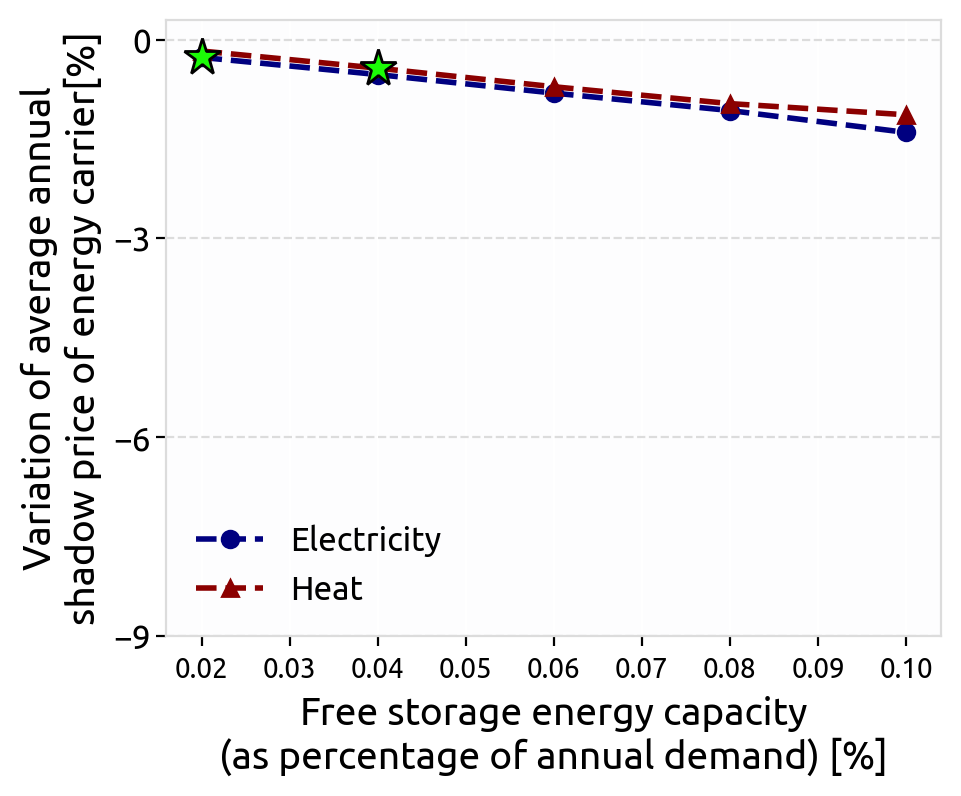

In [78]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['axes.facecolor'] = '#fdfdfe'
plt.rc('axes',edgecolor='gainsboro')

fig, axs = plt.subplots(figsize=(5,4), sharey=True, )
index= [i for i in range(7)]


#index= [0]+[float(i.split('p')[1]) for i in main_scen[scenario][0]] ##TODO: fix the scenario

#for conswcutive: costs[[i.format(main_scen[i][0][1]) for i in main_scen.keys()]].sum(),
markers = ['o','^','d','<','X','s','>','p']

for i, sector in enumerate(['elec', 'heat']):
     to_select= list(set([i for i in df_price.columns.get_level_values(0) if sector in i and 'Base' not in i]))
     to_plot= ((df_price[to_select].mean().unstack().mean(axis=1)/df_price[sector+'-Base'].mean().mean())-1)*100
     to_plot=to_plot.sort_index()
     print(to_plot)
     index= [float(i.split('p')[1]) for i in to_plot.index]
     label= sector_long_names[sector]
     axs.plot(index,  to_plot,#*-1,
                #color= 'k', #tech_colors['solar'],
                linestyle='--',
                linewidth = 2,
                marker=markers[i],
                markersize=6,
                zorder=3,
                label= label, #+ ' demand reduction',
                color= sector_colors[label]) 
     if sector =='elec':   
       axs.plot(0.02,  to_plot[sector+'-p0.02'],#*-1,
                marker='*',
                markersize=14,
                zorder=4,
                markerfacecolor= '#1bfc06',
                markeredgecolor= 'k',
                 )        
     if sector =='heat':   
       axs.plot(0.04,  to_plot[sector+'-p0.04'],#*-1,
                marker='*',
                markersize=14,
                zorder=4,
                markerfacecolor= '#1bfc06',
                markeredgecolor= 'k',
                 ) 
           

#xlabels = [float(i.split('p')[1]) for i in main_scen[scenario][0]]
#axs.set_xticks((index))    
#axs.set_xticklabels(xlabels,fontsize=12, rotation=45,ha='right', rotation_mode='anchor')
axs.set_ylabel('Variation of average annual\nshadow price of energy carrier[%]', fontsize=14)    
axs.set_xlabel('Free storage energy capacity\n(as percentage of annual demand) [%]', fontsize=14)    
axs.grid(axis = 'y' , color='gainsboro', zorder=0, linestyle='dashed')
axs.tick_params(axis='y', labelsize=12, pad=2,)
#axs.set_yticks(np.arange(0,20.1,5))    

axs.set_yticks([0,-3,-6,-9])    
axs.set_ylim((-9,0.3))    

axs.legend(
           loc='best',
           #bbox_to_anchor=(1.6, 0.5),ncol=1 , 
           fontsize=12, frameon=False)

In [19]:
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'

plt.rcParams.update({"axes.grid" : True, "grid.color" :"white" , "grid.linestyle":"solid"})

In [17]:
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = matplotlib.colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

## Supplementary Figure 13

INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores
INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemIelecIp0.1_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores
INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemIheatIp0.1_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores


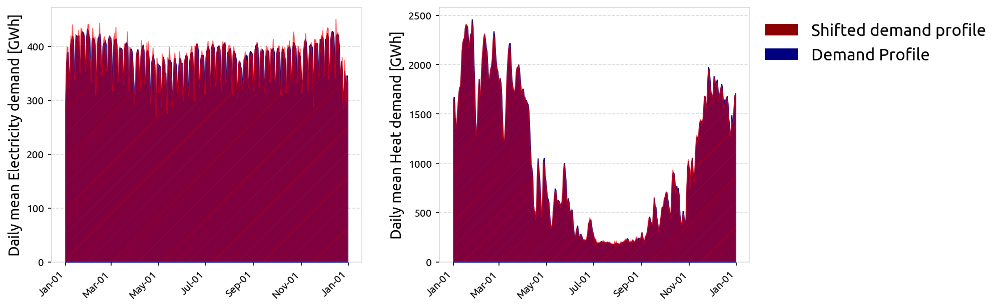

In [41]:
from matplotlib.ticker import MultipleLocator, FuncFormatter, NullFormatter
from matplotlib import dates as mdates

plt.rc('axes',edgecolor='gainsboro')
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams.update({"axes.grid" : True, "grid.color" :"gainsboro" , "grid.linestyle":"dashed"})

n1= pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc')
#n2= pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemIelecIp0.1_2050.nc')
#n3= pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemItranIp50_2050.nc')
#n4= pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemIheatIp50_2050.nc')



fig, axs = plt.subplots(1,2, figsize=(12, 5), dpi=150)
fig.subplots_adjust(wspace=0.25)


for i,carrier in enumerate(['elec', 'heat', ]): #'tran']):
   n2 = pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemI{}Ip0.1_2050.nc'.format(carrier))
   sector_loads =  carrier_names[carrier]
    
   load_i = n1.loads.index[n1.loads.carrier.isin(sector_loads)]

   temp1 = (n1.loads_t.p_set.loc[:, [i for i in load_i if i in n1.loads_t.p_set.columns]].sum(axis=1) -(
    n1.stores_t.p.filter(like='peak reduction').sum(axis=1))).resample('D').mean()* (8760/len(n1.snapshots))
   temp2 = (n2.loads_t.p_set.loc[:, [i for i in load_i if i in n2.loads_t.p_set.columns]].sum(axis=1) -(
    n2.stores_t.p.filter(like='peak reduction').sum(axis=1))).resample('D').mean() * (8760/len(n1.snapshots))

   axs[i].stackplot(temp1.index, temp1/1e3, color='navy', colors=('white',), zorder=3,alpha= 1 )

   stack= axs[i].stackplot(temp2.index, temp2/1e3, color='red', colors=('none',), alpha= 0.5, zorder=3,hatch='//')
   axs[i].set_ylabel('Daily mean '+ sector_long_names[carrier] +' demand [GWh]', fontsize=14)

   axs[i].xaxis.set_major_formatter(mdates.DateFormatter('%b-%d'))
   axs[i].grid(which='major', axis='x', color='white')
fig.autofmt_xdate(rotation=45)
legend_manual=[]
facecolor=['navy', 'darkred']
alpha=[1, 0,5]
for i, label in enumerate(['Demand Profile', 'Shifted demand profile']):
    legend_manual.append(mpatches.Patch(facecolor=facecolor[i], #alpha=  alpha[i], 
                                        label=label))
legend2=plt.legend(handles=legend_manual[::-1],loc='upper left', 
                   bbox_to_anchor=(1, 1),ncol=1,
           fontsize=16,frameon=False)
#plt.gca().add_artist(legend2)

#plt.show()

#plt.show()

## Supplementary figure 12

INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores


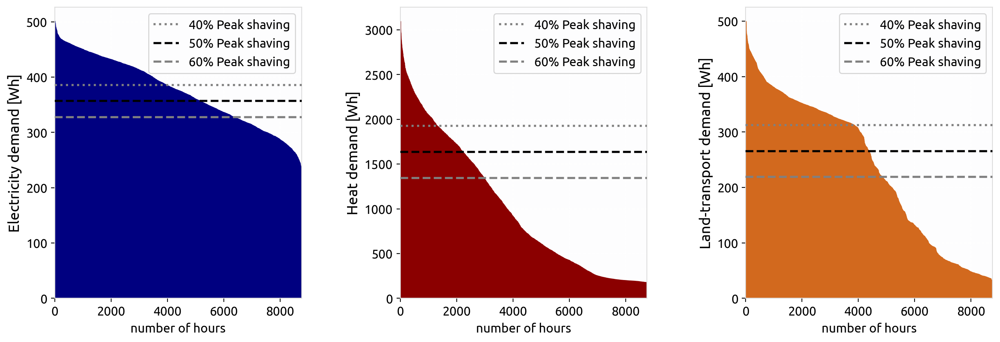

In [38]:
##Duration curvs
from matplotlib.ticker import MultipleLocator, FuncFormatter, NullFormatter
from matplotlib import dates as mdates
plt.rcParams['axes.facecolor'] =  '#fdfdfe' #'#fdfdfe'#'whitesmoke'

n1= pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc')
#n2= pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemIelecIp50_2050.nc')
#n3= pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemItranIp50_2050.nc')
#n4= pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemIheatIp50_2050.nc')
 
fig, axs = plt.subplots(1,3, figsize=(16, 5), dpi=200)
fig.subplots_adjust(hspace=0.4)
fig.subplots_adjust(wspace=0.4)
for i,carrier in enumerate(['elec', 'heat', 'tran']):
   sector_loads =  carrier_names[carrier]
   load_i = n1.loads.index[n1.loads.carrier.isin(sector_loads)]
   df = n1.loads_t.p_set.loc[:, [i for i in load_i if i in n1.loads_t.p_set.columns]]* (8760/len(n1.snapshots))
   peak = df.sum(axis =1).min() + (df.sum(axis =1).max()-df.sum(axis =1).min())*0.5  
   peak2 = df.sum(axis =1).min() + (df.sum(axis =1).max()-df.sum(axis =1).min())*0.4 
   peak3 = df.sum(axis =1).min() + (df.sum(axis =1).max()-df.sum(axis =1).min())*0.6
   #print(carrier, df.min(), df.max(), peak) 
   #print(carrier, ' : ', peak) 
     
   to_plot = df.sum(axis=1).sort_values(ascending=False).reset_index(drop=True)
   to_plot.index = [k / len(df.sum(axis=1)) * 8760 for k in to_plot.index]
    
   axs[i].stackplot(to_plot.index, to_plot/1e3, color=sector_colors_[carrier], zorder=2,) # label=sector_long_names[carrier])
   axs[i].set_ylabel(sector_long_names[carrier]+' demand [Wh]', fontsize=14)
   #axs[i].stackplot(temp2.index, temp2, color='orange', colors=('none',), alpha= 0.5, zorder=3)
   axs[i].axhline(peak3/1e3, color='grey', linewidth=2, linestyle='dotted', zorder=3,label='40% Peak shaving')
   axs[i].axhline(peak/1e3, color='black', linewidth=2, linestyle='--', zorder=3,label='50% Peak shaving')
   axs[i].axhline(peak2/1e3, color='grey', linewidth=2, linestyle='--', zorder=3,label='60% Peak shaving')
   axs[i].legend(fontsize=12)
   axs[i].set_xlabel('number of hours', fontsize=12)
   axs[i].set_xticks(np.arange(0, 8001, 2000),)
    #axs[i].xaxis.set_major_formatter(mdates.DateFormatter('%b-%d'))
   axs[i].set_xlim((0,8760))
   axs[i].tick_params(which="major", axis="both", labelsize=12)
   axs[i].set_xticks(np.arange(0, 8001, 2000),)

#fig.autofmt_xdate(rotation=45)


plt.show()

In [62]:
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'

plt.rcParams.update({"axes.grid" : False, "grid.color" :"whitesmoke" , "grid.linestyle":"solid"})

In [19]:
iso2name={'AT':'Austria',
          'BE':'Belgium',
          'BG':'Bulgaria',
          'CH':'Switzerland',
          'CZ':'Czechia',
          'DE':'Germany',
          'DK':'Denmark',
          'EE':'Estonia',
          'ES':'Spain',
          'FI':'Finland',
          'FR':'France',
          'GB':'United Kingdom',
          'GR':'Greece',
          'HR':'Croatia',
          'HU':'Hungary',
          'IT':'Italy',
          'LT':'Lithuania',
          'LU':'Luxembourg',
          'LV':'Latvia',
          'NO':'Norway',
          'PL':'Poland',
          'PT':'Portugal',
          'RO':'Romania',
          'SE':'Sweden',
          'SI':'Slovenia',
          'SK':'Slovakia',
          'IE':'Ireland',
          'NL':'Netherlands',
          'ME':'Montenegro',
          'AL':'Albania',
          'BA':'Bosnia and Herzegovina',
          'MK':'North Macedonia',
          'RS':'Serbia',}

## Figure 3

INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores
INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemIelecIp0.1-lowv_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores


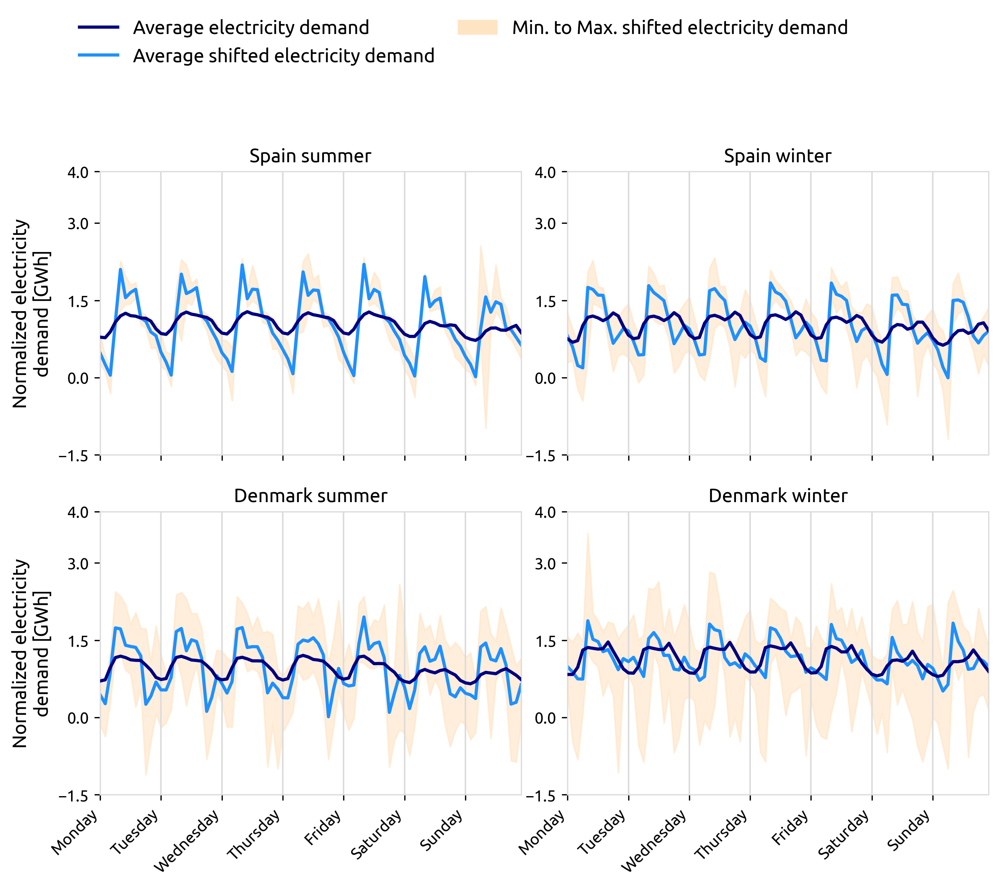

In [71]:
## adjusted demand with free storage (normalized values)

from matplotlib.ticker import MultipleLocator, FuncFormatter, NullFormatter
from matplotlib import dates as mdates
plt.rc('axes',edgecolor='gainsboro')

fig, axs = plt.subplots(2,2, figsize=(10, 8),  dpi=300, gridspec_kw={'width_ratios': [1, 1]} )#sharey=True)
fig.subplots_adjust(wspace=0.11)
fig.subplots_adjust(hspace=0.2)


n1= pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc')
n2= pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemIelecIp0.1-lowv_2050.nc')

sector_loads =  carrier_names['elec']
    
load_i = n1.loads.index[n1.loads.carrier.isin(sector_loads)]

summer_ind = ['2013-06-01 00:00:00','2013-09-01 00:00:00']
winter_ind = ['2013-01-01 00:00:00','2013-03-01 00:00:00', '2013-11-01 00:00:00','2013-12-31 00:00:00']
summer_time = ([i for i in n2.loads_t.p[summer_ind[0]:summer_ind[1]].index] )
winter_time = ([i for i in n2.loads_t.p[winter_ind[0]:winter_ind[1]].index] + 
     [i for i in n2.loads_t.p[winter_ind[2]:winter_ind[3]].index])
    
seasons=['summer','winter']

for i, country in enumerate(['ES','DK']): 
  for j, season in enumerate([summer_time, winter_time]):

     df_load=pd.DataFrame((n2.loads_t.p_set.loc[:, [i for i in load_i if i in 
                                               n2.loads_t.p_set.columns]].filter(like=country).sum(axis=1)))  #GWh 

     df_load_normalized =  df_load/df_load.mean()   ##normalize by average demand             
     df_load_normalized['weekday']=(df_load.index.weekday)
     df_load_normalized['hour']=(df_load.index.hour)
     index =df_load[72:72+84].index ##datetime strarting from a monday at midnight

     l_load,= axs[i,j].plot(index, (df_load_normalized.loc[season].groupby([df_load_normalized.loc[season,'weekday'],   ##GWh
                              df_load_normalized.loc[season,'hour']]).mean()[0].values),   
                          color='navy',label='load',lw=2,zorder =3)

     df_load_adjusted=pd.DataFrame(df_load[0]-
                        (n2.stores_t.p.filter(like='peak reduction').filter(like=country).sum(axis=1)))  
     
     df_load_adjusted =  df_load_adjusted/df_load.mean() ##normalize by average demand    
     df_load_adjusted['weekday']=(df_load_adjusted.index.weekday)
     df_load_adjusted['hour']=(df_load_adjusted.index.hour)

     l_load2,= axs[i,j].plot(index, df_load_adjusted.loc[season].groupby([df_load_adjusted.loc[season,'weekday'],   ##GWh
                              df_load_adjusted.loc[season,'hour']]).mean()[0].values,   
                          color='dodgerblue',label='load',lw=2,zorder =2)

     y1 = df_load_adjusted.loc[season].groupby([df_load_adjusted.loc[season,'weekday'], 
                              df_load_adjusted.loc[season,'hour']]).min()[0].values
     y2 = df_load_adjusted.loc[season].groupby([df_load_adjusted.loc[season,'weekday'], 
                              df_load_adjusted.loc[season,'hour']]).max()[0].values
     axs[i,j].fill_between(index, y1, y2 , color= 'bisque' , zorder=1, alpha=0.6)  
     axs[i,j].set_xlim([index[0],index[-1] ])
     axs[i,j].set_title(iso2name[country]+' '+seasons[j], fontsize=12)

"""
axs[i,j].xaxis.set_major_locator(MultipleLocator(12))
axs[i,j].xaxis.set_minor_locator(MultipleLocator(2))
days = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"] ##when df is grouped it starts from monday
def tick(x,pos):
    if x % 12 == 6:
        return days[int(x)//12]
    else:
        return ""
axs[i,j].xaxis.set_major_formatter(NullFormatter())
axs[i,j].xaxis.set_minor_formatter(FuncFormatter(tick))
axs[i,j].tick_params(which="major", axis="x", length=10, width=1.5)
"""
for ax in axs.flat: 
   ax.grid(axis = 'x' , color='gainsboro', zorder=0)
   ax.xaxis.set_major_locator(mdates.DayLocator())
   #ax.xaxis.set_minor_locator(mdates.HourLocator(byhour = [24]))
   ax.xaxis.set_major_formatter(mdates.DateFormatter('%A'))
   #ax.xaxis.set_minor_formatter(mdates.DateFormatter("%H"))
   ax.grid(which = "major", axis = "x", linestyle = "-", linewidth = 1)
   ax.grid(which = "minor", axis = "x", linestyle = "--", linewidth = 1)
   ax.spines[['right', 'top','left','bottom']].set_visible(True)
fig.autofmt_xdate(rotation=45)

   
axs[0,0].set_yticks([-1.5,0,1.5,3 ,4])
axs[0,1].set_yticks([-1.5,0,1.5,3 ,4])
axs[1,0].set_yticks([-1.5,0,1.5,3 ,4])
axs[1,1].set_yticks([-1.5,0,1.5,3 ,4])

axs[0,0].set_ylabel('Normalized electricity\ndemand [GWh]', fontsize=12)
axs[1,0].set_ylabel('Normalized electricity\ndemand [GWh]', fontsize=12)



legend1=axs[i,j].legend([(l_load),(l_load2),],
           ["Average electricity demand","Average shifted electricity demand",], 
           loc='upper left', ncol=1, bbox_to_anchor=(-1.2,2.8),
          fontsize=12, frameon=False)

plt.gca().add_artist(legend1)

legend_manual=[]
for i, label in enumerate(['Min. to Max. shifted electricity demand',]):
    legend_manual.append(mpatches.Patch(facecolor='bisque', edgecolor='bisque', 
                                        label=label))
legend2=plt.legend(handles=legend_manual[::-1],loc='upper left', 
                   bbox_to_anchor=(-.3, 2.8),ncol=1,
           fontsize=12,frameon=False)
#plt.gca().add_artist(legend2)
plt.show()
#fig.tight_layout()

## Supplementary figure 14

INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-nov2g_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores
INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemIheatIp0.1_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores


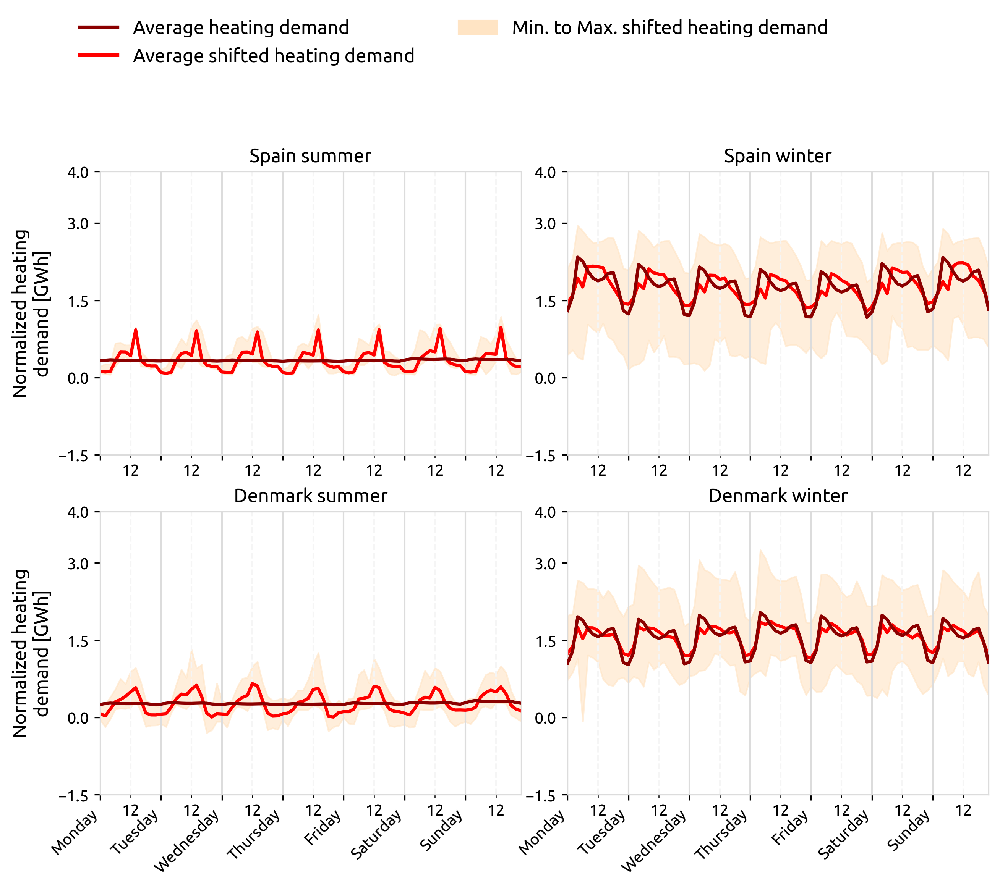

In [81]:
## adjusted demand with free storage (normalized values)

from matplotlib.ticker import MultipleLocator, FuncFormatter, NullFormatter
from matplotlib import dates as mdates
plt.rc('axes',edgecolor='gainsboro')

fig, axs = plt.subplots(2,2, figsize=(10, 8),  dpi=300, gridspec_kw={'width_ratios': [1, 1]} )#sharey=True)
fig.subplots_adjust(wspace=0.11)
fig.subplots_adjust(hspace=0.2)


n1= pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-nov2g_2050.nc')
n2= pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-sdemIheatIp0.1_2050.nc')

sector_loads =  carrier_names['heat']
    
load_i = n1.loads.index[n1.loads.carrier.isin(sector_loads)]

summer_ind = ['2013-06-01 00:00:00','2013-09-01 00:00:00']
winter_ind = ['2013-01-01 00:00:00','2013-03-01 00:00:00', '2013-11-01 00:00:00','2013-12-31 00:00:00']
summer_time = ([i for i in n2.loads_t.p[summer_ind[0]:summer_ind[1]].index] )
winter_time = ([i for i in n2.loads_t.p[winter_ind[0]:winter_ind[1]].index] + 
     [i for i in n2.loads_t.p[winter_ind[2]:winter_ind[3]].index])
    
seasons=['summer','winter']

for i, country in enumerate(['ES','DK']): 
  for j, season in enumerate([summer_time, winter_time]):

     df_load=pd.DataFrame((n2.loads_t.p_set.loc[:, [i for i in load_i if i in 
                                               n2.loads_t.p_set.columns]].filter(like=country).sum(axis=1)))  #GWh 

     df_load_normalized =  df_load/df_load.mean()   ##normalize by average demand             
     df_load_normalized['weekday']=(df_load.index.weekday)
     df_load_normalized['hour']=(df_load.index.hour)
     index =df_load[72:72+84].index ##datetime strarting from a monday at midnight

     l_load,= axs[i,j].plot(index, (df_load_normalized.loc[season].groupby([df_load_normalized.loc[season,'weekday'],   ##GWh
                              df_load_normalized.loc[season,'hour']]).mean()[0].values),   
                          color='darkred',label='load',lw=2,zorder =3)

     df_load_adjusted=pd.DataFrame(df_load[0]-
                        (n2.stores_t.p.filter(like='peak reduction').filter(like=country).sum(axis=1)))  
     
     df_load_adjusted =  df_load_adjusted/df_load.mean() ##normalize by average demand    
     df_load_adjusted['weekday']=(df_load_adjusted.index.weekday)
     df_load_adjusted['hour']=(df_load_adjusted.index.hour)

     l_load2,= axs[i,j].plot(index, df_load_adjusted.loc[season].groupby([df_load_adjusted.loc[season,'weekday'],   ##GWh
                              df_load_adjusted.loc[season,'hour']]).mean()[0].values,   
                          color='red',label='load',lw=2,zorder =2)

     y1 = df_load_adjusted.loc[season].groupby([df_load_adjusted.loc[season,'weekday'], 
                              df_load_adjusted.loc[season,'hour']]).min()[0].values
     y2 = df_load_adjusted.loc[season].groupby([df_load_adjusted.loc[season,'weekday'], 
                              df_load_adjusted.loc[season,'hour']]).max()[0].values
     axs[i,j].fill_between(index, y1, y2 , color= 'bisque' , zorder=1, alpha=0.6)  
     axs[i,j].set_xlim([index[0],index[-1] ])
     axs[i,j].set_title(iso2name[country]+' '+seasons[j], fontsize=12)

"""
axs[i,j].xaxis.set_major_locator(MultipleLocator(12))
axs[i,j].xaxis.set_minor_locator(MultipleLocator(2))
days = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"] ##when df is grouped it starts from monday
def tick(x,pos):
    if x % 12 == 6:
        return days[int(x)//12]
    else:
        return ""
axs[i,j].xaxis.set_major_formatter(NullFormatter())
axs[i,j].xaxis.set_minor_formatter(FuncFormatter(tick))
axs[i,j].tick_params(which="major", axis="x", length=10, width=1.5)
"""
for ax in axs.flat: 
   ax.grid(axis = 'x' , color='gainsboro', zorder=0)
   ax.xaxis.set_major_locator(mdates.DayLocator())
   ax.xaxis.set_minor_locator(mdates.HourLocator(byhour = [12]))
   ax.xaxis.set_major_formatter(mdates.DateFormatter('%A'))
   ax.xaxis.set_minor_formatter(mdates.DateFormatter("%H"))
   ax.grid(which = "major", axis = "x", linestyle = "-", linewidth = 1)
   ax.grid(which = "minor", axis = "x", linestyle = "--", linewidth = 1)
   ax.spines[['right', 'top','left','bottom']].set_visible(True)
fig.autofmt_xdate(rotation=45)

   
axs[0,0].set_yticks([-1.5,0,1.5,3 ,4])
axs[0,1].set_yticks([-1.5,0,1.5,3 ,4])
axs[1,0].set_yticks([-1.5,0,1.5,3 ,4])
axs[1,1].set_yticks([-1.5,0,1.5,3 ,4])

axs[0,0].set_ylabel('Normalized heating\ndemand [GWh]', fontsize=12)
axs[1,0].set_ylabel('Normalized heating\ndemand [GWh]', fontsize=12)


legend1=axs[i,j].legend([(l_load),(l_load2),],
           ["Average heating demand","Average shifted heating demand",], 
           loc='upper left', ncol=1, bbox_to_anchor=(-1.2,2.8),
          fontsize=12, frameon=False)

plt.gca().add_artist(legend1)

legend_manual=[]
for i, label in enumerate(['Min. to Max. shifted heating demand',]):
    legend_manual.append(mpatches.Patch(facecolor='bisque', edgecolor='bisque', 
                                        label=label))
legend2=plt.legend(handles=legend_manual[::-1],loc='upper left', 
                   bbox_to_anchor=(-.3, 2.8),ncol=1,
           fontsize=12,frameon=False)
#plt.gca().add_artist(legend2)  ##run 2nd time without this to get legen :/

#fig.tight_layout()

Text(0.5, 1.0, 'Total free storage charge/discharge')

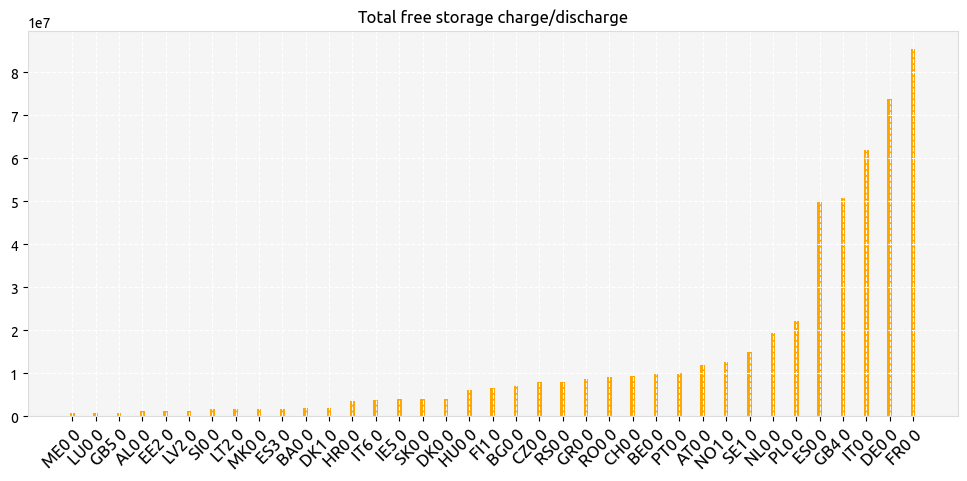

In [279]:
fig, axs = plt.subplots(figsize=(12, 5), ) 

scenario ='elec-p0.4'
index=np.arange(len(df_storage_use[scenario].index))
bar_width = 0.2

    
axs.bar(index, df_storage_use[scenario].sort_values().values, bar_width , color='orange')


axs.set_xticks((index))    
axs.set_xticklabels(df_storage_use[scenario].sort_values().index,fontsize=12, rotation=45,ha='right', rotation_mode='anchor')

axs.set_title('Total free storage charge/discharge')

## load shedding results

In [11]:
## load shedding
main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   , #'p100000','p10000','p1000',p5000','p2500',
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemIelecI{}_2050.nc':[['p1000','p950-lowtol', 'p850-lowtol','p800', 'p750-lowtol','p700-lowtol','p650-lowtol','p600-lowtol','p550-lowtol', 'p549-lowtol','p500-lowtol','p450-lowtol','p400','p350-lowtol','p300', 'p250','p200-lowtol'],'Electricity demand reduction' ] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemIheatI{}_2050.nc':[['p1000','p950','p850','p800','p750-lowtol','p700','p650','p600','p550-lowtol','p500','p450','p400','p350','p300','p250-lowtol','p200'],'Heat demand reduction'] ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemItranI{}_2050.nc':[['p1000','p950','p850','p800','p750','p700','p650','p600','p550','p500','p450','p400','p350','p300','p250','p200'],'Land-transport demand reduction']  ,
}

In [144]:
df_ls_to_demand

,p1000,p950,p850,p800,p750-lowtol,p700,p650,p600,p550-lowtol,p500,p450,p400,p350,p300,p250-lowtol,p200,p750,p550,p549,p250
elec,0.000575,0.000765,0.001343,0.001834,NaN,0.002608,0.003018,0.00347,NaN,0.004638,0.005736,0.007554,0.011081,0.019108,NaN,0.077989,0.002209,0.003918,0.003931,0.037577
heat,0.000302,0.000381,0.000555,0.000665,NaN,0.000908,0.00102,0.001151,NaN,0.001541,0.001845,0.002311,0.003006,0.004869,NaN,0.025128,0.000785,0.001325,NaN,0.010884
tran,0.000832,0.001227,0.002301,0.00288,NaN,0.003964,0.004559,0.005357,NaN,0.007147,0.008718,0.011123,0.015782,0.026605,NaN,0.114143,0.003318,0.006127,NaN,0.056217


In [14]:
from matplotlib import cm
import matplotlib

norm = matplotlib.colors.Normalize(vmin=0, vmax=1)
color_list=[cm.Dark2(norm(j),bytes=True) for j in np.arange(0,1.1,0.1) ]
new_colors=[tuple([i/255.0 for i in j]) for j in color_list]

color_list=[cm.tab20(norm(j),bytes=True) for j in np.arange(0,1.1,0.05) ]
new_colors1=[tuple([i/255.0 for i in j]) for j in color_list]
color_list=[cm.Dark2(norm(j),bytes=True) for j in np.arange(0,1.1,0.1) ]
new_colors2=[tuple([i/255.0 for i in j]) for j in color_list]+ new_colors1

In [15]:
new_colors_c = [(0.10588235294117647, 0.6196078431372549, 0.4666666666666667, 1.0),
 #(0.10588235294117647, 0.6196078431372549, 0.4666666666666667, 1.0),
 (0.8509803921568627, 0.37254901960784315, 0.00784313725490196, 1.0),
 (0.4588235294117647, 0.4392156862745098, 0.7019607843137254, 1.0),
 (0.9058823529411765, 0.1607843137254902, 0.5411764705882353, 1.0),
 (0.4, 0.6509803921568628, 0.11764705882352941, 1.0),
 #(0.4, 0.6509803921568628, 0.11764705882352941, 1.0),
 (0.9019607843137255, 0.6705882352941176, 0.00784313725490196, 1.0),
]

In [28]:
plt.rc('axes',edgecolor='gainsboro')
plt.rcParams['axes.facecolor'] = '#fdfdfe'
plt.rcParams['figure.facecolor'] = 'white'

## Figure 4

INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores
INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemIelecIp200-lowtol_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores
INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemIelecIp250_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores
INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemIelecIp300_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores
INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemIelecIp350-lowtol_2050.nc has buses, carriers, generators, global_constraints, lines, links, loa

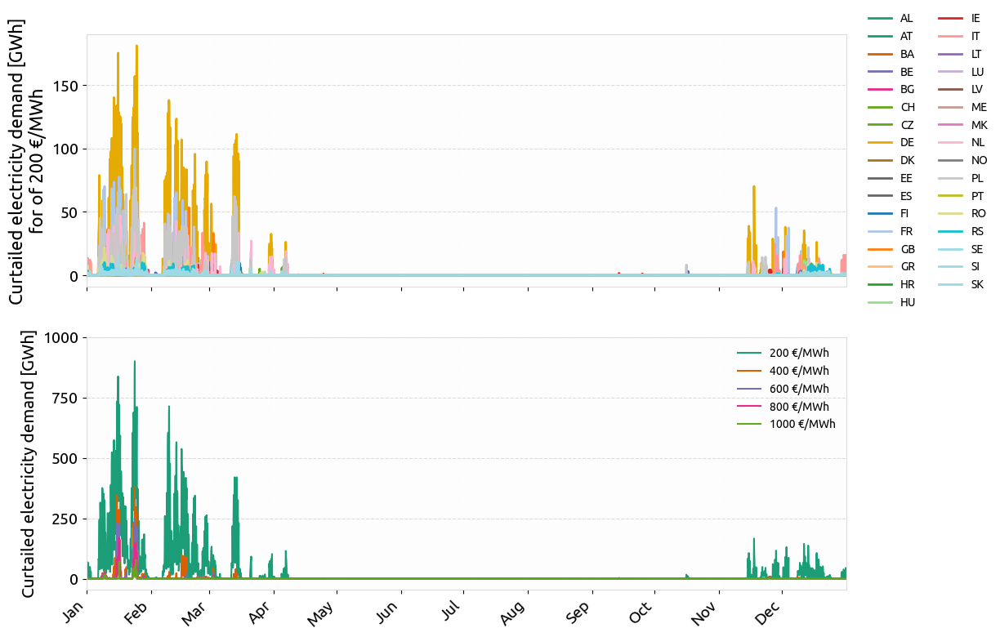

In [29]:
from cycler import cycler
from matplotlib.dates import DateFormatter
from matplotlib import dates as mdates

fig, axs = plt.subplots(2,1, figsize=(12, 10),)

index= [i for i in range(9)]

## load shedding
#   [['p1000','p950-lowtol', 'p850-lowtol','p800', 'p700-lowtol','p600-lowtol','p549-lowtol','p500-lowtol','p400','p350-lowtol','p300', 'p250','p200-lowtol'],'Electricity demand reduction' ] ,
plt.rc('axes',edgecolor='gainsboro')
plt.rcParams['axes.facecolor'] = '#fdfdfe'
plt.rcParams['figure.facecolor'] = 'white'


n_base_l='main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemIelecI{}_2050.nc'
n=pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc')
countries=set([i[:2] for i in n.buses.index if n.buses.carrier[i]=='AC'])  #[:2] 

df_load_shedding = pd.DataFrame(index= sorted(list(countries)) , columns= [i for i in main_scen[n_base_l][0]] )
counter=0
for i, scenario in enumerate(reversed(main_scen[n_base_l][0])):
  n= pypsa.Network(n_base_l.format(scenario))
  df_load_shedding[scenario] = n.generators_t.p.filter(like='load shedding').sum(axis=0).groupby(
                                               n.generators.bus.map(n.buses.country)).sum()
    
  if  scenario in ['p200-lowtol','p400','p600-lowtol','p800','p1000']:

    axs[1].plot(2* n.generators_t.p.filter(like='load shedding').sum(axis=1)/1e3, ##GWh 
              color= new_colors_c[counter] , label=(scenario.split('p')[1]).split('-')[0]+' €/MWh') 
    counter+=1


    if scenario=='p200-lowtol' :
     custom_cycler = cycler(color=new_colors2)
     axs[0].set_prop_cycle(custom_cycler)

     df_temp=(n.generators_t.p.filter(like='load shedding').groupby(
         n.generators.bus.map(n.buses.country), axis=1).sum())

     axs[0].plot(df_temp/1e3, label=df_temp.columns, linewidth=2)  ##GWh  

    
#axs.set_ylabel('Change in capacity')    
for ax in axs.flat:
    ax.grid(axis = 'y' , color='gainsboro', zorder=0, linestyle='dashed')
    ax.tick_params(axis='y', labelsize=14) 
    ax.tick_params(axis='x', labelsize=14) 
    ax.set_xlim((df_temp.index[0], df_temp.index[-1]))
    
axs[0].set_ylabel('Curtailed electricity demand [GWh]\nfor of 200 €/MWh', fontsize=16)    
axs[1].set_ylabel('Curtailed electricity demand [GWh]', fontsize=15)    
axs[1].set_yticks([0,250,500,750,1000])    

axs[1].xaxis.set_major_formatter(mdates.DateFormatter('%b'))
axs[0].xaxis.set_major_formatter(mdates.DateFormatter('%b'))

fig.autofmt_xdate(rotation=45)

axs[1].legend(loc='best'
          ,ncol=1 , 
           fontsize=10, frameon=False)
axs[0].legend(loc='center right',
           bbox_to_anchor=(1.2, 0.5),ncol=2 , 
        fontsize=10, frameon=False)

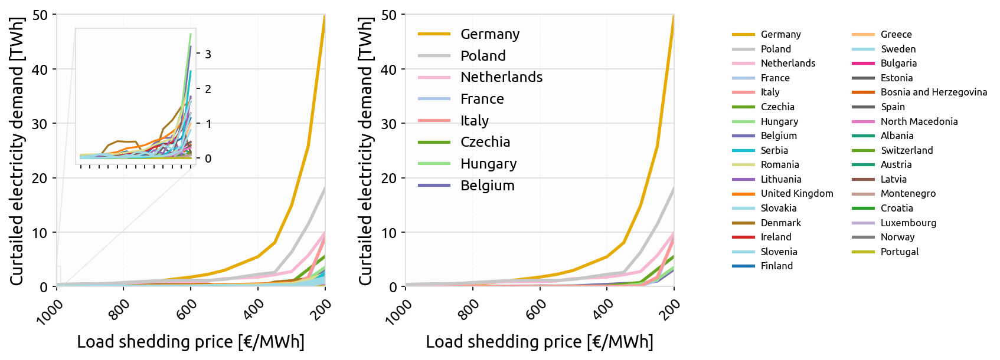

In [25]:
## as absolute values
from cycler import cycler
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

fig, axs = plt.subplots(1,2,figsize=(9,4), dpi=150)
fig.subplots_adjust(wspace=0.3)

custom_cycler = cycler(color=new_colors2)

axs[0].set_prop_cycle(custom_cycler)

df_load_shedding['order'] = range(0, len(df_load_shedding))
order = df_load_shedding.sort_values(by='p200-lowtol', ascending=False)['order'].values
cycler_inset= [new_colors2[i] for i in df_load_shedding[df_load_shedding['p200-lowtol']<2e6]['order']]
cycler_2= [new_colors2[i] for i in df_load_shedding[df_load_shedding['p200-lowtol']>1.59e+06]['order']]
to_plot_2= [i for i in df_load_shedding[df_load_shedding['p200-lowtol']>1.59e+06].index]

df_load_shedding=df_load_shedding.drop(labels=['order'], axis=1) #,'p650-lowtol','p750-lowtol','p550-lowtol','p450-lowtol'], axis=1) 
index=[0,50,150,200,300,400,450,500,600,650,700,750,800]
xlabels=['1000','950','850','800', '700','600','549','500','400','350','300','250','200']


axs[0].plot(index,# (df_load_shedding.loc[['DE','PL','NL', 'FR', 'IT']]).T, ##only plotting first five countries
        2*  df_load_shedding.T/1e6,  ##TWh
         #label=(df_load_shedding.loc[['DE','PL','NL', 'FR', 'IT']]).index, 
         label=df_load_shedding.index, 
        linewidth=2.5)

custom_cycler_2= cycler(color=cycler_2)
axs[1].set_prop_cycle(custom_cycler_2)
axs[1].plot(index, (2* df_load_shedding.loc[to_plot_2]).T/1e6, ##only plotting first five countries
         label=(df_load_shedding.loc[to_plot_2]).index, 
        linewidth=2.5)

custom_cycler_inset = cycler(color=cycler_inset)
axins = axs[0].inset_axes([0.07, 0.45, 0.45, 0.5],xticklabels=[])
axins.set_prop_cycle(custom_cycler_inset)
axins.plot( (2* df_load_shedding[df_load_shedding['p200-lowtol']<2e6]).T/1e6,  ##TWh
            linewidth=1.5)

axins.yaxis.tick_right()
axins.ticklabel_format(style ='sci', scilimits=(0,0), axis='y')

axs[0].indicate_inset_zoom(axins, edgecolor="gainsboro")
    
handles, labels = axs[0].get_legend_handles_labels()
axs[0].legend([handles[idx] for idx in order],  ##only 1st five countries
           [iso2name[labels[idx]] for idx in order],
           loc='center right',
           bbox_to_anchor=(3.5, 0.5),ncol=2 , 
           fontsize=8, frameon=False)

axs[1].legend([handles[idx] for idx in order][:len(to_plot_2)],  ##only 1st five countries
           [iso2name[labels[idx]] for idx in order][:len(to_plot_2)],
           loc='best',
           fontsize=12, frameon=False)

#xlabels= [(i.split('p')[1]).split('-')[0] for i in df_load_shedding.columns]
#axs.set_xticks(index)
for ax in axs.reshape(-1): 
  ax.set_xticks([0,200,400,600,800])
  xlabels=['1000','800','600','400','200']
  ax.set_xticklabels(xlabels,fontsize=12, rotation=45,ha='right', rotation_mode='anchor')
  ax.set_ylabel('Curtailed electricity demand [TWh]', fontsize=14)    
  ax.set_xlabel('Load shedding price [€/MWh]', fontsize=14)        
  ax.tick_params(axis='y', labelsize=12) 
  ax.grid(axis = 'y' , color='gainsboro', zorder=0,linestyle='solid')
  ax.grid(axis = 'x' , color='whitesmoke', zorder=0, linestyle='dashed')
  ax.set_ylim((0,50))
  ax.set_xlim((0, 800))

#axs.tick_params(axis='x', labelsize=12, labelrotation=45) 

## Supplementary Figure 12.d

In [ ]:
n=pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc')


label= 'capital+marginal'
countries=([i for i in n.buses.index if n.buses.carrier[i]=='AC'])  #[:2] 
scenarios_ = ['p1000',
   'p950',
   'p850',
   'p800',
   'p700',
   'p600',
   'p500',
   'p400',
   'p350',
   'p300',
   'p250',
   'p200']

#['p1000','p950-lowtol', 'p850-lowtol','p800', 'p700-lowtol',
# 'p600-lowtol','p549-lowtol','p500-lowtol','p400','p350-lowtol','p300', 'p250','p200-lowtol'
scenarios = [i+'-'+j for i in ['elec', 'heat'] for j in
             ['Base','p1000', 'p950','p850', 'p800', 'p700',
                'p600', 'p500', 'p400','p350','p300','p250','p200']
             ]

sector_bus_carriers= {'elec' : 'low voltage', # 'low voltage',
                     'heat' :  'heat',
                     'tran' :  'Li ion' }

iterables = [scenarios,
             countries]

df_price= pd.DataFrame(index=n.snapshots,
            columns=pd.MultiIndex.from_product(iterables, names=["scenario", "country"]))


df_load_shedding = pd.DataFrame(index=sorted(list(countries)),
                columns=scenarios)

df_price= df_price.reindex(sorted(df_price.columns), axis=1)

for scen in main_scen.keys():
 if ('Ielec' in scen or 'Iheat' in scen or'dem' not in scen) : 
  for  reduction in main_scen[scen][0]:
   if reduction=='' or ('p' in reduction and reduction.split('-')[0] in scenarios_): 
    #print(reduction)
    scenario=scen.format(str(reduction))
    n=pypsa.Network(scenario)
    nodal_costs=pd.DataFrame({})
    
    scen_name = 'Base' if main_scen[scen][1]=='Base' else scen.split('I')[2] +'-'+reduction.split('-')[0]
    #print(scen_name)
    if  scen_name != 'Base' :
       load_carrier = scenario.split('I')[2] 
       sector_bus_carrier = sector_bus_carriers[load_carrier]
       sector_loads =  carrier_names[load_carrier]
       load_i = n.loads.index[n.loads.carrier.isin(sector_loads)]
        
       df_load_shedding[scen_name] = n.generators_t.p.filter(like='load shedding').sum(axis=0).groupby(
                  n.generators.bus.map(n.buses.location)).sum().values
       
       #df_tload[scen_name]= pd.Series(n.loads_t.p_set.loc[:, [i for i in load_i if i in 
       #                             n.loads_t.p_set.columns]].groupby([n.loads.bus.map(n.buses.location)],
       #                                              axis=1).sum().sum(axis=0).values, index=(countries))
       df=(n.loads_t.p.loc[:,load_i]*
        n.buses_t.marginal_price[[i for i in n.buses.index if sector_bus_carrier in n.buses.carrier[i] ]].values) /(
              n.loads_t.p.loc[:,load_i].sum())
       df_price[scen_name]=df.groupby([n.loads.bus.map(n.buses.location)], axis=1).sum().sort_index()  
    # demand weighted
    else :
      for load_carrier in ['elec','heat']: #'heat','tran']  :
       scen_name= load_carrier+'-Base'
       sector_bus_carrier = sector_bus_carriers[load_carrier]
       sector_loads =  carrier_names[load_carrier]
       load_i = n.loads.index[n.loads.carrier.isin(sector_loads)]
       #df_tload[scen_name]= pd.Series(n.loads_t.p_set.loc[:, [i for i in load_i if i in 
       #                             n.loads_t.p_set.columns]].groupby([n.loads.bus.map(n.buses.location)],
       #                                              axis=1).sum().sum(axis=0).values, index=(countries))  
    
       #print(scenario, scen_name,load_carrier, sector_bus_carrier,sector_loads, load_i) 
       df=(n.loads_t.p.loc[:,load_i]*
        n.buses_t.marginal_price[[i for i in n.buses.index if sector_bus_carrier in n.buses.carrier[i] ]].values) /(
              n.loads_t.p.loc[:,load_i].sum())
       df_price[scen_name]=df.groupby([n.loads.bus.map(n.buses.location)], axis=1).sum().sort_index() # df.groupby(df['country']).mean().T.sort_index() 


In [61]:
#df_price.to_csv('csvs/df_pice_ldem_new.csv')
#df_tload.to_csv('csvs/df_tload_ldem_new.csv')
#df_load_shedding.to_csv('csvs_read/df_load_shedding.csv')

df_price= pd.read_csv('csvs_read/df_pice_ldem_new.csv',index_col=0, header=[0,1], low_memory=False)
df_tload= pd.read_csv('csvs_read/df_tload_ldem_new.csv', index_col=0, header=[0,1], low_memory=False)
df_load_shedding=pd.read_csv('csvs_read/df_load_shedding.csv')


In [193]:
for i, sector in enumerate(['elec', 'heat']):
     to_select= list(set([i for i in df_price.columns.get_level_values(0) if sector in i and 'Base' not in i]))
     for scenario in to_select:
        s=((100*(df_price[scenario].std()/df_price[sector+'-Base'].std())-100))*-1
        print(scenario, '   ', s.mean())

elec-p700     11.749143643442375
elec-p950     5.388936725641803
elec-p800     8.73578832608952
elec-p1000     4.776716357787974
elec-p500     17.233528348932758
elec-p250     28.32188683587977
elec-p850     7.336777891046015
elec-p300     24.211204137107345
elec-p400     20.622277791045313
elec-p600     14.630377517727311
elec-p350     22.312974684347363
elec-p200     34.90921502338274
heat-p950     7.359822366069009
heat-p200     31.778405144670067
heat-p600     15.450983227248036
heat-p300     24.88133437989994
heat-p800     10.258380671696283
heat-p250     nan
heat-p400     21.24725958509242
heat-p850     9.116001693955702
heat-p350     22.95858653929291
heat-p700     12.748350519502335
heat-p500     18.343769308096945
heat-p1000     6.6807487714771465


                0    name
name                     
-1000.0 -0.156801 -1000.0
-950.0  -0.176436  -950.0
-850.0  -0.210570  -850.0
-800.0  -0.234835  -800.0
-700.0  -0.350230  -700.0
-600.0  -0.470964  -600.0
-500.0  -0.618339  -500.0
-400.0  -1.024578  -400.0
-350.0  -1.259325  -350.0
-300.0  -1.613101  -300.0
-250.0  -2.887148  -250.0
-200.0  -5.227921  -200.0
                0    name
name                     
-1000.0 -0.433547 -1000.0
-950.0  -0.472434  -950.0
-850.0  -0.586984  -850.0
-800.0  -0.664251  -800.0
-700.0  -0.833344  -700.0
-600.0  -1.057779  -600.0
-500.0  -1.312792  -500.0
-400.0  -1.643232  -400.0
-350.0  -1.881144  -350.0
-300.0  -2.228432  -300.0
-200.0  -4.277393  -200.0


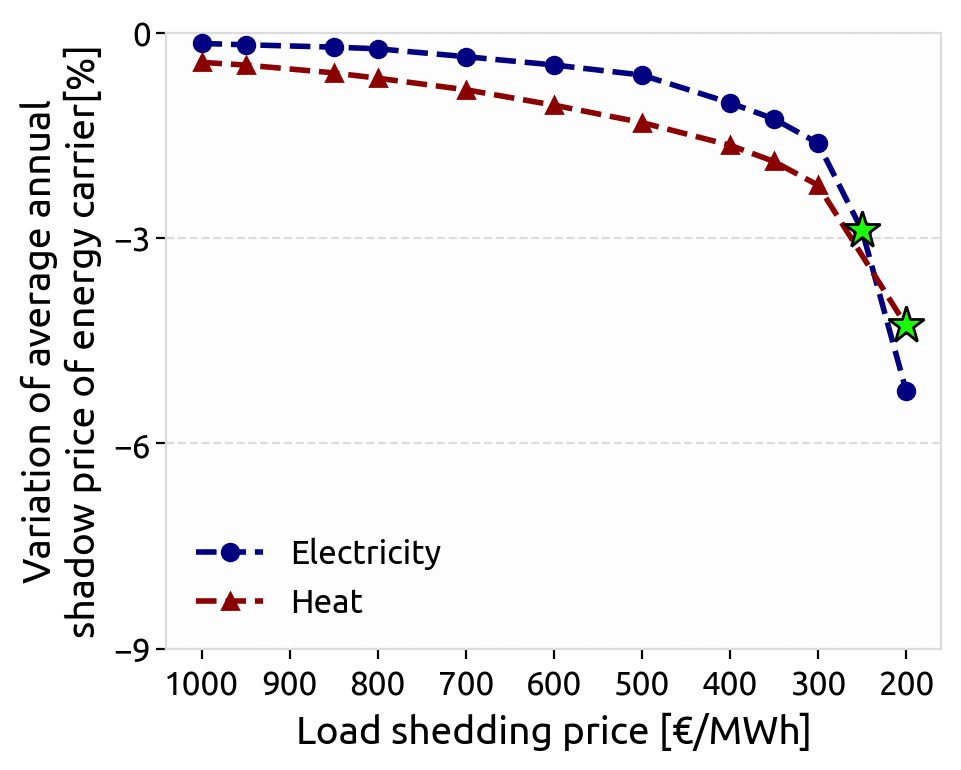

In [65]:
plt.rcParams['figure.dpi'] = 200
fig, axs = plt.subplots(figsize=(5,4), sharey=True, )
index= [i for i in range(7)]
plt.rcParams['axes.facecolor'] = '#fdfdfe'
plt.rc('axes',edgecolor='gray')

#index= [0]+[float(i.split('p')[1]) for i in main_scen[scenario][0]] ##TODO: fix the scenario

#for conswcutive: costs[[i.format(main_scen[i][0][1]) for i in main_scen.keys()]].sum(),
markers = ['o','^','d','<','X','s','>','p']




for i, sector in enumerate(['elec', 'heat']):
     to_select= list(set([i for i in df_price.columns.get_level_values(0) if sector in i and 'Base' not in i and 'heat-p250' not in i]))
     to_plot= pd.DataFrame(((df_price[to_select].mean().unstack().mean(axis=1)/df_price[sector+'-Base'].mean().mean())-1)*100)
     to_plot['name']=[-1*float(i.split('-')[1][1:]) for i in to_plot.index]
     to_plot=to_plot.set_index(to_plot['name'])
     to_plot=to_plot.sort_index()
     print(to_plot)
     #index= [float(i.split('p')[1]) for i in to_plot.index]
     label= sector_long_names[sector]
     axs.plot(to_plot.index,  to_plot[0].values, #-1*
                #color= 'k', #tech_colors['solar'],
                linestyle='--',
                linewidth = 2,
                marker=markers[i],
                markersize=6,
                zorder=3,
                label= label, #+ ' demand reduction',
                color= sector_colors[label]) 
     if sector=='elec':   
      axs.plot(-250,  to_plot.loc[-250,0], #*-1,
                marker='*',
                markersize=14,
                zorder=4,
                markerfacecolor= '#1bfc06',
                markeredgecolor= 'k',
                 )        
     if sector=='heat':   
      axs.plot(-200,  to_plot.loc[-200,0],#*-1,
                marker='*',
                markersize=14,
                zorder=4,
                markerfacecolor= '#1bfc06',
                markeredgecolor= 'k',
                 ) 
    
xlabels = ['1000','900','800','700','600','500','400','300','200']
axs.set_xticks([-1000,-900,-800,-700,-600,-500,-400,-300,-200])    
axs.set_xticklabels(xlabels,fontsize=12,)

axs.set_ylabel('Variation of average annual\nshadow price of energy carrier[%]', fontsize=14)    
axs.set_xlabel('Load shedding price [€/MWh]', fontsize=14)    
axs.grid(axis = 'y' , color='gainsboro', zorder=0, linestyle='dashed')
axs.tick_params(axis='y', labelsize=12, pad=2,)
#axs.set_yticks(np.arange(0,20.1,5))    

axs.set_yticks([0,-3,-6,-9])    
axs.set_ylim((-9,0))    


axs.legend(
           loc='best',
           #bbox_to_anchor=(1.6, 0.5),ncol=1 , 
           fontsize=12, frameon=False)

## Figure 4.a

INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores


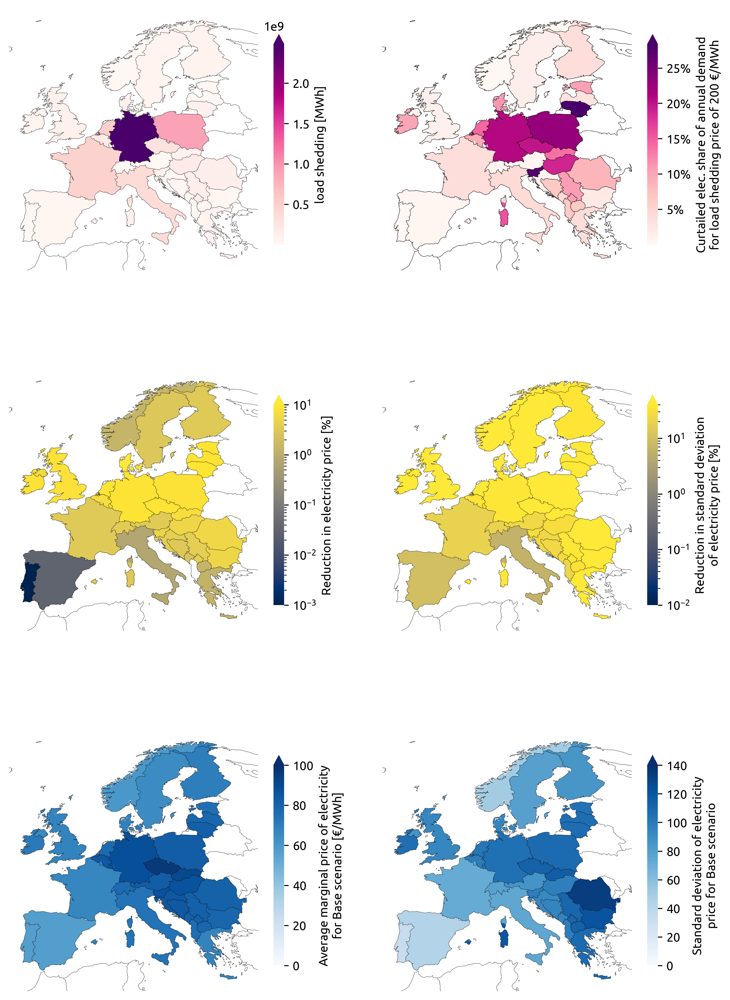

In [70]:

from matplotlib.ticker import MultipleLocator, FuncFormatter, NullFormatter

import cartopy.crs as ccrs
import cartopy
import geopandas as gpd
plt.rc('axes',edgecolor='None')
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'

plt.rcParams.update({"axes.grid" : True, "grid.color" :"white" , "grid.linestyle":"solid"})
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = matplotlib.colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

class MidpointNormalize(matplotlib.colors.Normalize):
    def __init__(self, vmin=None, vmax=None, midpoint=None, clip=False):
        self.midpoint = midpoint
        super().__init__(vmin, vmax, clip)

    def __call__(self, value, clip=None):
        # I'm ignoring masked values and all kinds of edge cases to make a
        # simple example...
        x, y = [self.vmin, self.midpoint, self.vmax], [0, 0.5, 1]
        return np.ma.masked_array(np.interp(value, x, y))
    
    
proj = ccrs.EqualEarth() #ccrs.PlateCarree() 

scenario= 'elec-p200'  ##electricity

fig, axs = plt.subplots(3,2, figsize=(10, 15), subplot_kw={"projection": proj}, dpi=300)
geodf = gpd.read_file('../resources/regions_onshore_elec_s370_37m.geojson').set_index("name")
geodf = geodf.to_crs(proj.proj4_init)


#s=pd.Series(n.generators.p_nom_max.filter(like='rooftop').groupby(n.generators.bus).sum().values
#            ,geodf.index).fillna(0)

## change in el. price and el demand
color_map = 'PRGn'


n_base= pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc')

sector_loads =  carrier_names['elec']
load_i = n_base.loads.index[n_base.loads.carrier.isin(sector_loads)]
load_base= n_base.loads_t.p_set.loc[:, [i for i in load_i if i in 
                                    n_base.loads_t.p_set.columns]].groupby(
                                     [n_base.loads.bus],axis=1).sum().sum(axis=0)


s=pd.Series(df_load_shedding[scenario].values*100, geodf.index)

lim = max(abs(s.min()), abs(s.max()))

geodf.plot(
        ax=axs[0,0],
        column=s,
        # transform=ccrs.PlateCarree(),
        cmap="RdPu", #color_map,
        alpha=1,
        linewidths=0,
        #vmax=-29,
        #vmin=-lim,  
        legend=True,
        legend_kwds={"label": 'load shedding [MWh]', "shrink": 0.7, "extend": "max"},     
    )


## change in el. price/el demand and el. price's standard deviatio
    
s=pd.Series((df_load_shedding[scenario]/load_base.values).values*1, geodf.index)

lim = max(abs(s.min()), abs(s.max()))

plot= geodf.plot(
        ax=axs[0,1],
        column=s,
        # transform=ccrs.PlateCarree(),
        cmap="RdPu", #color_map,
        alpha=1,
        linewidths=0,
        vmax=lim,
        legend=True,
        legend_kwds={"label": 'Curtailed elec. share of annual demand\nfor load shedding price of '+(scenario.split('p')[1]).split('-')[0]+' €/MWh', "shrink": 0.7, "extend": "max"},     
    )

cbar = plot.get_figure().get_axes()[-1]
# Apply percentage formatting to tick labels
formatter = FuncFormatter(lambda x, pos: f"{x*100:.0f}%")
cbar.yaxis.set_major_formatter(formatter) 

axs[0,1].add_feature(cartopy.feature.COASTLINE.with_scale("50m"), linewidth=0.2, zorder=2)
axs[0,1].add_feature(cartopy.feature.BORDERS.with_scale("50m"), linewidth=0.2, zorder=2)


ocean_camp = truncate_colormap(plt.get_cmap('ocean_r'), 0, 0.8)
color_map = ocean_camp 

s=pd.Series(((df_price[scenario].mean()/df_price['elec-Base'].mean())-1).values*100, geodf.index)*-1
lim = max(abs(s.min()), abs(s.max()))

geodf.plot(
        ax=axs[1,0],
        column=s,
        # transform=ccrs.PlateCarree(),
        cmap='cividis', #color_map, #
        alpha=1,
        linewidths=0,
        #vmax=lim,
        #vmin=0,
        norm=matplotlib.colors.LogNorm(vmin=0.001, vmax=10),#MidpointNormalize(midpoint=0),#SymLogNorm(linthresh=0.01, vmax=8, base=4, linscale=2),
        legend=True,
        legend_kwds={"label": 'Reduction in electricity price [%]', "shrink": 0.7, "extend": "max"},     
    )


s=pd.Series((100*(df_price[scenario].std()/df_price['elec-Base'].std())-100).values, geodf.index)*-1
lim = max(abs(s.min()), abs(s.max()))


geodf.plot(
        ax=axs[1,1],
        column=s,
        # transform=ccrs.PlateCarree(),
        cmap='cividis', #color_map, #
        alpha=1,
        linewidths=0,
        #vmax=lim,
        #vmin=0, 
        legend=True,
        norm=matplotlib.colors.LogNorm(vmin=0.01, vmax=40),
        legend_kwds={"label": 'Reduction in standard deviation\nof electricity price [%]', "shrink": 0.7, "extend": "max"},     
    )

## Base scenario

#s=pd.Series(df_price['elec-Base'].mean().values, geodf.index) This is load weighted, so it has different scale. TODO : how to transform?
s= n_base.buses_t.marginal_price[[i for i in n_base.buses.index if 'low voltage' in n_base.buses.carrier[i] ]].mean()
s=pd.Series(s.values, geodf.index)
lim = max(abs(s.min()), abs(s.max()))

geodf.plot(
        ax=axs[2,0],
        column=s,  
        # transform=ccrs.PlateCarree(),
        cmap='Blues',
        alpha=1,
        linewidths=0,
        vmax=100,
        vmin=0, 
        legend=True,
        legend_kwds={"label": 'Average marginal price of electricity\nfor Base scenario [€/MWh]', "shrink": 0.7, "extend": "max"},     
    )

#s=pd.Series(df_price['elec-Base'].std().values, geodf.index)
s= n_base.buses_t.marginal_price[[i for i in n_base.buses.index if 'low voltage' in n_base.buses.carrier[i] ]].std()
s=pd.Series(s.values, geodf.index)
lim = max(abs(s.min()), abs(s.max()))

geodf.plot(
        ax=axs[2,1],
        column=s,
        # transform=ccrs.PlateCarree(),
        cmap='Blues',
        alpha=1,
        linewidths=0,
        vmax=140,
        vmin=0, 
        legend=True,
        legend_kwds={"label": 'Standard deviation of electricity\nprice for Base scenario', "shrink": 0.7, "extend": "max"},     
    )



for ax in axs.flat:
  ax.add_feature(cartopy.feature.COASTLINE.with_scale("50m"), linewidth=0.2, zorder=2)
  ax.add_feature(cartopy.feature.BORDERS.with_scale("50m"), linewidth=0.2, zorder=2)

## Supplementary Figure 16

INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores


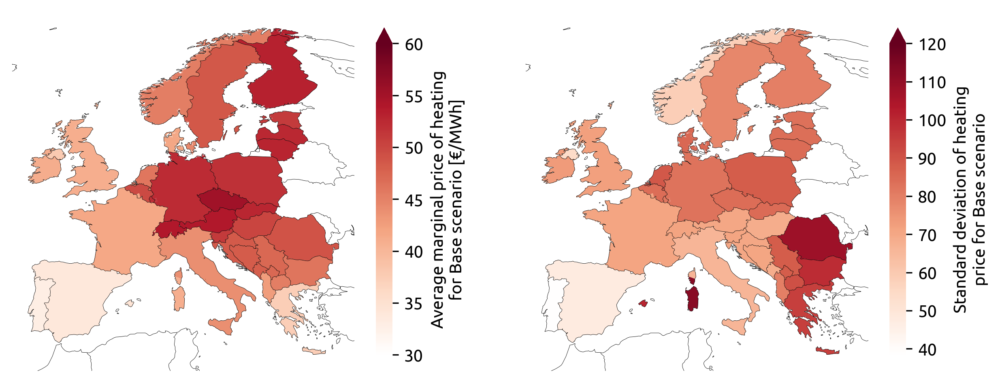

In [124]:

import cartopy.crs as ccrs
import cartopy
import geopandas as gpd
plt.rc('axes',edgecolor='None')
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'

plt.rcParams.update({"axes.grid" : True, "grid.color" :"white" , "grid.linestyle":"solid"})


def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = matplotlib.colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

color_map = truncate_colormap(plt.get_cmap('RdGy_r'), 0.5, 1)
    
    
proj = ccrs.EqualEarth() #ccrs.PlateCarree() 

scenario= 'heat-p200'  ##heating

fig, axs = plt.subplots(1,2, figsize=(10, 5), subplot_kw={"projection": proj}, dpi=300)
geodf = gpd.read_file('../resources/regions_onshore_elec_s370_37m.geojson').set_index("name")
geodf = geodf.to_crs(proj.proj4_init)


n_base= pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc')

sector_loads =  carrier_names['heat']
load_i = n.loads.index[n.loads.carrier.isin(sector_loads)]
load_base= n_base.loads_t.p_set.loc[:, [i for i in load_i if i in 
                                    n_base.loads_t.p_set.columns]].groupby(
                                     [n_base.loads.bus],axis=1).sum().sum(axis=0)


#s=pd.Series(((df_price[scenario].mean()/df_price['heat-Base'].mean())-1).values*100, geodf.index)*-1
s= n_base.buses_t.marginal_price[[i for 
       i in n_base.buses.index if 'heat' in n_base.buses.carrier[i] ]].mean().groupby([n.buses.location,]).mean()
s=pd.Series(s.values, geodf.index)

lim = s.max()

geodf.plot(
        ax=axs[0],
        column=s,
        # transform=ccrs.PlateCarree(),
        cmap=color_map, #color_map, #
        alpha=1,
        linewidths=0,
        vmax=60,
        vmin=30,
        #norm=matplotlib.colors.LogNorm(vmin=0.001, vmax=10),#MidpointNormalize(midpoint=0),#SymLogNorm(linthresh=0.01, vmax=8, base=4, linscale=2),
        legend=True,
        legend_kwds={"label": 'Average marginal price of heating\nfor Base scenario [€/MWh]', "shrink": 0.7, "extend": "max"},     
    )


#s=pd.Series((100*(df_price[scenario].std()/df_price['heat-Base'].std())-100).values, geodf.index)*-1
s= n_base.buses_t.marginal_price[[i for 
       i in n_base.buses.index if 'heat' in n_base.buses.carrier[i] ]].std().groupby([n.buses.location,]).mean()
s=pd.Series(s.values, geodf.index)
lim =s.max()


geodf.plot(
        ax=axs[1],
        column=s,
        # transform=ccrs.PlateCarree(),
        cmap=color_map, #color_map, #
        alpha=1,
        linewidths=0,
        vmax=120,
        #vmin=0, 
        legend=True,
        #norm=matplotlib.colors.LogNorm(vmin=0.01, vmax=40),
        legend_kwds={"label": 'Standard deviation of heating\nprice for Base scenario', "shrink": 0.7, "extend": "max"},     
    )

for ax in axs.flat:
  ax.add_feature(cartopy.feature.COASTLINE.with_scale("50m"), linewidth=0.2, zorder=2)
  ax.add_feature(cartopy.feature.BORDERS.with_scale("50m"), linewidth=0.2, zorder=2)

## Supplementary Figure 21

In [ ]:
## co2 balances


def calculate_supply_energy(n, label, supply_energy):
    """
    Calculate the total energy supply/consuption of each component at the buses
    aggregated by carrier.
    """
    bus_carriers = n.buses.carrier.unique()

    for i in bus_carriers:
        bus_map = n.buses.carrier == i
        bus_map.at[""] = False

        for c in n.iterate_components(n.one_port_components):
            items = c.df.index[c.df.bus.map(bus_map).fillna(False)]

            if len(items) == 0:
                continue

            s = (
                c.pnl.p[items]
                .multiply(n.snapshot_weightings.generators, axis=0)
                .sum()
                .multiply(c.df.loc[items, "sign"])
                .groupby(c.df.loc[items, "carrier"])
                .sum()
            )
            s = pd.concat([s], keys=[c.list_name])
            s = pd.concat([s], keys=[i])

            supply_energy = supply_energy.reindex(s.index.union(supply_energy.index))
            supply_energy.loc[s.index, label] = s

        for c in n.iterate_components(n.branch_components):
            for end in [col[3:] for col in c.df.columns if col[:3] == "bus"]:
                items = c.df.index[c.df[f"bus{str(end)}"].map(bus_map).fillna(False)]
                items = [i for i in items if i in c.pnl["p" + end].columns] ## added: problem with industry methanol buses

                if len(items) == 0:
                    continue
                #print(end,)   
                s = (-1) * c.pnl["p" + end][items].multiply(
                    n.snapshot_weightings.generators, axis=0
                ).sum().groupby(c.df.loc[items, "carrier"]).sum()
                s.index = s.index + end
                s = pd.concat([s], keys=[c.list_name])
                s = pd.concat([s], keys=[i])

                supply_energy = supply_energy.reindex(
                    s.index.union(supply_energy.index)
                )

                supply_energy.loc[s.index, label] = s

    return supply_energy

INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores


490.5553860864498 8.379664729679744e-08 100.0
490.5553860864498 8.379664729679744e-08 100.0


INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIelecIp40_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores


483.8726609143237 8.755413955977577e-08 104.48406038211739
483.8726609143237 8.755413955977577e-08 104.48406038211739


INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIheatIp40_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores


454.50783835422595 9.140062758651999e-08 109.07432520872845
454.50783835422595 9.140062758651999e-08 109.07432520872845


INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIinduIp40_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores


447.1896250688555 8.573346592422835e-08 102.31133188487951
447.1896250688555 8.573346592422835e-08 102.31133188487951


INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmItranIp40_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores


485.01092218585745 8.586233185922817e-08 102.46511600292828
485.01092218585745 8.586233185922817e-08 102.46511600292828


INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIshipIp40_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores


457.5182909715862 7.951117559223962e-08 94.88586734338044
457.5182909715862 7.951117559223962e-08 94.88586734338044


INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIaviaIp40_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores


434.7632379989241 7.617837415135243e-08 90.90861819511463
434.7632379989241 7.617837415135243e-08 90.90861819511463


INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIagriIp40_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores


482.6345863344978 8.3406013790037e-08 99.5338315799475
482.6345863344978 8.3406013790037e-08 99.5338315799475


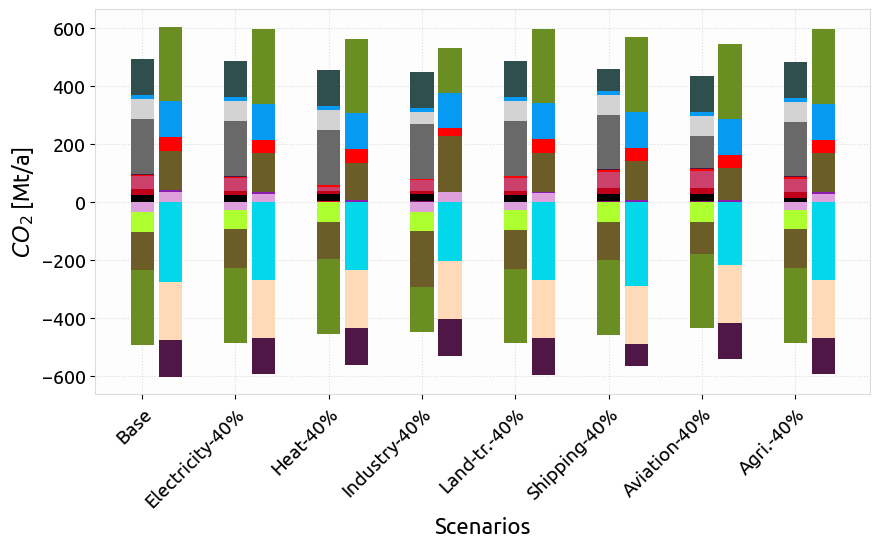

In [30]:
fig, axs = plt.subplots(figsize=(10, 5), sharey=True)
index=np.arange(len(main_scen.keys()))*2
bar_width=0.5
legend= []


tech_colors_temp={
    'agriculture machinery oil':'black',
    'gas for industry CC':'red',
    'co2 sequestered':'peachpuff',
    'process emissions':'#82cafc',
    'process emissions CC': '#069af3',
    'solid biomass for industry CC': 'olivedrab',

}

list1=[]
list2=[]
list3=[]
list4=[]
for idx, scen in enumerate(main_scen.keys()):
  if main_scen[scen][1]=='Base':
    scenario=scen
  else: 
    scenario=scen.format(str('p40')) ## last scenario 
  
    
  n=pypsa.Network(scenario)
  label= 'energy'
  supply_energy=pd.DataFrame({})
    
  assign_carriers(n)
  assign_locations(n)

  balances_df= calculate_supply_energy(n, label, supply_energy)
  total_emitted =0


  for num, carrier in enumerate(['co2', 'co2 stored']): 
    temp= balances_df.loc[[carrier]]
    temp= temp.groupby(temp.index.get_level_values(2)).sum()
    new_index= [i[:-1] if i[-1] in ['0','1','2','3','4'] and i!='co2' else i for i in temp.index ]
    temp.index= new_index
    temp= temp.groupby(temp.index).sum()/1e6 ## MT CO2

    for ix in temp.index :   
                
                if 'biomass' in ix and 'CHP' in ix :
                  if  'CC' in ix:  
                    temp =temp.rename(index={ix:'biomass CHP CC',})
                  else: 
                    temp =temp.rename(index={ix:'biomass CHP',})
                if 'biomass' in ix and 'boiler' in ix :
                    temp =temp.rename(index={ix:'biomass boiler',})
                if 'gas' in ix and 'CHP' in ix  :
                  if  'CC' in ix:  
                    temp =temp.rename(index={ix:'gas CHP CC',})
                  else: 
                    temp =temp.rename(index={ix:'gas CHP',})
                if 'gas' in ix and 'boiler' in ix :
                    temp =temp.rename(index={ix:'gas boiler',})
                    
    temp= temp.groupby(temp.index).sum()                    
    #temp= temp.drop(labels=['co2'])  ## very small, technically should be zero because of co2 store cyclic constraint

    bottom_p=0
    bottom_n=0                        
    for k, component in enumerate(temp.index):
        #if idx==0: print(component)
        color = tech_colors[component] if component not in tech_colors_temp.keys() else tech_colors_temp[component]
        if temp.loc[component].sum()>2 :   ##>2
           if idx==0:
             list1.append(component) if num==0 else list2.append(component)
           if num==0: 
               total_emitted+= temp.loc[component].sum() 
               
           axs.bar(index[idx]+num*0.6, temp.loc[component] 
                                   , bar_width, 
                                   bottom=bottom_p,
                                   color=color, zorder=3)
           bottom_p+=temp.loc[component] 
        else: 
          if  temp.loc[component].sum()<-2 :
            if idx==0:
              list3.append(component) if num==0 else list4.append(component)

            axs.bar(index[idx]+num*0.6, temp.loc[component] 
                                   , bar_width, 
                                   bottom=bottom_n,
                                   color=color, zorder=3)
            bottom_n+=temp.loc[component]                                 
    print(total_emitted, total_emitted/n.loads_t.p.sum().sum(), (total_emitted/n.loads_t.p.sum().sum())*100/8.379664729679744e-08)                        
    added_labels= [i for i in temp.index if i not in legend]         
    legend= legend + added_labels





labels = ['Base', 'Electricity-40%', 'Heat-40%','Industry-40%','Land-tr.-40%','Shipping-40%', 'Aviation-40%', 'Agri.-40%',]
xlabels = [i for i in labels] # carrier_names.keys()]
axs.set_xticks((index))    
axs.set_xticklabels(xlabels,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')
axs.grid(axis = 'y' , color='gainsboro', zorder=0)
axs.set_ylabel("$CO_{2}$ [Mt/a]",fontsize=16,)
axs.set_xlabel("Scenarios",fontsize=16,)
axs.tick_params(axis='y', labelsize=14)

lis1=list1.reverse()
lis2=list2.reverse()
for counter, legend_keys in enumerate([list1,list2,list3,list4]): 
  legend_manual=[]
  for  key in (legend_keys):
    color = tech_colors[key] if key not in tech_colors_temp.keys() else tech_colors_temp[key]
    legend_manual.append(mpatches.Patch(color=color, label=key))
  legend1=plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(counter*0.4, -0.5),ncol=1,
          fontsize=12,frameon=False) 
  plt.gca().add_artist(legend1)  

## Supplementary figure 22

INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores
INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIaviaIp05_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores
INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIaviaIp10_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores
INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIaviaIp20_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores
INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIaviaIp30-lowtol_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage

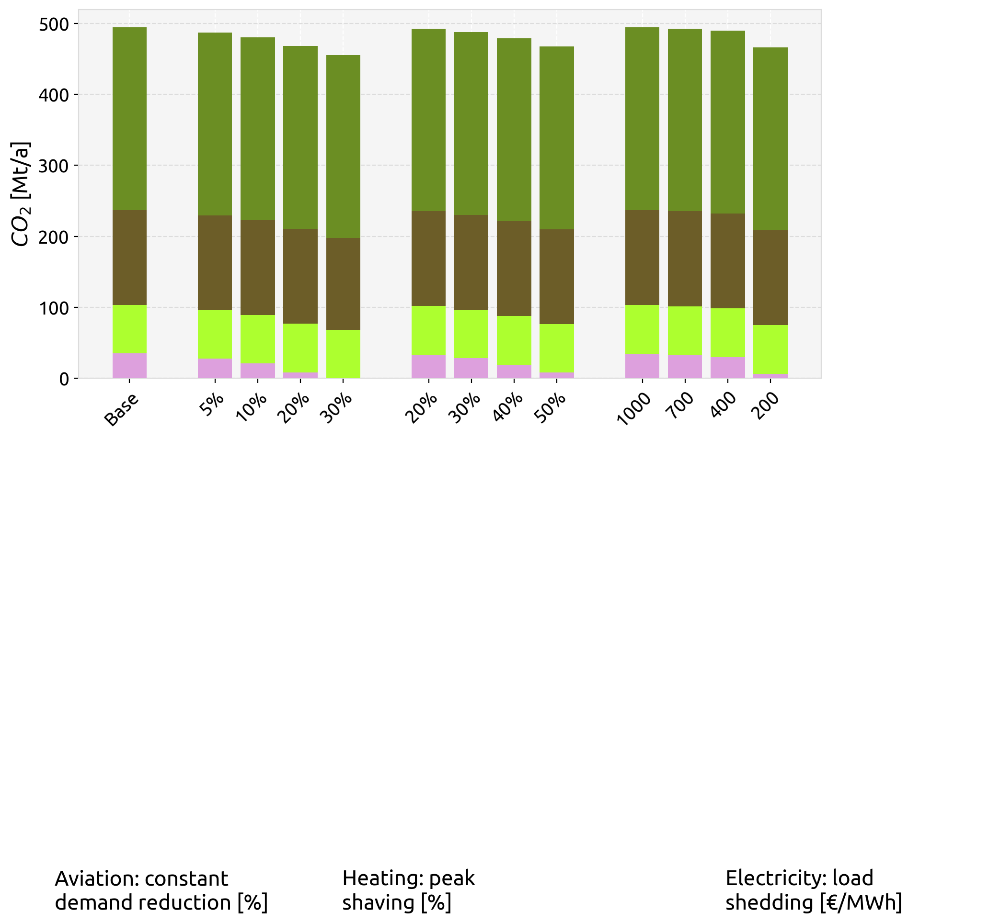

In [119]:
fig, axs = plt.subplots(figsize=(10, 5), sharey=True, dpi=200)
bar_width=0.2
legend= []


tech_colors_temp={
    'agriculture machinery oil':'black',
    'gas for industry CC':'red',
    'co2 sequestered':'peachpuff',
    'process emissions':'#82cafc',
    'process emissions CC': '#069af3',
    'solid biomass for industry CC': 'olivedrab',

}
main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':[[''],'Base']   ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-dmIaviaI{}_2050.nc':[['p05','p10','p20','p30-lowtol',],'Aviation demand reduction']  ,
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-pdemIheatI{}_2050.nc':[['p20','p30','p40','p50'],'Heat peak shaving']  ,  ## p90 available
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2-ldemIelecI{}_2050.nc':[['p1000','p700-lowtol','p400','p200-lowtol'],'Electricty load shedding']  ,  ## p90 available
}

list1=[]
list2=[]
list3=[]
list4=[]
index=[0, 0.5, 1.75 ,3]

for idx, scen in enumerate(main_scen.keys()):
    for j, reduction in  enumerate(main_scen[scen][0]): 
        if main_scen[scen][1]=='Base':
             scenario=scen
        else: 
             scenario=scen.format(reduction) 

    
        n=pypsa.Network(scenario)
        label= 'energy'
        supply_energy=pd.DataFrame({})
    
        assign_carriers(n)
        assign_locations(n)

        balances_df= calculate_supply_energy(n, label, supply_energy)


        for num, carrier in enumerate(['co2']): 
          temp= balances_df.loc[[carrier]]
          temp= temp.groupby(temp.index.get_level_values(2)).sum()
          new_index= [i[:-1] if i[-1] in ['0','1','2','3','4'] and i!='co2' else i for i in temp.index ]
          temp.index= new_index
          temp= temp.groupby(temp.index).sum()/1e6 ## MT CO2

          for ix in temp.index :   
                
                if 'biomass' in ix and 'CHP' in ix :
                  if  'CC' in ix:  
                    temp =temp.rename(index={ix:'biomass CHP CC',})
                  else: 
                    temp =temp.rename(index={ix:'biomass CHP',})
                if 'biomass' in ix and 'boiler' in ix :
                    temp =temp.rename(index={ix:'biomass boiler',})
                if 'gas' in ix and 'CHP' in ix  :
                  if  'CC' in ix:  
                    temp =temp.rename(index={ix:'gas CHP CC',})
                  else: 
                    temp =temp.rename(index={ix:'gas CHP',})
                if 'gas' in ix and 'boiler' in ix :
                    temp =temp.rename(index={ix:'gas boiler',})
                    
          temp= temp.groupby(temp.index).sum()                    
             #temp= temp.drop(labels=['co2'])  ## very small, technically should be zero because of co2 store cyclic constraint

          bottom_p=0
          bottom_n=0                        
          for k, component in enumerate(temp.index):
           #if idx==0: print(component)
           color = tech_colors[component] if component not in tech_colors_temp.keys() else tech_colors_temp[component]
           if temp.loc[component].sum()<-2 :   ##>2
             if idx==0:
                list1.append(component) if num==0 else list2.append(component)
             axs.bar(index[idx]+j*0.25, temp.loc[component] *-1
                                   , bar_width, 
                                   bottom=bottom_p,
                                   color=color, zorder=3)
             bottom_p+=temp.loc[component] *-1
                              

          added_labels= [i for i in temp.index if i not in legend]         
          legend= legend + added_labels





xlabels = ['Base', '5%','10%','20%','30%', '20%', '30%','40%','50%' ,'1000', '700','400','200']
#xlabels = [i for i in labels] # carrier_names.keys()]

for ax in [axs]:
    ax.set_xticks([0, 0.5, 0.5+0.25, 0.5+0.5, 0.5+0.75, 1.75, 
                   1.75+0.25, 1.75+0.5, 1.75+0.75, 3, 3+0.25,3+0.5,3+0.75])    
    ax.set_xticklabels(xlabels,fontsize=14, rotation=45,ha='right', rotation_mode='anchor')
    ax.grid(axis = 'y' , color='gainsboro', zorder=0)
    ax.set_ylabel("$CO_{2}$ [Mt/a]",fontsize=16,)
    ax.tick_params(axis='y', labelsize=14)

fig.text(0.1,-1, 'Aviation: constant\ndemand reduction [%]', fontsize=16,)
fig.text(0.4,-1,'Heating: peak\nshaving [%]', fontsize=16,)
fig.text(0.8,-1,'Electricity: load\nshedding [€/MWh]', fontsize=16,)

lis1=list1.reverse()
lis2=list2.reverse()
for counter, legend_keys in enumerate([list1,list2,list3,list4]): 
  legend_manual=[]
  for  key in (legend_keys):
    color = tech_colors[key] if key not in tech_colors_temp.keys() else tech_colors_temp[key]
    legend_manual.append(mpatches.Patch(color=color, label=key))
  legend1=plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(counter*0.4, -0.5),ncol=1,
          fontsize=12,frameon=False) 
#plt.gca().add_artist(legend1)  

## Figure 1

In [11]:
import logging
import sys

import numpy as np
import pandas as pd
import pypsa
#from prepare_sector_network import prepare_costs

idx = pd.IndexSlice
logger = logging.getLogger(__name__)
opt_name = {"Store": "e", "Line": "s", "Transformer": "s"}


def assign_carriers(n):
    if "carrier" not in n.lines:
        n.lines["carrier"] = "AC"


def assign_locations(n):
    for c in n.iterate_components(n.one_port_components | n.branch_components):
        ifind = pd.Series(c.df.index.str.find(" ", start=4), c.df.index)
        for i in ifind.unique():
            names = ifind.index[ifind == i]
            c.df.loc[names, "location"] = "" if i == -1 else names.str[:i]

def calculate_nodal_supply_energy(n, label, nodal_supply_energy):
    """
    Calculate the total energy supply/consumption of each component at the buses
    aggregated by carrier and node.
    """

    bus_carriers = n.buses.carrier.unique()

    for i in bus_carriers:
        bus_map = n.buses.carrier == i
        bus_map.at[""] = False

        for c in n.iterate_components(n.one_port_components):
            items = c.df.index[c.df.bus.map(bus_map).fillna(False)]

            if len(items) == 0:
                continue

            s = (
                pd.concat([
                    (
                        c.pnl.p[items]
                        .multiply(n.snapshot_weightings.generators, axis=0)
                        .sum()
                        .multiply(c.df.loc[items, "sign"])
                    ),
                    c.df.loc[items][["bus", "carrier"]]
                ], axis=1)
                .groupby(by=["bus", "carrier"])
                .sum()[0]
            )
            s = pd.concat([s], keys=[c.list_name])
            s = pd.concat([s], keys=[i])

            nodal_supply_energy = nodal_supply_energy.reindex(s.index.union(nodal_supply_energy.index))
            nodal_supply_energy.loc[s.index, label] = s

        for c in n.iterate_components(n.branch_components):
            for end in [col[3:] for col in c.df.columns if col[:3] == "bus"]:
                items = c.df.index[c.df["bus" + str(end)].map(bus_map).fillna(False)]

                if (len(items) == 0) or c.pnl["p" + end].empty:
                    continue

                s = (
                    pd.concat([
                        (
                            (-1) * c.pnl["p" + end][[i for i in items if i in c.pnl["p" + end].columns]]#[items]
                            .multiply(n.snapshot_weightings.generators, axis=0)
                            .sum()
                        ),
                        c.df.loc[items][["bus0", "carrier"]]
                    ], axis=1)
                    .groupby(by=["bus0", "carrier"])
                    .sum()[0]
                )

                s.index = s.index.map(lambda x: (x[0], x[1] + end))
                s = pd.concat([s], keys=[c.list_name])
                s = pd.concat([s], keys=[i])

                nodal_supply_energy = nodal_supply_energy.reindex(
                    s.index.union(nodal_supply_energy.index)
                )

                nodal_supply_energy.loc[s.index, label] = s

    return nodal_supply_energy            
            
def calculate_supply_energy(n, label, supply_energy):
    """
    Calculate the total energy supply/consuption of each component at the buses
    aggregated by carrier.
    """
    bus_carriers = n.buses.carrier.unique()

    for i in bus_carriers:
        bus_map = n.buses.carrier == i
        bus_map.at[""] = False

        for c in n.iterate_components(n.one_port_components):
            items = c.df.index[c.df.bus.map(bus_map).fillna(False)]

            if len(items) == 0:
                continue

            s = (
                c.pnl.p[items]
                .multiply(n.snapshot_weightings.generators, axis=0)
                .sum()
                .multiply(c.df.loc[items, "sign"])
                .groupby(c.df.loc[items, "carrier"])
                .sum()
            )
            s = pd.concat([s], keys=[c.list_name])
            s = pd.concat([s], keys=[i])

            supply_energy = supply_energy.reindex(s.index.union(supply_energy.index))
            supply_energy.loc[s.index, label] = s

        for c in n.iterate_components(n.branch_components):
            for end in [col[3:] for col in c.df.columns if col[:3] == "bus"]:
                items = c.df.index[c.df[f"bus{str(end)}"].map(bus_map).fillna(False) ]

                
                if len(items) == 0:
                    continue
                    
                for item in items:   ## this fixes a bug where buses with very small co2 production have no p2
                    try: 
                       c.pnl["p" + end][item]
                    except:
                      items=items.drop(item)      

                s = (-1) * c.pnl["p" + end][items].multiply(
                    n.snapshot_weightings.generators, axis=0
                ).sum().groupby(c.df.loc[items, "carrier"]).sum()
                s.index = s.index + end
                s = pd.concat([s], keys=[c.list_name])
                s = pd.concat([s], keys=[i])

                supply_energy = supply_energy.reindex(
                    s.index.union(supply_energy.index)
                )

                supply_energy.loc[s.index, label] = s

    return supply_energy


def calculate_energy(n, label, energy):
    for c in n.iterate_components(n.one_port_components | n.branch_components):
        if c.name in n.one_port_components:
            c_energies = (
                c.pnl.p.multiply(n.snapshot_weightings.generators, axis=0)
                .sum()
                .multiply(c.df.sign)
                .groupby(c.df.carrier)
                .sum()
            )
        else:
            c_energies = pd.Series(0.0, c.df.carrier.unique())
            for port in [col[3:] for col in c.df.columns if col[:3] == "bus"]:
                totals = (
                    c.pnl["p" + port]
                    .multiply(n.snapshot_weightings.generators, axis=0)
                    .sum()
                )
                # remove values where bus is missing (bug in nomopyomo)
                #no_bus = c.df.index[c.df["bus" + port] == ""]
                #totals.loc[no_bus] = float(
                #    n.component_attrs[c.name].loc["p" + port, "default"]
                #)
                #c_energies -= totals.groupby(c.df.carrier).sum()

        c_energies = pd.concat([c_energies], keys=[c.list_name])

        energy = energy.reindex(c_energies.index.union(energy.index))

        energy.loc[c_energies.index, label] = c_energies

    return energy

In [12]:
rename={'battery':'Battery storage','battery charger':'Battery storage','battery discharger':'Battery storage',
                          'home battery':'Home battery storage','home battery charger':'Home battery storage','home battery discharger':'Home battery storage',                                                       
                           'offwind-ac':'Offshore wind','offwind':'Offshore wind','offwind-dc':'Offshore wind', 'onwind':'Onshore wind',
                          'AC':'Transmission lines'  , 'DC':'Transmission lines','ror': 'Run of river',
                          'hydro':'Hydroelectricity' , 'nuclear':'Nuclear','uranium':'Nuclear',
                          'solar':'Solar utility', 'solar rooftop':'Solar rooftop',
                          'electricity distribution grid' : 'Electricity distribution grid',
                           'PHS' : 'Pumped hydro storage', 'H2':'H2 storage',
                           'SMR':'Power to gas'  , 'SMR CC':'Power to gas','oil': 'Oil and gas to power/heat',
                           'Fischer-Tropsch':'Power to liquid', 'methanolisation':'Power to liquid',
                           'Sabatier':'Power to gas', 'helmeth':'Power to gas', 'coal' : 'Coal', 'lignite' :'Coal',
                           'Li ion':'EV battery' ,    "solar inv": "Solar utility",
                          "solar-hsat": "Solar-HSAT",
                          "solar-hsat inv": "Solar-HSAT",
                          "solar-delta": "Solar-Delta",
                          "solar-delta20": "Solar-Delta",

                          }


In [13]:
#df_countries_energy.index
demand = ['agriculture machinery oil', 
       'urban decentral heat',
        'electricity',
       'agriculture electricity', 'urban central heat', 'rural heat',
      'naphtha for industry',
       'DAC','low-temperature heat for industry', 
       'solid biomass for industry', 
       'H2 for industry',
        'industry electricity',
       'agriculture heat', 
       'shipping methanol',
       'land transport EV', 
       'kerosene for aviation','gas for industry', 'gas for industry CC',]


In [14]:

main_scen= {
    'main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc':'Base'  ,
}

n=pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.0__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc')

INFO:pypsa.io:Imported network elec_s370_37m_lv1.0__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores


In [ ]:
## for demand
label= 'energy'
countries=set([i[:2] for i in n.buses.index if n.buses.carrier[i]=='AC'])

iterables = [main_scen.values(), countries]

for i, scenario in enumerate(main_scen.keys()):
    n=pypsa.Network(scenario)
    nodal_energy=pd.DataFrame({})
    
    assign_carriers(n)
    assign_locations(n)
    df= calculate_nodal_supply_energy(n, label, nodal_energy)
    #df=df.drop([i for i in (df[df.index.get_level_values(1)=='stores']).index.get_level_values(0)]) ## not really usefull
    df=df[df.index.get_level_values(1)=='loads'] ##comment out for production
    df=df.rename(rename, level=3)
    for ix in df.index.get_level_values(3) :   
                if 'resistive heater' in ix or 'heat pump' in ix :
                    df=df.rename({ix : 'Power to heat',})
                if 'biogas' in ix :df=df.rename({ix:'Biogas',})
                if  any(w in ix for w in ['boiler','CHP', 'OCGT', 'CCGT'])  :
                    df=df.rename({ix:'Oil and gas to power/heat',})
                #if 'boiler' in ix :df=df.rename({ix:'Oil and gas to heat',})
                #if 'CHP' in ix :df=df.rename({ix:'Oil and gas to power/heat',})
                if 'biomass' in ix :df=df.rename({ix:'Biomass',})
                if 'solar thermal' in ix :df=df.rename({ix:'Solar thermal',})
                if 'water tank' in ix :df=df.rename({ix:'Heat storage',})
                        
    
    for j,country in enumerate(countries):                
      df_temp=df[df.index.get_level_values(2).str.contains(country)]
      index_1 =df_temp.groupby(df_temp.index.get_level_values(3)).sum().index
      #index_list=set(list(index_1)+list(n.loads.carrier.unique()))

      if (i+j)==0:    df_countries_energy= pd.DataFrame(index= list(index_1),
                                columns=pd.MultiIndex.from_product(iterables, names=["scenario", "country"]))

      df_countries_energy.loc[:, (main_scen[scenario],country)] = df_temp.groupby(df_temp.index.get_level_values(3)).sum()['energy']         
      
      #for carrier in n.loads.carrier.unique():
       # if carrier not in index_1 :
        #    df_countries_energy.loc[carrier, (main_scen[scenario],country)] = (n.loads_t.p.loc[:,
         #   [i for i in n.loads.index if n.loads.carrier[i]==carrier]].filter(like=country).sum().sum())
            
df_countries_energy=(-1)*df_countries_energy.fillna(0)


In [15]:

tech_colors_= {
    'gas for industry' : 'grey' ,#'darkred',
    'industry biomass' : 'olive',
    'industry methanol' :"#83d6d5", #'#4f1745',
    "industry": 'black',
    'agriculture machinery oil': "black", # "#606602",
    'kerosene for aviation': "dimgrey",
    'naphtha for industry': "lightgray",
    'shipping methanol': '#468c8b' , #"darkslategrey",
    'rural heat': '#ff5c5c',
    'urban central heat':'#a33c3c',
     'urban decentral heat': '#d15959',
    'low-temperature heat for industry': '#8f2727',
    'agriculture heat':"crimson", # '#d9a5a5',
    'H2 for industry': "purple",# "#f073da",
    'H2 for shipping': "#ebaee0",
    'agriculture electricity': "#494778", # '#494778',
    'solid biomass for industry': '#7a6d26',
    'solid biomass for industry CC': '#7a6d26',
    'land transport EV': "#f9d002", #'#baf238',
    "electricity": "#110d63", #"#f9d002",
    "industry electricity": "#01386a",# "#3b638c", #"#2d2a66", #"dimgrey",
}

In [32]:

tech_colors_= {
     "industry electricity": "#01386a",# "#3b638c", #"#2d2a66", #"dimgrey",
    'gas for industry' : '#77a1b5' ,#'darkred',
    'naphtha for industry': "#748b97",
    'solid biomass for industry': '#08787f',
    'industry methanol' :"#95d0fc", #'#4f1745',
    'low-temperature heat for industry': '#29465b',
    'H2 for industry': "#0165fc",# "#f073da",
    
    'rural heat': '#ff5c5c',
    'urban central heat':'#a33c3c',
    'urban decentral heat': '#d15959',
    
    'shipping methanol': 'purple' , #"darkslategrey",
    'kerosene for aviation': "#4b006e",

    'agriculture electricity': "#b5ce08", # '#494778',
    'agriculture heat':"#8fae22", # '#d9a5a5',
    'agriculture machinery oil': "#657432", # "#606602",

    'land transport EV': "#f9d002", #'#baf238',
    "electricity": "#110d63", #"#f9d002",
}

/home/parisr/miniconda3/envs/pypsa-eur-masters/lib/python3.10/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


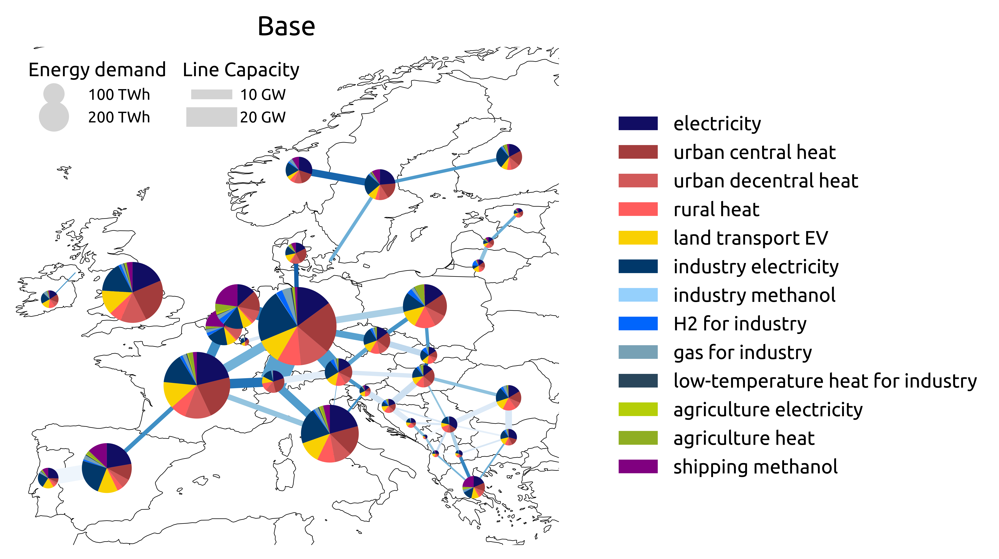

In [218]:
##Base for old networks (less heat demand)
from pypsa.plot import projected_area_factor
from matplotlib.patches import Circle, Ellipse, Patch
from matplotlib.legend_handler import HandlerPatch
from matplotlib.lines import Line2D
import cartopy.crs as ccrs
import cartopy
import geopandas as gpd
import logging
logger = logging.getLogger()
logger.setLevel(logging.CRITICAL)

    
plt.rcParams['figure.dpi'] = 1000
plt.rc('font',family='Ubuntu')
epsg = 3035
nodes = gpd.read_file('../resources/main_runs/regions_onshore_elec_s370_37m.geojson').set_index("name")
nodes["Area"] = nodes.to_crs(epsg=epsg).area.div(1e6)
    
fig,axs = plt.subplots(figsize=(5,5) , subplot_kw={"projection":ccrs.PlateCarree()})   #or  ccrs.Orthographic() .Mercator
fig.subplots_adjust(wspace=0.1)

base_color='powderblue'
line_width_factor=10 

node_names= list(nodes.index)

line_width_factor=2
bus_size_factor= 200
#toplot= df_countries_energy.loc[[i for i in df_countries_energy.index if i in demand],:].T.stack()
labels = [ 'electricity',
 'urban central heat',
 'urban decentral heat',
 'rural heat',
 'land transport EV',
 'industry electricity',
 'industry methanol',
 'H2 for industry',
 'gas for industry',
 'low-temperature heat for industry',
 'agriculture electricity',
 'agriculture heat',
 'shipping methanol',
         ]

toplot= df_countries_energy.reindex(reversed(labels)).T.stack()
  #.loc[[i for i in df_countries_energy.index if 'process' not in i],:]

for c, scenario in enumerate(toplot.index.get_level_values(0).unique()):
  i = int(c/2)
  j= c%2
  shares= toplot[scenario]/1e6    ##TWh
  shares.rename(index=lambda x: [i for i in node_names if x in i][0], level=0, inplace=True)

  loading = (n.lines_t.p0.abs().mean().sort_index()/(n.lines.s_nom_opt*n.lines.s_max_pu).sort_index()).fillna(0.)    
    
  #shares.rename(index=lambda x: x.replace("FR1 0","FR1 3"), level=0, inplace=True)
  #shares.rename(index=lambda x: x.replace("DE1 0","DE1 2"), level=0, inplace=True)
  shares.rename(index=lambda x: x.replace("IT6 0","IT0 0"), level=0, inplace=True)
  shares.rename(index=lambda x: x.replace("ES3 0","ES0 0"), level=0, inplace=True) #11
  #shares.rename(index=lambda x: x.replace("GB4 0","GB5 0"), level=0, inplace=True)
  #shares.rename(index=lambda x: x.replace("NL0 0","NL1 1"), level=0, inplace=True)
  #shares.rename(index=lambda x: x.replace("CZ1 0","CZ1 1"), level=0, inplace=True)

  n.plot (ax=axs,
        bus_colors= tech_colors_, #res, #{'p_nom_max':base_color,'p_nom_opt':carriers[carrier][0]},
        branch_components=["Line"],
        line_widths=n.lines.s_nom_opt/(1e3*line_width_factor),  #GW
        line_colors=loading,
        geomap=True,
        boundaries=[-10.53, 28.8, 35, 70],
        line_cmap='Blues',
        bus_sizes=shares/bus_size_factor)  #
    
  axs.axis('off')
  axs.set_extent([-10.53, 28.8, 35, 70])
  axs.set_title(scenario, fontsize= 14)

    
#axs[0].set_title('transition w new solar', fontsize=20)    
#axs[1].set_title('transition w new solar : 100% suff.',fontsize=20)   


sizes = [100, 200]
labels_ = [f"{s} TWh" for s in sizes]
add_legend_circles(
             axs,
             sizes,
             labels_,
             scale=bus_size_factor,
             srid=n.srid,
             legend_kw=dict(title="Energy demand", loc="upper left",fontsize=8, frameon=False),
             patch_kw=dict(facecolor="lightgrey",),
         )

sizes = [10, 20]
labels_ = [f"{s} GW" for s in sizes]
add_legend_lines(
        axs,
        sizes,
        labels_,
        scale=line_width_factor ,
        legend_kw=dict(title="Line Capacity", bbox_to_anchor=(0.55, 1),fontsize=8,frameon=False),
        patch_kw=dict(color="lightgrey"),
    )

#labels= set(shares.index.get_level_values(1))


colors = [tech_colors_[c] for c in labels]

add_legend_patch(
        axs,
        colors,
        labels,
        patch_kw=dict(edgecolor="None"),
        legend_kw=dict(loc='right',bbox_to_anchor=(1.8, 0.5), ncol=1,fontsize=10,frameon=False),)


#cmap = plt.get_cmap('Blues') 
#norm = matplotlib.colors.Normalize(vmin=loading.min(), vmax=loading.max())
#cbar= fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=axs[1,1], fraction=0.02, pad=0.5)
#cbar.ax.tick_params(labelsize=12)
#cbar.ax.set_title('Line loading')
#plt.savefig("potential_maps.png", dpi=1000)    

In [27]:
to_plot_constant

carrier
electricity                               0.000000
urban central heat                        0.000000
urban decentral heat                      0.000000
rural heat                                0.000000
land transport EV                         0.000000
industry electricity                 192979.452055
solid biomass for industry            80200.913242
naphtha for industry                  35541.095890
gas for industry                      27128.995434
H2 for industry                       21430.365297
low-temperature heat for industry      5904.109589
industry methanol                      1011.415525
agriculture electricity                5714.493104
agriculture heat                      22343.389422
agriculture machinery oil             10497.432360
kerosene for aviation                 83871.621355
shipping methanol                     57065.596856
Name: p_set, dtype: float64

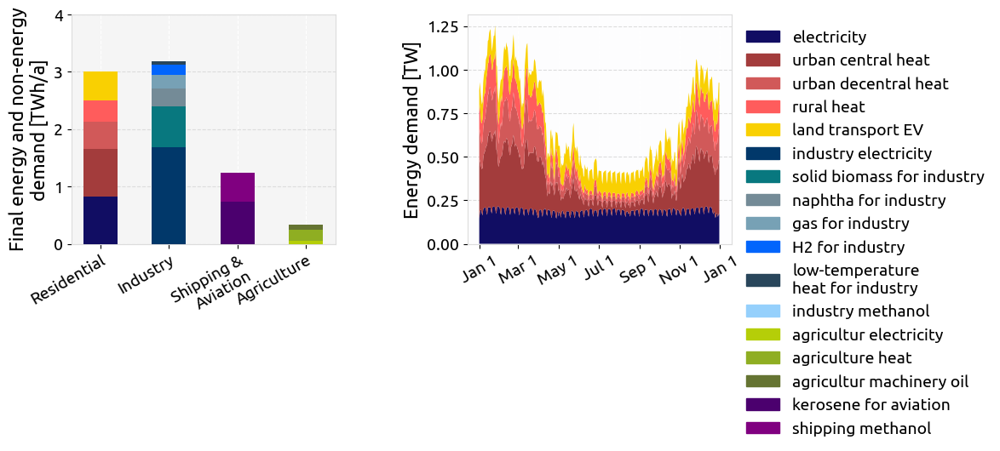

In [31]:
from matplotlib.dates import DateFormatter

fig,axs = plt.subplots(1,2 ,figsize=(10,3.5) , ) #10,5  #or  ccrs.Orthographic() .Mercator
fig.subplots_adjust(wspace=0.5)

bar_width=0.5
index=np.arange(4) 

ordering = [ 'electricity',
 'urban central heat',
 'urban decentral heat',
 'rural heat',
 'land transport EV',
 'industry electricity',
  'solid biomass for industry',
 'naphtha for industry',
 'gas for industry',
 'H2 for industry',
 'low-temperature heat for industry',
 'industry methanol',
 'agriculture electricity',
 'agriculture heat',
 'agriculture machinery oil',
 'kerosene for aviation',
 'shipping methanol',
         ]

df_load = n.loads_t.p.sum().groupby(n.loads.carrier).sum() * (8760/len(n.snapshots)) # hourly resolution
df_load_time = n.loads_t.p.groupby(n.loads.carrier,axis =1).sum()

to_plot_constant= n.loads.p_set.groupby(n.loads.carrier).sum().reindex(ordering) ##list of constant demands
to_plot_variable= [] ##list of variable demands


bottom= 0
bottom_1= 0
bottom_2 =0
bottom_3=0
for color, component in enumerate(to_plot_constant.index):
    if  to_plot_constant.loc[component] != 0:
            if 'industry' in  component:
                  axs[0].bar(index[1], df_load.loc[component]/1e9 ##PWh
                           , bar_width, bottom=bottom,
                           color=tech_colors_[component], zorder=3, )
                  bottom+=df_load.loc[component]/1e9              #PWh
                
            elif 'agriculture' in  component:
                  axs[0].bar(index[3], df_load.loc[component]/1e9 ##PWh
                           , bar_width, bottom=bottom_1,
                           color=tech_colors_[component], zorder=3, )
                  bottom_1+=df_load.loc[component]/1e9
                
            else :     
                  axs[0].bar(index[2], df_load.loc[component]/1e9 ##PWh
                           , bar_width, bottom=bottom_2,
                           color=tech_colors_[component], zorder=3, )
                  bottom_2+=df_load.loc[component]/1e9
                
    else:
        
        to_plot_variable.append(component)
        axs[0].bar(index[0],  df_load_time[component].sum()/1e9 ##PWh
                           , bar_width, bottom=bottom_3,
                           color=tech_colors_[component], zorder=3, )
        bottom_3+=df_load_time[component].sum()/1e9
                
xlabels = [i for i in['Residential', 'Industry', 'Shipping &\nAviation' , 'Agriculture',]]
axs[0].set_xticks((index))    
axs[0].set_yticks([0,1,2,3,4])    
axs[0].set_xticklabels(xlabels,fontsize=14, rotation=30, ha='right', rotation_mode='anchor')
axs[0].tick_params(axis='y', labelsize=14)    
axs[0].set_ylabel('Final energy and non-energy\ndemand [TWh/a]', fontsize=16)   
axs[0].grid(axis = 'y' , color='gainsboro', linestyle='dashed', zorder=0)
axs[0].set_facecolor("whitesmoke")


#axs[1].stackplot(df_load_time.index.values , df_load_time[to_plot_variable].T/1e6 ,
#                 colors= [tech_colors_[i] for i  in to_plot_variable]) 

axs[1].stackplot(df_load_time[to_plot_variable].resample('D').mean().index ,
                 df_load_time[to_plot_variable].resample('D').mean().T/1e6 ,
                 colors= [tech_colors_[i] for i  in to_plot_variable], zorder=3)

axs[1].xaxis.set_major_formatter(DateFormatter('%b %-d'))
axs[1].tick_params(axis='x', labelsize=14, labelrotation=30) #, ha='right')    
axs[1].tick_params(axis='y', labelsize=14, )    
axs[1].set_ylabel('Energy demand [TW]', fontsize=16)    
axs[1].grid(axis = 'y' , color='gainsboro', linestyle='dashed', zorder=0)
"""
manual_labels = [ 'electricity',
 'urban central\nheat',
 'urban decentral\nheat',
 'rural heat',
 'land transport\nEV',
 'industry electricity',
  'solid biomass\nfor industry',
 'naphtha for\nindustry',
 'gas for industry',
 'H2 for industry',
 'low-temperature\nheat for industry',
 'industry methanol',
 'agriculture\nelectricity',
 'agriculture heat',
 'agriculture\nmachinery oil',
 'kerosene for\naviation',
 'shipping methanol',
         ]
"""
manual_labels = [ 'electricity',
 'urban central heat',
 'urban decentral heat',
 'rural heat',
 'land transport EV',
 'industry electricity',
  'solid biomass for industry',
 'naphtha for industry',
 'gas for industry',
 'H2 for industry',
 'low-temperature\nheat for industry',
 'industry methanol',
 'agricultur electricity',
 'agriculture heat',
 'agricultur machinery oil',
 'kerosene for aviation',
 'shipping methanol',
         ]

legend_manual=[]
for i, key in enumerate(to_plot_constant.index):
    legend_manual.append(mpatches.Patch(color=tech_colors_[key], label=manual_labels[i]))
legend1=plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1),ncol=1,
           fontsize=14,frameon=False)                    

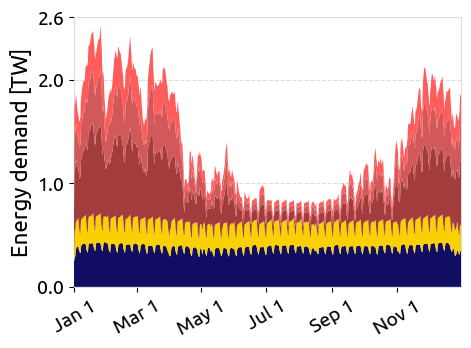

In [62]:
from matplotlib.dates import DateFormatter
from matplotlib import dates as mdates

plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'

plt.rcParams.update({"axes.grid" : True, "grid.color" :"white" , "grid.linestyle":"solid"})

fig,axs = plt.subplots(figsize=(5,3.5) , )   #or  ccrs.Orthographic() .Mercator
fig.subplots_adjust(wspace=0.3)
#n=pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.0__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc')

bar_width=0.5
index=np.arange(4) 

ordering2 = [ 'electricity',
 'land transport EV',
 'urban central heat',
 'urban decentral heat',
 'rural heat',
 'industry electricity',
  'solid biomass for industry',
 'naphtha for industry',
 'gas for industry',
 'H2 for industry',
 'low-temperature heat for industry',
 'industry methanol',
 'agriculture electricity',
 'agriculture heat',
 'agriculture machinery oil',
 'kerosene for aviation',
 'shipping methanol',
         ]

df_load = n.loads_t.p.sum().groupby(n.loads.carrier).sum() * (8760/len(n.snapshots)) # hourly resolution
df_load_time = n.loads_t.p.groupby(n.loads.carrier,axis =1).sum().reindex(columns=ordering2) * (8760/len(n.snapshots)) 

to_plot_constant= n.loads.p_set.groupby(n.loads.carrier).sum().reindex(ordering2) ##list of constant demands
to_plot_variable= [] ##list of variable demands


bottom= 0
bottom_1= 0
bottom_2 =0
bottom_3=0
for color, component in enumerate(to_plot_constant.index):
    if  to_plot_constant.loc[component] == 0:
 
        to_plot_variable.append(component)

axs.stackplot(df_load_time[to_plot_variable].rolling('D').mean().index , #.resample('D')
                 df_load_time[to_plot_variable].rolling('D').mean().T/1e6 ,  #.resample('D')
                 colors= [tech_colors_[i] for i  in to_plot_variable], zorder=3)

axs.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
axs.xaxis.set_major_formatter(DateFormatter('%b %-d'))
axs.tick_params(axis='x', labelsize=14, labelrotation=30) #, ha='right')    
axs.tick_params(axis='y', labelsize=14, )    
axs.set_ylabel('Energy demand [TW]', fontsize=16)   
axs.set_xlim([n.snapshots[0],n.snapshots[-1] ])
axs.set_yticks([0,1,2,2.6])    

axs.set_ylim([0,2.6])
#for i,label in enumerate(axs.xaxis.get_ticklabels()[::2]):
 #   label.set_visible(False)
#label= axs.xaxis.get_ticklabels()[::2]
#axs.set_xticklabels(label)
axs.grid(axis = 'y' , color='gainsboro', linestyle='dashed', zorder=0)

                  

In [64]:
n.loads_t.p.loc[:,[i for i in n.loads.index if 'heat' in i and 'agri' not in i and 'indus' not in i]].sum(axis=1).max()/1e6

1.1245195987290002

In [53]:
n.loads_t.p.loc[:,[i for i in n.loads.index if 'land transport' in i ]].sum(axis=1).max()/1e6

0.2499714182821804

In [56]:
n.loads_t.p.loc[:,[i for i in n.loads.index if n.loads.carrier[i]=='electricity' ]].sum(axis=1).max()/1e6

0.2505670109850087

In [57]:
1.1245195987290002+0.2499714182821804+0.2505670109850087



1.6250580279961893

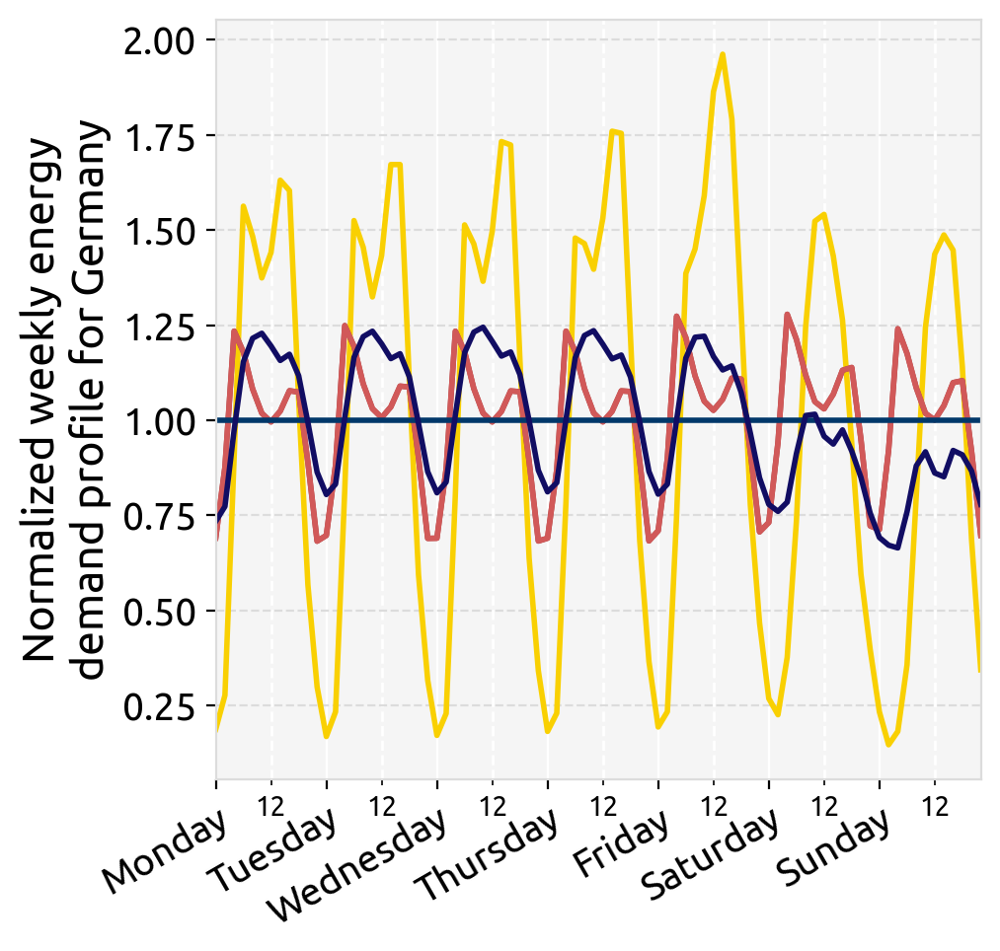

In [27]:
from matplotlib.ticker import MultipleLocator, FuncFormatter, NullFormatter
from matplotlib import dates as mdates


fig,axs = plt.subplots(figsize=(5,5) , dpi=200)   #or  ccrs.Orthographic() .Mercator
axs.set_ylabel('Normalized weekly energy\ndemand profile for Germany', fontsize=16)   
axs.grid(axis = 'y' , color='gainsboro', linestyle='dashed', zorder=0)
axs.set_facecolor("whitesmoke")
country='DE0 0'
for i, load_ in enumerate(['land transport EV',
 'urban central heat',
 'urban decentral heat', ##all heat demands have same profile
 #'rural heat',
 'industry electricity',
  'electricity',   ]):
  component = country if load_=='electricity' else (country+' '+ load_)

  df_temp=pd.DataFrame(n.loads_t.p.loc[:, component]) 
  index =df_temp[72:72+84].index

  df_temp['weekday']=(df_temp.index.weekday)
  df_temp['hour']=(df_temp.index.hour)
  #df_temp = n.loads_t.p.loc[:, component].groupby([n.snapshots.weekday, n.snapshots.hour])
    
  axs.plot(index, (df_temp.groupby([df_temp['weekday'], df_temp['hour']]).mean()/
         n.loads_t.p.loc[:, component].mean()), 
            color= tech_colors_[load_], linewidth=2)

  #axs.fill_between(np.arange(7)+1,
  #                ((df_temp.mean()-df_temp.std())/n.loads_t.p.loc[:, component].mean()).values,
  #                ((df_temp.mean()+df_temp.std())/n.loads_t.p.loc[:, component].mean()).values,
     #              color= tech_colors_[load_], alpha=.2)
  # 

axs.set_xlim([index[0],index[-1] ])
axs.xaxis.set_major_locator(mdates.DayLocator())
axs.xaxis.set_minor_locator(mdates.HourLocator(byhour = [12]))
axs.xaxis.set_major_formatter(mdates.DateFormatter('%A'))
axs.xaxis.set_minor_formatter(mdates.DateFormatter("%H"))
#axs.tick_params(axis='x', labelrotation=30, labelsize=14 )   
plt.setp(axs.get_xticklabels(), rotation=30, ha="right",
         rotation_mode="anchor", fontsize=14)
axs.tick_params(axis='y', labelsize=14 )    

#axs.grid(which = "major", axis = "x", linestyle = "-", linewidth = 1)
axs.grid(which = "minor", axis = "x", linestyle = "--", linewidth = 1)

#r = axs.fill(np.NaN, np.NaN, 'snow', alpha=1)
#plt.legend()
#plt.savefig('temp.pdf')

## Figure 6

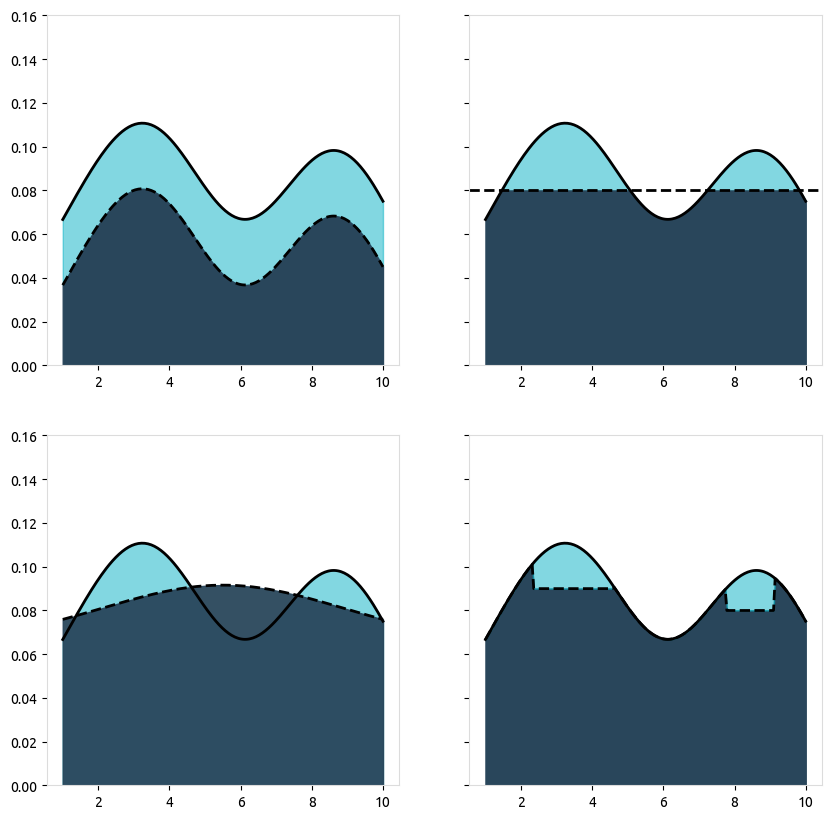

In [18]:
import copy

fig,axs = plt.subplots(2,2, figsize=(10,10) ,sharey= True )   #or  ccrs.Orthographic() .Mercator

for ax in axs.flat:
    ax.set_ylim(0,0.16)
    
colors= ['#3c73a8','#b1d1fc'] ##dark , light
colors= ['#005249','#0f9b8e']
colors= ['#014184','#b1d1fc']
colors= ['#29465b','#06b1c4']

axs[0,0].plot(x,y, color='black', linewidth=2)
axs[0,0].plot(x,y-0.03, color='black', linewidth=2, linestyle='dashed')
axs[0,0].fill_between(x,y-0.03,y,
                  color= colors[1], alpha=0.5)  ##light blue
axs[0,0].fill_between(x,0,y-0.03,
                  color= colors[0], ) ##dark blue

y_temp=copy.deepcopy(y)
y_temp[y_temp>0.08] = 0.08
axs[0,1].plot(x,y, color='black', linewidth=2)
axs[0,1].axhline(0.08, color='black', linewidth=2, linestyle='dashed')
axs[0,1].fill_between(x,y_temp,y,
                  color= colors[1], alpha=0.5)
axs[0,1].fill_between(x,0,y_temp,
                  color= colors[0], )

y_temp= gaussian(x_values, 0, 15)+0.065
#y_temp[y_temp>0.08] = 0.08
axs[1,0].plot(x,y, color='black', linewidth=2)
axs[1,0].plot(x, y_temp, color='black', linewidth=2, linestyle='dashed')
axs[1,0].fill_between(x,0,y,
                  color= colors[1],alpha=  0.5)
axs[1,0].fill_between(x,0,y_temp,
                  color= colors[0], alpha=  0.95)

y_temp=copy.deepcopy(y)
y_temp[150:180] = 0.08
y_temp[30:80] = 0.09

axs[1,1].plot(x,y, color='black', linewidth=2)
axs[1,1].plot(x, y_temp, color='black', linewidth=2, linestyle='dashed')
axs[1,1].fill_between(x,0,y_temp,
                  color= colors[0],)
axs[1,1].fill_between(x,y_temp,y,
                  color= colors[1], alpha=0.5)


In [ ]:
ed

In [ ]:
3e

## Supplementary Figure 1

In [29]:
n= pypsa.Network('main_runs/postnetworks/elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc')
result_total = pd.concat([pd.Series(n.links.groupby("carrier").p_nom_opt.sum())
                                 ,pd.Series(n.storage_units.groupby("carrier").p_nom_opt.sum())
                                 ,pd.Series(n.generators.loc[[i for i in n.generators.index if
             n.generators.carrier[i] not in ['coal','lignite','oil','gas']]].groupby("carrier").p_nom_opt.sum())
                    ,pd.Series({'Total-cost' : n.objective/1e09})
                                            ])

results_total=result_total.groupby(result_total.index).sum() 
rename={#'battery':'Battery storage',
        'battery charger':'Battery storage',
        #'battery discharger':'Battery storage',
               # 'home battery':'Home battery storage',
    'home battery charger':'Home battery storage',
    #'home battery discharger':'Home battery storage',                                                       
    'offwind-ac':'Offshore wind','offwind':'Offshore wind','offwind-dc':'Offshore wind', 'onwind':'Onshore wind',
                          'AC':'Transmission lines'  , 'DC':'Transmission lines','ror': 'Run of river',
                          'hydro':'Hydroelectricity' , 'nuclear':'Nuclear',#'uranium':'Nuclear',
                          'solar':'Solar utility', 'solar rooftop':'Solar rooftop',
                          'electricity distribution grid' : 'Electricity distribution grid',
                           'PHS' : 'Pumped hydro storage', 'H2':'H2 storage',
                           'SMR':'Power to gas'  , 'SMR CC':'Power to gas',#'oil': 'Oil to power/heat'
                           'Sabatier':'Power to gas', 'helmeth':'Power to gas', 'coal' : 'Coal', 'lignite' :'Coal',
                           'Li ion':'EV battery' ,    "solar inv": "Solar utility", #'gas' : 'gas storage',
                          "solar-hsat": "Solar-HSAT", 'gas pipeline new': 'gas pipeline' ,
                          "solar-hsat inv": "Solar-HSAT",
                          "solar-delta": "Solar-Delta",
                          "solar-delta20": "Solar-Delta",
                          }
to_drop = ['Total-cost', 'agriculture machinery oil','co2 sequestered',
         'kerosene for aviation',#'land transport oil',
           'naphtha for industry',
        'shipping methanol',  #'solid biomass transport',
         #'shipping oil','generators-gas'
           'process emissions', 'process emissions CC', #'oil','gas','coal',
           'process emissions','process emissions CC', 'gas for industry',
          'gas for industry CC', 'solid biomass for industry', 'solid biomass for industry CC',
             'V2G', 'BEV charger',  
           #'uranium'              
          ]
results_total1=results_total.drop(labels= to_drop)

results_total1=results_total1.rename(rename)
for ix in results_total1.index : 
                if 'resistive heater' in ix :
                    results_total1=results_total1.rename({ix : 'resistive heater',})
                if  'air heat pump' in ix :
                    results_total1=results_total1.rename({ix : 'heat pump',})
                if 'ground heat pump' in ix :
                    results_total1=results_total1.rename({ix : 'heat pump',})
                if 'gas CHP' in ix :
                    results_total1=results_total1.rename({ix : 'gas CHP',})
                if 'gas boiler' in ix :
                    results_total1=results_total1.rename({ix : 'gas boiler',})
                if 'biomass boiler' in ix :
                    results_total1=results_total1.rename({ix : 'biomass boiler',})
                if 'biomass CHP' in ix:
                    results_total1=results_total1.rename({ix : 'biomass CHP',})
                if 'oil boiler' in ix :
                    results_total1=results_total1.rename({ix : 'oil boiler',})                    
                if 'biogas' in ix :results_total1=results_total1.rename({ix:'Biogas',})
                #if  any(w in ix for w in ['gas boiler','gas CHP', 'OCGT', 'CCGT'])  :
                #    results_new1=results_new1.rename({ix:'Gas to power/heat',})
                #if 'oil' in ix :results_new1=results_new1.rename({ix:'Oil to power/heat',})
                #if 'CHP' in ix :df=df.rename({ix:'Oil and gas to power/heat',})
                #if 'biomass' in ix :results_new1=results_new1.rename({ix:'Biomass',})
                if 'solar thermal' in ix :results_total1=results_total1.rename({ix:'Solar thermal',})
                if 'water tank' in ix and 'discharger' in ix :results_total1=results_total1.rename({ix:'Heat store',})
                if 'water tank' in ix :results_total1=results_total1.rename({ix:'Heat storage',})
                if 'solar-hsat' in ix :results_total1=results_total1.rename({ix:'Solar-HSAT',})
                if 'solar-inv' in ix :results_total1=results_total1.rename({ix:'Solar utility',})      
                    
results_total1=results_total1.groupby(results_total1.index).sum() 
                   
preferred_order = pd.Index(
['Transmission lines',  'Electricity distribution grid',  
       'H2 Electrolysis', 'H2 Fuel Cell',
      'DAC',
       'Power to gas', 'Fischer-Tropsch', 
       'methanolisation', 'oil', 'biomass boiler', 'biomass CHP','Biogas',
        'heat pump', 'resistive heater',
       'biomass boiler/CHP', 'gas CHP',
       'gas boiler',  'oil boiler',  
     'H2 pipeline',
     'Coal', 'CCGT', 'OCGT', 
     'Nuclear','Battery storage', 'Home battery storage','Pumped hydro storage', 'Run of river','Hydroelectricity','offwind-float', 'Offshore wind', 'Onshore wind',
      'Solar thermal','Solar-Delta',  'Solar utility','Solar rooftop','Solar-HSAT',]
)


order = preferred_order.intersection(results_total1.index).append(
        results_total1.index.difference(preferred_order)) 
results_total1=results_total1.reindex(order) 

INFO:pypsa.io:Imported network elec_s370_37m_lv1.2__Co2L0-2H-T-H-B-I-A-solar+p2_2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores


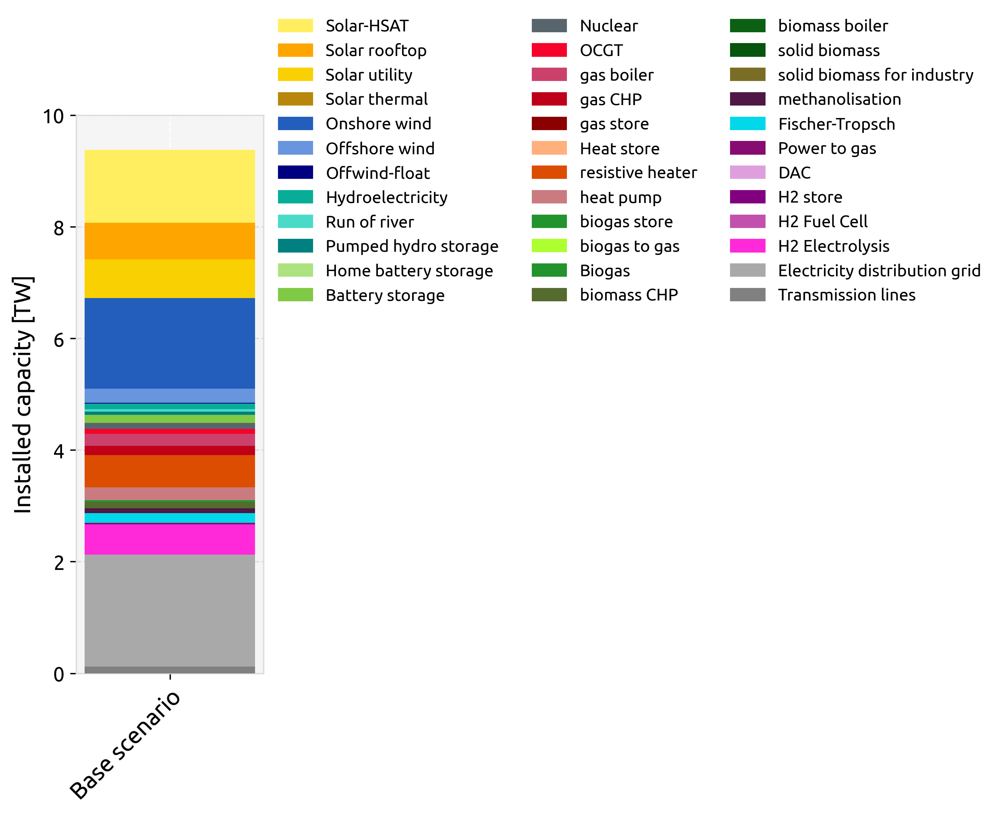

In [34]:
## Important : this figure does not include store costs
from matplotlib.patches import FancyArrowPatch
import matplotlib.font_manager
import matplotlib.lines as lines

    
fig, axs = plt.subplots(figsize=(2,6), dpi=300) #, sharey=True)


bar_width=0.5
k=0


results_total1 = results_total1.drop(labels=['Heat storage', 'gas pipeline',#'co2 vent',
                                             #'OCGT',
                                             'Heat store', 'industry methanol',
      'battery discharger', 'home battery discharger'])
##                         'Total-cost','co2 vent', 'oil','gas','coal','lignite'
##                             , 'DC','uranium','process emissions','process emissions CC',
##                             'gas for industry','gas for industry CC','solid biomass for industry',
##                             'solid biomass for industry CC','V2G', 'BEV charger',
##                                            'gas pipeline' ,'gas pipeline new' ,
##                                            'gas for industry' ,'gas for industry CC',
##                                            'biomass', 'solid biomass transport','Heat storage'])

if 1==1: 
            bottom=0
            axs.grid(axis = 'y',color='gainsboro', zorder=0)
            for color, component in enumerate(results_total1.index):
                
                  axs.bar(0, results_total1[component]/1e6 ##TW
                           , bar_width, bottom=bottom,
                           color=tech_colors[component], zorder=3, )
                  bottom+=results_total1[component]/1e6
            
axs.tick_params(axis='y', labelsize=12)
axs.set_yticks(np.arange(0, 10.1, 2)) 

axs.set_xticks([0])    
axs.set_xticklabels(['Base scenario'],fontsize=14, rotation=45,ha='right', rotation_mode='anchor')    
axs.set_ylabel('Installed capacity [TW]', fontsize=14) 

keys= ['Transmission lines', 'Electricity distribution grid',
       'H2 Electrolysis', 'H2 Fuel Cell', 'H2 store', 'DAC', 'Power to gas',
       'Fischer-Tropsch', 'methanolisation', 'solid biomass for industry',
       'solid biomass', 'biomass boiler', 'biomass CHP',
       'Biogas', 'biogas to gas', 'biogas store', 'heat pump', 'resistive heater', 'Heat store',
       'gas store', 'gas CHP', 'gas boiler', 'OCGT', 'Nuclear', 'Battery storage',
       'Home battery storage', 'Pumped hydro storage', 'Run of river',
       'Hydroelectricity', 'Offwind-float', 'Offshore wind', 'Onshore wind',
       'Solar thermal', 'Solar utility', 'Solar rooftop', 'Solar-HSAT']
            
legend_manual=[]
for key in keys: #(results_total1.index):
    key_name = 'oil imports' if key=='oil' else key
    legend_manual.append(mpatches.Patch(color=tech_colors[key], label=key_name))
legend1=plt.legend(handles=legend_manual[::-1],loc='upper left', bbox_to_anchor=(1, 1.2),ncol=3,
           fontsize=10,frameon=False)
#plt.gca().add_artist(legend1)

[Text(0, 0, 'Base')]

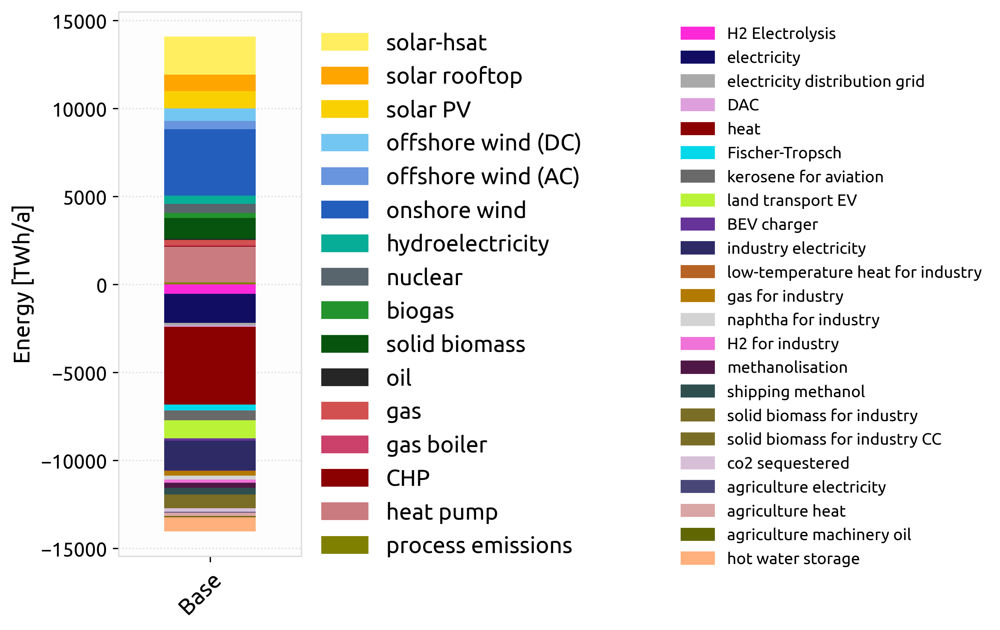

In [18]:
preferred_order = pd.Index(
    [
      'H2 Electrolysis','electricity','electricity distribution grid', 'DAC',  'heat',
        'Fischer-Tropsch', 'kerosene for aviation', 'land transport EV','BEV charger', 
       'industry electricity','low-temperature heat for industry', 'gas for industry', 
        'naphtha for industry','H2 for industry', 
        'methanolisation','shipping methanol',
       'solid biomass for industry', 'solid biomass for industry CC','co2 sequestered', 
        'agriculture electricity', 'agriculture heat',
       'agriculture machinery oil', 
        "process emissions",
       "building retrofitting",
        #"ground heat pump",
        #"air heat pump",
        "heat pump",
        "resistive heater",
        "power-to-heat",
        "gas-to-power/heat",
        "CHP",
        "OCGT",
        "gas boiler",
        "gas",
        "oil",
        "natural gas",
        "methanation",
        "ammonia",
        "hydrogen storage",
        "power-to-gas",
        "power-to-liquid",
        "battery storage",
        "hot water storage",
        "CO2 sequestration",
        "transmission lines",
        "solid biomass",
        "biogas",
        "nuclear",
        "hydroelectricity",
        "hydro reservoir",
        "run of river",
        "pumped hydro storage",
        "onshore wind",
        "offshore wind",
        "offshore wind (AC)",
        "offshore wind (DC)",
        "solar PV",
        "solar thermal",
        "solar rooftop",
        "solar",
        "solar-hsat",
 
    ]
)
if 1==1:
    energy_df = pd.read_csv(
        'main_runs/csvs/energy.csv', index_col=list(range(2)), header=list(range(4))
    )

    df = energy_df.groupby(energy_df.index.get_level_values(1)).sum()

    # convert MWh to TWh
    df = df / 1e6

    df = df.groupby(df.index.map(rename_techs)).sum()

    to_drop = df.index[
        df.abs().max(axis=1) < 50
    ]


    df = df.drop(to_drop)



    new_index = preferred_order.intersection(df.index).append(
        df.index.difference(preferred_order)
    )

    # new_columns = df.columns.sort_values()

    fig, ax = plt.subplots(figsize=(2, 6), dpi=300)

    to_plot = pd.DataFrame(df.loc[new_index, ('37m', 'v1.2', 'Co2L0-2H-T-H-B-I-A-solar+p2', '2050')]).T
    to_plot.plot(
        kind="bar",
        ax=ax,
        stacked=True,
        zorder=3,
        color=[tech_colors[i] for i in new_index],
    )

    handles, labels = ax.get_legend_handles_labels()

    handles.reverse()
    labels.reverse()

    #ax.set_ylim(
    #    [
    #        snakemake.params.plotting["energy_min"],
    #        snakemake.params.plotting["energy_max"],
    #    ]
    #)

    ax.set_ylabel("Energy [TWh/a]", fontsize=14)

    ax.set_xlabel("")

    ax.grid(axis="x")

   # ax.legend(
   #     handles, labels,
   #     ncol=1, loc="upper left", bbox_to_anchor=[1, 1], frameon=False
   # )
pos_labels =[]
neg_labels =[]



for component in to_plot.columns:
    if to_plot[component].sum() > 0:
       pos_labels.append(component)
    else: 
       neg_labels.append(component)
     
legend_manual=[]     
for key in (pos_labels):
    legend_manual.append(mpatches.Patch(color=tech_colors[key], label=key))
legend1=plt.legend(handles=legend_manual[::-1],loc='upper left', bbox_to_anchor=(1, 1),ncol=1,
           fontsize=14,frameon=False)
plt.gca().add_artist(legend1)    

legend_manual=[]     
for key in (neg_labels):
    legend_manual.append(mpatches.Patch(color=tech_colors[key], label=key))
legend2=plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(3, 1),ncol=1,
           fontsize=10,frameon=False)
#plt.gca().add_artist(legend2)     
     
ax.tick_params(axis='y', labelsize=12)    
ax.set_xticks([0])    
ax.set_xticklabels(['Base'],fontsize=14, rotation=45,ha='right', rotation_mode='anchor')        